In [140]:
# import packages
import numpy as np
import math
import pandas as pd
import matplotlib.pyplot as plt
import os
from scipy.stats import variation
from scipy.optimize import curve_fit
from matplotlib.ticker import EngFormatter
from matplotlib.dates import DateFormatter

%config InlineBackend.figure_format = 'retina'
plt.rcParams.update({'font.size': 14})

In [2]:
# user-defined path to directory
litrev_dir = '/Users/Dana/Desktop/Jupyter/WISC/NaturalCommunity/lit_review_data_supp/' 

In [3]:
# method to find break in slope and calculate trends on each side of break
# written by David Dralle

def func_broken_stick(x,threshold,b1,b2,a1):
    # a1, b1 are slope and intercept for left curve
    # b2 is slope for right curve
    # intercept on right curve is determined by the intersection constraint
    a2 = (b1*threshold - b2*threshold + a1)
    return np.where(x<threshold, b1*x+a1, b2*x+a2)

def broken_stick_fit(x, y, 
                    threshold_lower_percentile_bound=0,
                    threshold_upper_percentile_bound=100, 
                    slope_left_lower = -np.inf, 
                    slope_left_upper = np.inf,
                    slope_right_lower = -np.inf,
                    slope_right_upper = np.inf
                    ):
    """
    @desc:
    Fits broken stick, with constraints if desired. Note, if using for CQ power law fits, data should first
    be log-transformed.
    
    @params:
    threshold_upper_percentile: upper bound on possible thresholds determined through a percentile on the x data
    threshold_lower_percentile: lower bound on possible thresholds determined through a percentile on the x data
    slope_left_lower: lower constraint on left slope
    slope_left_upper: upper constraint on left slope
    slope_right_lower: lower constraint on right slope
    slope_right_upper: upper constraint on right slope
    
    @returns:
    popt: fitted broken stick paramters as a list
        [threshold: threshold for slope break, 
        b1: slope on left line, 
        b2: slope on right line,
        a1: intercept on left line]
        Note that if the curves intersect, the intercept on the right curve is constrained by the other fits
        a2 = (b1*threshold - b2*threshold + a1)
    standard_errors: standard errors for the fitted parameters
    """

    
    popt_temp, pcov_temp = curve_fit(func_broken_stick, x, y, 
                                    bounds = [(np.percentile(x,threshold_lower_percentile_bound), slope_left_lower, slope_right_lower, -np.inf), 
                                              (np.percentile(x,threshold_upper_percentile_bound), slope_left_upper, slope_right_upper, np.inf)
                                             ]
                                   )
    standard_errors = np.sqrt(np.diag(pcov_temp))
    return popt_temp, standard_errors

In [48]:
def resample_10perc(array_like):
    return np.nanpercentile(array_like,10)
def resample_90perc(array_like):
    return np.nanpercentile(array_like,90)
def resample_25perc(array_like):
    return np.nanpercentile(array_like,25)
def resample_75perc(array_like):
    return np.nanpercentile(array_like,75)


In [29]:


pump_rates = []
pump_range = []
for filename in os.listdir(litrev_dir+'pump_impacts'):

    try:
        pump_range = pump_range + [float(filename[:-12])]
        pump_rates = pump_rates + [filename[:-12]]
    except:
        print('')

def extreme_flow(hydrograph,nyr):
    hydrograph['year'] = hydrograph.datetime.dt.year 
    maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
    maxflows = sorted(maxflows)
    maxflows.reverse()
    recurrence = [(len(maxflows)+1)/(i+1) for i in range(len(maxflows))]
    yrdist = [abs(nyr-recurrence[i]) for i in range(len(recurrence))]
    recurr_ind = yrdist.index(min(yrdist))
    nyr_recurr = maxflows[recurr_ind]
    return(nyr_recurr)

def resample_median(array_like):
    return np.nanpercentile(array_like,50)

def calc_pump_stats(hydrograph,site):
    hydrograph = hydrograph.resample('D').mean()
    
    annual_hydro = hydrograph.reset_index()
    annual_hydro = annual_hydro[~(annual_hydro.datetime.dt.month==2) | ~(annual_hydro.datetime.dt.day==29)]
    annual_hydro['datetime'] = np.where(annual_hydro.datetime.dt.month>=11,
                                     annual_hydro['datetime'].apply(lambda x: x.replace(year = 1998)),
                                     annual_hydro['datetime'].apply(lambda x: x.replace(year = 1999)))

    annual_hydro = annual_hydro.set_index('datetime').sort_index()
    
    annual_median = annual_hydro.resample('D').apply(resample_median)
    fig,ax = plt.subplots(1)
    
    # find season boundaries
    spring_check = annual_median[~(annual_median.Q_m3d.isna())].loc[pd.to_datetime('11-1-1998'):pd.to_datetime('4-1-1999')]
    popt, error = broken_stick_fit(list(range(len(spring_check))),
                    spring_check.Q_m3d)
    [threshold, b1, b2, a1] = popt
    ypredict = func_broken_stick(np.array(list(range(len(spring_check)))),
                                 (threshold), b1, b2, a1)
    freshet_start_date = (spring_check.index.values[int(round(threshold))])
    
    recess_check = annual_median[~(annual_median.Q_m3d.isna())].loc[pd.to_datetime('3-1-1999'):pd.to_datetime('7-15-1999')]
    popt, error = broken_stick_fit(list(range(len(recess_check))),
                    recess_check.Q_m3d)
    [threshold, b1, b2, a1] = popt
    ypredict = func_broken_stick(np.array(list(range(len(recess_check)))),
                                 (threshold), b1, b2, a1)
    recession_start_date = (recess_check.index.values[int(round(threshold))])
    
    baseflow_check = annual_median[~(annual_median.Q_m3d.isna())].loc[pd.to_datetime('6-1-1999'):pd.to_datetime('10-1-1999')]
    popt, error = broken_stick_fit(list(range(len(baseflow_check))),
                    baseflow_check.Q_m3d)
    [threshold, b1, b2, a1] = popt
    ypredict = func_broken_stick(np.array(list(range(len(baseflow_check)))),
                                 (threshold), b1, b2, a1)
    baseflow_start_date = (baseflow_check.index.values[int(round(threshold))])

    # pick pump rate as 1.25 times baseflow median
    annual_hydro = annual_hydro.sort_index().Q_m3d
    baseflow = pd.concat([annual_hydro.loc[:freshet_start_date],annual_hydro.loc[baseflow_start_date:]])
    baseflow_med = pd.concat([annual_median.loc[:freshet_start_date],annual_median.loc[baseflow_start_date:]])
    
    pump_rate = np.nanmedian(baseflow)*1.25
    pumprate_diff = abs(pump_range-pump_rate)
    pump_rate = pump_rates[list(pumprate_diff).index(min(pumprate_diff))]
    
    # read in pump impacts
    impacts = pd.read_csv(litrev_dir+'pump_impacts/'+str(pump_rate)+'_impacts.csv').drop(columns=['Unnamed: 0','times'])
    hydrograph = hydrograph.reset_index().merge(impacts,left_index=True,right_index=True,how='left')
    hydrograph['Q_impact'] = hydrograph.Q_m3d-hydrograph.Qs
    print(hydrograph['Q_impact'])
    
    impact_annual = hydrograph.reset_index()
    impact_annual = impact_annual[~(impact_annual.datetime.dt.month==2) | ~(impact_annual.datetime.dt.day==29)]
    impact_annual['datetime'] = np.where(impact_annual.datetime.dt.month>=11,
                                     impact_annual['datetime'].apply(lambda x: x.replace(year = 1998)),
                                     impact_annual['datetime'].apply(lambda x: x.replace(year = 1999)))

    impact_annual = impact_annual.set_index('datetime').sort_index().Q_impact
    impact_median = impact_annual.resample('D').apply(resample_median)
    
    # find season boundaries for impacted hydrograph
    spring_check = impact_median[~(impact_median.isna())].loc[pd.to_datetime('11-1-1998'):pd.to_datetime('4-1-1999')]
    popt, error = broken_stick_fit(list(range(len(spring_check))),
                    spring_check)
    [threshold, b1, b2, a1] = popt
    ypredict = func_broken_stick(np.array(list(range(len(spring_check)))),
                                 (threshold), b1, b2, a1)
    freshet_start_impact = (spring_check.index.values[int(round(threshold))])
    
    recess_check = impact_median[~(impact_median.isna())].loc[pd.to_datetime('3-1-1999'):pd.to_datetime('7-15-1999')]
    popt, error = broken_stick_fit(list(range(len(recess_check))),
                    recess_check)
    [threshold, b1, b2, a1] = popt
    ypredict = func_broken_stick(np.array(list(range(len(recess_check)))),
                                 (threshold), b1, b2, a1)
    recession_start_impact = (recess_check.index.values[int(round(threshold))])
    
    baseflow_check = impact_median[~(impact_median.isna())].loc[pd.to_datetime('6-1-1999'):pd.to_datetime('10-1-1999')]
    popt, error = broken_stick_fit(list(range(len(baseflow_check))),
                    baseflow_check)
    [threshold, b1, b2, a1] = popt
    ypredict = func_broken_stick(np.array(list(range(len(baseflow_check)))),
                                 (threshold), b1, b2, a1)
    baseflow_start_impact = (baseflow_check.index.values[int(round(threshold))])
    
    recession_start_date_impact = recession_start_date
    baseflow_start_date_impact = baseflow_start_date
    freshet_start_date_impact = freshet_start_date
    
    # calculate changes in seasonal timing, length of season
    diff_date_recession = recession_start_date_impact-recession_start_date
    diff_date_freshet = freshet_start_date_impact - freshet_start_date
    diff_date_baseflow = baseflow_start_date_impact - baseflow_start_date
     
    diff_date_recession = (diff_date_recession.astype('timedelta64[D]') / np.timedelta64(1, 'D'))
    diff_date_freshet = (diff_date_freshet.astype('timedelta64[D]') / np.timedelta64(1, 'D'))
    diff_date_baseflow = (diff_date_baseflow.astype('timedelta64[D]') / np.timedelta64(1, 'D'))
    
    freshet_length = (recession_start_date-freshet_start_date)
    freshet_length = freshet_length.astype('timedelta64[D]') / np.timedelta64(1, 'D')
    baseflow_length = (pd.to_datetime('10-31-1999')-baseflow_start_date)
    baseflow_length1 = (pd.to_datetime(recession_start_date)-pd.to_datetime('11-1-1998'))
    baseflow_length = baseflow_length + baseflow_length1
    baseflow_length = baseflow_length.days#astype('timedelta64[D]') / np.timedelta64(1, 'D')
    recession_length = (baseflow_start_date-recession_start_date)
    recession_length = recession_length.astype('timedelta64[D]') / np.timedelta64(1, 'D')
    
    freshet_length_impact = (recession_start_date_impact-freshet_start_date_impact)
    freshet_length_impact = freshet_length_impact.astype('timedelta64[D]') / np.timedelta64(1, 'D')
    baseflow_length_impact = (pd.to_datetime('10-31-1999')-baseflow_start_date_impact)
    baseflow_length1_impact = (pd.to_datetime(recession_start_date_impact)-pd.to_datetime('11-1-1998'))
    baseflow_length_impact = baseflow_length_impact + baseflow_length1_impact
    baseflow_length_impact = baseflow_length_impact.days#astype('timedelta64[D]') / np.timedelta64(1, 'D')
    recession_length_impact = (baseflow_start_date_impact-recession_start_date_impact)
    recession_length_impact = recession_length_impact.astype('timedelta64[D]') / np.timedelta64(1, 'D')
    
    freshet_length_diff = (freshet_length_impact-freshet_length)/freshet_length*100
    baseflow_length_diff = (baseflow_length_impact-baseflow_length)/baseflow_length*100
    recession_length_diff =  (recession_length_impact-recession_length)/recession_length*100

    


    # baseflow period statistics:
    baseflow_impact = impact_annual.loc[:freshet_start_impact]
    baseflow_impact = pd.concat([baseflow_impact,impact_annual.loc[baseflow_start_impact:]],sort=False)

    baseflow_q50 = np.nanmedian(baseflow.values)
    baseflow_q50_impact = np.nanmedian(baseflow_impact.values)
    baseflow_q50_diff = (baseflow_q50_impact-baseflow_q50)/baseflow_q50*100
    
    baseflow_q90 = np.nanpercentile(baseflow.values,10)
    baseflow_q90_impact = np.nanpercentile(baseflow_impact.values,10)
    baseflow_q90_diff = (baseflow_q90_impact-baseflow_q90)/baseflow_q90*100
    
    baseflow_q5 = np.nanpercentile(baseflow.values,95)
    baseflow_q5_impact = np.nanpercentile(baseflow_impact.values,95)
    baseflow_q5_diff = (baseflow_q5_impact-baseflow_q5)/baseflow_q5*100
    
    baseflow_q95 = np.nanpercentile(baseflow.values,5)
    baseflow_q95_impact = np.nanpercentile(baseflow_impact.values,5)
    baseflow_q95_diff = (baseflow_q95_impact-baseflow_q95)/baseflow_q95*100

    basecv = variation(baseflow[~(baseflow.isna())].values)
    impactcv = variation(baseflow_impact[~(baseflow_impact.isna())].values)
    baseflow_cv_diff = (impactcv-basecv)/basecv*100
    
    base_daily_roc = np.array(baseflow.values[1:])-np.array(baseflow.values[:-1])
    impact_daily_roc = np.array(baseflow_impact.values[1:])-np.array(baseflow_impact.values[:-1])
    base_daily_roc = np.nanmean(base_daily_roc)
    impact_daily_roc = np.nanmean(impact_daily_roc)
    baseflow_daily_roc_diff = (impact_daily_roc-base_daily_roc)/base_daily_roc*100

    # calculate freshet statistics
    freshet = annual_hydro.loc[freshet_start_date:recession_start_date]
    freshet_impact = impact_annual.loc[freshet_start_date_impact:recession_start_date_impact]

    freshet_q50 = np.nanpercentile(freshet.values,50)
    freshet_q50_impact = np.nanpercentile(freshet_impact.values,50)
    freshet_q50_diff = (freshet_q50_impact-freshet_q50)/freshet_q50*100
    
    freshet_q5 = np.nanpercentile(freshet.values,95)
    freshet_q5_impact = np.nanpercentile(freshet_impact.values,95)
    freshet_q5_diff = (freshet_q5_impact-freshet_q5)/freshet_q5*100
    
    freshet_q95 = np.nanpercentile(freshet.values,5)
    freshet_q95_impact = np.nanpercentile(freshet_impact.values,5)
    freshet_q95_diff = (freshet_q95_impact-freshet_q95)/freshet_q95*100
    
    freshet_end_flow = np.nanmedian(freshet.values[-5:])
    freshet_end_flow_impact = np.nanmedian(freshet_impact.values[-5:])
    freshet_end_flow_diff = (freshet_end_flow_impact-freshet_end_flow)/freshet_end_flow*100
    
    freshet_rate = (freshet_end_flow-np.nanmedian(freshet.values[:5]))/freshet_length
    freshet_rate_impact = (freshet_end_flow_impact-np.nanmedian(freshet_impact.values[:5]))/freshet_length_impact
    freshet_rate_diff = (freshet_rate_impact-freshet_rate)/freshet_rate
    
    freshcv = variation(freshet[~(freshet.isna())].values)
    freshimpactcv = variation(freshet_impact[~(freshet_impact.isna())].values)
    freshet_cv_diff = (freshimpactcv-freshcv)/freshcv*100

    # calculate recession statistics
    recession = annual_hydro.loc[recession_start_date:baseflow_start_date]
    recession_impact = impact_annual.loc[recession_start_date_impact:baseflow_start_date_impact]

    recession_q50 = np.nanpercentile(recession.values,50)
    recession_q50_impact = np.nanpercentile(recession_impact.values,50)
    recession_q50_diff = (recession_q50_impact-recession_q50)/recession_q50*100
    
    recession_q5 = np.nanpercentile(recession.values,95)
    recession_q5_impact = np.nanpercentile(recession_impact.values,95)
    recession_q5_diff = (recession_q5_impact-recession_q5)/recession_q5*100
    
    recession_q95 = np.nanpercentile(recession.values,5)
    recession_q95_impact = np.nanpercentile(recession_impact.values,5)
    recession_q95_diff = (recession_q95_impact-recession_q95)/recession_q95*100
    
    recesscv = variation(recession[~(recession.isna())].values)
    recessimpactcv = variation(recession_impact[~(recession_impact.isna())].values)
    recession_cv_diff = (recessimpactcv-recesscv)/recesscv*100
    
    recession_rate = (np.nanmedian(recession.values[-5:])-np.nanmedian(recession.values[:5]))/recession_length
    recession_rate_impact = (np.nanmedian(recession_impact.values[-5:])-np.nanmedian(recession_impact.values[:5]))/recession_length_impact
    recession_rate_diff = (recession_rate_impact-recession_rate)/recession_rate
    
    # calculate annual extremes
    recurr2 = extreme_flow(hydrograph.reset_index().rename(columns={'Q_m3d':'flow'}),2)
    recurr2_impact = extreme_flow(hydrograph.reset_index().rename(columns={'Q_impact':'flow'}),2)
    recurr2_diff = (recurr2_impact-recurr2)/recurr2*100
    
    recurr5 = extreme_flow(hydrograph.reset_index().rename(columns={'Q_m3d':'flow'}),5)
    recurr5_impact = extreme_flow(hydrograph.reset_index().rename(columns={'Q_impact':'flow'}),5)
    recurr5_diff = (recurr5_impact-recurr5)/recurr5*100
    
    recurr10 = extreme_flow(hydrograph.reset_index().rename(columns={'Q_m3d':'flow'}),10)
    recurr10_impact = extreme_flow(hydrograph.reset_index().rename(columns={'Q_impact':'flow'}),10)
    recurr10_diff = (recurr10_impact-recurr10)/recurr10*100
    
    q5 = np.nanpercentile(annual_hydro.values,95)
    q5_impact = np.nanpercentile(impact_annual.values,95)
    q5_diff = (q5_impact-q5)/q5*100
    
    q95 = np.nanpercentile(annual_hydro.values,5)
    q95_impact = np.nanpercentile(impact_annual.values,5)
    q95_diff = (q95_impact-q95)/q95*100
    
    num_years = len(hydrograph.reset_index().datetime.dt.year.drop_duplicates())
    freq_2yr = len(hydrograph[hydrograph.Q_m3d>=recurr2])/num_years
    freq_2yr_impact = len(hydrograph[hydrograph.Q_impact>recurr2_impact])/num_years
    if freq_2yr == 0:
        freq_2yr_diff = 0
    else:
        freq_2yr_diff = (freq_2yr_impact-freq_2yr)/freq_2yr*100
    
    freq_5yr = len(hydrograph[hydrograph.Q_m3d>=recurr5])/num_years
    freq_5yr_impact = len(hydrograph[hydrograph.Q_impact>=recurr5_impact])/num_years
    if freq_5yr==0:
        freq_5yr_diff = 0
    else:
        freq_5yr_diff = (freq_5yr_impact-freq_5yr)/freq_5yr*100
    
    freq_10yr = len(hydrograph[hydrograph.Q_m3d>=recurr10])/num_years
    freq_10yr_impact = len(hydrograph[hydrograph.Q_impact>=recurr10_impact])/num_years
    if freq_10yr==0:
        freq_10yr_diff = 0
    else:
        freq_10yr_diff = (freq_10yr_impact-freq_10yr)/freq_10yr*100
    
    # calcualte extreme frequency by season
    freq_2yr_freshet = len(freshet[freshet>=recurr2])/num_years
    freq_2yr_freshet_impact = len(freshet_impact[freshet_impact>=recurr2_impact])/num_years
    if freq_2yr_freshet==0:
        freq_2yr_freshet_diff=0
    else:
        freq_2yr_freshet_diff = (freq_2yr_freshet_impact-freq_2yr_freshet)/freq_2yr_freshet*100
    
    freq_5yr_freshet = len(freshet[freshet>=recurr5])/num_years
    freq_5yr_freshet_impact = len(freshet_impact[freshet_impact>=recurr5_impact])/num_years
    if freq_5yr_freshet==0:
        freq_5yr_freshet_diff=0
    else:
        freq_5yr_freshet_diff = (freq_5yr_freshet_impact-freq_5yr_freshet)/freq_5yr_freshet*100
    
    freq_10yr_freshet = len(freshet[freshet>=recurr10])/num_years
    freq_10yr_freshet_impact = len(freshet_impact[freshet_impact>=recurr10_impact])/num_years
    if freq_10yr_freshet==0:
        freq_10yr_freshet_diff = 0
    else:
        freq_10yr_freshet_diff = (freq_10yr_freshet_impact-freq_10yr_freshet)/freq_10yr_freshet*100
    
    freq_2yr_recession = len(recession[recession>=recurr2])/num_years
    freq_2yr_recession_impact = len(recession_impact[recession_impact>=recurr2_impact])/num_years
    if freq_2yr_recession==0:
        freq_2yr_recession_diff=0
    else:
        freq_2yr_recession_diff = (freq_2yr_recession_impact-freq_2yr_recession)/freq_2yr_recession*100
    
    freq_5yr_recession = len(recession[recession>=recurr5])/num_years
    freq_5yr_recession_impact = len(recession_impact[recession_impact>=recurr5_impact])/num_years
    if freq_5yr_recession==0:
        freq_5yr_recession_diff=0
    else:
        freq_5yr_recession_diff = (freq_5yr_recession_impact-freq_5yr_recession)/freq_5yr_recession*100
    
    freq_10yr_recession = len(recession[recession>recurr10])/num_years
    freq_10yr_recession_impact = len(recession_impact[recession_impact>=recurr10_impact])/num_years
    if freq_10yr_recession==0:
        freq_10yr_recession_diff = 0
    else:
        freq_10yr_recession_diff = (freq_10yr_recession_impact-freq_10yr_recession)/freq_10yr_recession*100
    
    freq_2yr_baseflow = len(baseflow[baseflow>recurr2])/num_years
    freq_2yr_baseflow_impact = len(baseflow_impact[baseflow_impact>=recurr2_impact])/num_years
    if freq_2yr_baseflow == 0:
        freq_2yr_baseflow_diff = 0
    else:
        freq_2yr_baseflow_diff = (freq_2yr_baseflow_impact-freq_2yr_baseflow)/freq_2yr_baseflow*100
    
    freq_5yr_baseflow = len(baseflow[baseflow>recurr5])/num_years
    freq_5yr_baseflow_impact = len(baseflow_impact[baseflow_impact>=recurr5_impact])/num_years
    if freq_5yr_baseflow==0:
        freq_5yr_baseflow_diff = 0
    else:
        freq_5yr_baseflow_diff = (freq_5yr_baseflow_impact-freq_5yr_baseflow)/freq_5yr_baseflow*100
    
    freq_10yr_baseflow = len(baseflow[baseflow>recurr10])/num_years
    freq_10yr_baseflow_impact = len(baseflow_impact[baseflow_impact>=recurr10_impact])/num_years
    if freq_10yr_baseflow==0:
        freq_10yr_baseflow_diff = 0
    else:
        freq_10yr_baseflow_diff = (freq_10yr_baseflow_impact-freq_10yr_baseflow)/freq_10yr_baseflow*100
    
    # calculate durations of Q5 and Q95 flows throughout year and seasons
    freq_q5 = len(hydrograph[hydrograph.Q_m3d>q5])/num_years
    freq_q5_impact = len(hydrograph[hydrograph.Q_impact>q5])/num_years
    if freq_q5==0:
        freq_q5_diff = 0
    else:
        freq_q5_diff = (freq_q5_impact-freq_q5)/freq_q5*100
    
    freq_q95 = len(hydrograph[hydrograph.Q_m3d<q95])/num_years
    freq_q95_impact = len(hydrograph[hydrograph.Q_impact<q95])/num_years
    if freq_q95==0 and freq_q95_impact>0:
        freq_q95_diff = 100
    elif freq_q95==0:
        freq_q95_diff = 0
    else:        
        freq_q95_diff = (freq_q95_impact-freq_q95)/freq_q95*100
    
    freq_q5_recession = len(recession[recession>q5])/num_years
    freq_q5_recession_impact = len(recession_impact[recession_impact>q5])/num_years
    if freq_q5_recession==0:
        freq_q5_recession_diff = 0
    else:
        freq_q5_recession_diff = (freq_q5_recession_impact-freq_q5_recession)/freq_q5_recession*100
    
    freq_q95_recession = len(recession[recession<q95])/num_years
    freq_q95_recession_impact = len(recession_impact[recession_impact<q95])/num_years
    if freq_q95_recession==0 and freq_q95_recession_impact>0:
        freq_q95_recession_diff = 100
    elif freq_q95_recession==0:
        freq_q95_recession_diff = 0
    else:        
        freq_q95_recession_diff = (freq_q95_recession_impact-freq_q95_recession)/freq_q95_recession*100
    
    freq_q5_freshet = len(freshet[freshet>q5])/num_years
    freq_q5_freshet_impact = len(freshet_impact[freshet_impact>q5])/num_years
    if freq_q5_freshet==0:
        freq_q5_freshet_diff = 0
    else:
        freq_q5_freshet_diff = (freq_q5_freshet_impact-freq_q5_freshet)/freq_q5_freshet*100
    
    freq_q95_freshet = len(freshet[freshet<q95])/num_years
    freq_q95_freshet_impact = len(freshet_impact[freshet_impact<q95])/num_years
    if freq_q95_freshet==0 and freq_q95_freshet_impact>0:
        freq_q95_freshet_diff = 100
    elif freq_q95_freshet==0:
        freq_q95_freshet_diff = 0
    else:
        freq_q95_freshet_diff = (freq_q95_freshet_impact-freq_q95_freshet)/freq_q95_freshet*100
    
    freq_q5_baseflow = len(baseflow[baseflow>q5])/num_years
    freq_q5_baseflow_impact = len(baseflow_impact[baseflow_impact>q5])/num_years
    if freq_q5_baseflow==0:
        freq_q5_baseflow_diff = 0
    else:
        freq_q5_baseflow_diff = (freq_q5_baseflow_impact-freq_q5_baseflow)/freq_q5_baseflow*100
    
    freq_q95_baseflow = len(baseflow[baseflow<q95])/num_years
    freq_q95_baseflow_impact = len(baseflow_impact[baseflow_impact<q95])/num_years
    if freq_q95_baseflow==0 and freq_q95_baseflow_impact>0:
        freq_q95_baseflow_diff = 100
    elif freq_q95_baseflow==0:
        freq_q95_baseflow_diff = 0
    else:
        freq_q95_baseflow_diff = (freq_q95_baseflow_impact-freq_q95_baseflow)/freq_q95_baseflow*100
    
    # stats for extreme low flow timing and duration during baseflow
    
    baseflow_order = baseflow.reset_index()
    baseflow_order['datetime'] = np.where(baseflow_order.datetime.dt.month<6,
                                     baseflow_order['datetime'].apply(lambda x: x.replace(year = 1999)),
                                     baseflow_order['datetime'].apply(lambda x: x.replace(year = 1998)))
    
    baseflow_order_impact = baseflow_impact.reset_index()
    baseflow_order_impact['datetime'] = np.where(baseflow_order_impact.datetime.dt.month<6,
                                     baseflow_order_impact['datetime'].apply(lambda x: x.replace(year = 1999)),
                                     baseflow_order_impact['datetime'].apply(lambda x: x.replace(year = 1998)))
    
    baseflow_order['lowflow'] = np.where(baseflow_order.Q_m3d>baseflow_q95,0,1)
    baseflow_order_impact['lowflow'] = np.where(baseflow_order_impact.Q_impact>baseflow_q95,0,1)
    
    baseflow_lowstart = baseflow_order[baseflow_order.lowflow==1].datetime.values[0]
    baseflow_lowstart_impact = baseflow_order_impact[baseflow_order_impact.lowflow==1].datetime.values[0]
    baseflow_lowstart_diff = baseflow_lowstart_impact-baseflow_lowstart
    baseflow_lowstart_diff = baseflow_lowstart_diff.astype('timedelta64[D]') / np.timedelta64(1, 'D')
    
    baseflow_lowsmooth = baseflow_order.set_index('datetime').resample('5D').min()
    
    try:
        baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
        baseflow_lowsmooth_impact = baseflow_order_impact.set_index('datetime').resample('2D').max()
        baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
        baseflow_lowduration = baseflow_lowend-baseflow_lowstart
        baseflow_lowduration = baseflow_lowduration.astype('timedelta64[D]')/np.timedelta64(1,'D')
        baseflow_lowduration_impact = baseflow_lowend_impact-baseflow_lowstart_impact
        baseflow_lowduration_impact = baseflow_lowduration_impact.astype('timedelta64[D]')/np.timedelta64(1,'D')
        baseflow_lowduration_diff = (baseflow_lowduration_impact-baseflow_lowduration)/baseflow_lowduration
    except:
        print('no baseflow duration stat')
    
    
    # calculate stats for timing of annual and seasonal peak and low flows
    hydrograph = hydrograph.set_index('datetime')
    
    years = hydrograph.reset_index().datetime.dt.year.drop_duplicates().values
    
    baseflow_min = []
    baseflow_min_impact = []
    baseflow_max = []
    baseflow_max_impact = []
    recession_min = []
    recession_min_impact = []
    recession_max = []
    recession_max_impact = []
    freshet_min = []
    freshet_min_impact = []
    freshet_max = []
    freshet_max_impact = []
    annual_min =[]
    annual_min_impact = []
    annual_max = []
    annual_max_impact = []
    for year in years:
        b = baseflow.loc[pd.to_datetime('6-1-'+str(year)):pd.to_datetime('6-1-'+str(year+1))]
        b1 = baseflow_impact.loc[pd.to_datetime('6-1-'+str(year)):pd.to_datetime('6-1-'+str(year+1))]
        r = recession.loc[pd.to_datetime('2-1-'+str(year)):pd.to_datetime('2-1-'+str(year+1))]
        r1 = recession_impact.loc[pd.to_datetime('1-1-'+str(year)):pd.to_datetime('2-1-'+str(year+1))]
        f = freshet.loc[pd.to_datetime('12-1-'+str(year-1)):pd.to_datetime('12-1-'+str(year))]
        f1 = freshet_impact.loc[pd.to_datetime('6-1-'+str(year)):pd.to_datetime('6-1-'+str(year+1))]
        a = hydrograph.Q_m3d.loc[pd.to_datetime('10-1-'+str(year-1)):pd.to_datetime('10-1-'+str(year))]
        a1 = hydrograph.Q_impact.loc[pd.to_datetime('10-1-'+str(year-1)):pd.to_datetime('10-1-'+str(year))]
        
        try:
            bmin = pd.to_datetime(b[b==np.nanmin(b)].index.values[0])
            bmin_impact = pd.to_datetime(b1[b1==np.nanmin(b1)].index.values[0])
            bmax = pd.to_datetime(b[b==np.nanmax(b)].index.values[0])
            bmax_impact = pd.to_datetime(b1[b1==np.nanmin(b1)].index.values[0])
            bmin = "%02d-%02d" %(bmin.month,bmin.day) 
            bmax = "%02d-%02d" %(bmax.month,bmax.day) 
            bmin_impact = "%02d-%02d" %(bmin_impact.month,bmin_impact.day) 
            bmax_impact = "%02d-%02d" %(bmax_impact.month,bmax_impact.day) 
        except:
            bmin = np.nan
            bmin_impact = np.nan
            bmax = np.nan
            bmax_impact = np.nan
        try:
            rmin = pd.to_datetime(r[r==np.nanmin(r)].index.values[0])
            rmin_impact = pd.to_datetime(r1[r1==np.nanmin(r1)].index.values[0])
            rmax = pd.to_datetime(r[r==np.nanmax(r)].index.values[0])
            rmax_impact = pd.to_datetime(r1[r1==np.nanmin(r1)].index.values[0])
            rmin = "%02d-%02d" %(rmin.month,rmin.day) 
            rmax = "%02d-%02d" %(rmax.month,rmax.day) 
            rmin_impact = "%02d-%02d" %(rmin_impact.month,rmin_impact.day) 
            rmax_impact = "%02d-%02d" %(rmax_impact.month,rmax_impact.day)
        except:
            rmin = np.nan
            rmin_impact = np.nan
            rmax = np.nan
            rmax_impact = np.nan
        try:    
            fmin = pd.to_datetime(f[f==np.nanmin(f)].index.values[0])
            fmin_impact = pd.to_datetime(f1[f1==np.nanmin(f1)].index.values[0])
            fmax = pd.to_datetime(f[f==np.nanmax(f)].index.values[0])
            fmax_impact = pd.to_datetime(f1[f1==np.nanmin(f1)].index.values[0])
            fmin = "%02d-%02d" %(fmin.month,fmin.day) 
            fmax = "%02d-%02d" %(fmax.month,fmax.day) 
            fmin_impact = "%02d-%02d" %(fmin_impact.month,fmin_impact.day) 
            fmax_impact = "%02d-%02d" %(fmax_impact.month,fmax_impact.day) 
        except:
            fmin = np.nan
            fmin_impact = np.nan
            fmax = np.nan
            fmax_impact = np.nan
        try:    
            amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
            amin_impact = pd.to_datetime(a1[a1==np.nanmin(a1)].index.values[0])
            amax = pd.to_datetime(a[a==np.nanmax(a)].index.values[0])
            amax_impact = pd.to_datetime(a1[a1==np.nanmin(a1)].index.values[0])
            amin = "%02d-%02d" %(amin.month,amin.day) 
            amax = "%02d-%02d" %(amax.month,amax.day) 
            amin_impact = "%02d-%02d" %(amin_impact.month,amin_impact.day) 
            amax_impact = "%02d-%02d" %(amax_impact.month,amax_impact.day)
        except:
            amin = np.nan
            amin_impact = np.nan
            amax = np.nan
            amax_impact = np.nan
        
        baseflow_min = baseflow_min + [bmin]
        baseflow_min_impact = baseflow_min_impact + [bmin_impact]
        baseflow_max = baseflow_max + [bmax]
        baseflow_max_impact = baseflow_max_impact + [bmax_impact]
        recession_min = recession_min + [rmin]
        recession_min_impact = recession_min_impact + [rmin_impact]
        recession_max = recession_max + [rmax]
        recession_max_impact = recession_max_impact + [rmax_impact]
        freshet_min = freshet_min + [fmin]
        freshet_min_impact = freshet_min_impact + [fmin_impact]
        freshet_max = freshet_max + [fmax]
        freshet_max_impact = freshet_max_impact + [fmax_impact]
        annual_min = annual_min + [amin]
        annual_min_impact = annual_min_impact + [amin_impact]
        annual_max = annual_max + [amax]
        annual_max_impact = annual_max_impact + [amax_impact]
    
    try:
        baseflow_min = pd.to_datetime(baseflow_min[len(baseflow_min)//2]+'-1999')
        baseflow_max = pd.to_datetime(baseflow_max[len(baseflow_max)//2]+'-1999')
        baseflow_min_impact = pd.to_datetime(baseflow_min_impact[len(baseflow_min_impact)//2]+'-1999')
        baseflow_max_impact = pd.to_datetime(baseflow_max_impact[len(baseflow_max_impact)//2]+'-1999')
        baseflow_min_date_diff = (baseflow_min_impact-baseflow_min).days
        baseflow_max_date_diff = (baseflow_max_impact-baseflow_max).days
    except:
        baseflow_min_date_diff = np.nan
        baseflow_max_date_diff = np.nan
    try:
        freshet_min = pd.to_datetime(freshet_min[len(freshet_min)//2]+'-1999')
        freshet_max = pd.to_datetime(freshet_max[len(freshet_max)//2]+'-1999')
        freshet_min_impact = pd.to_datetime(freshet_min_impact[len(freshet_min_impact)//2]+'-1999')
        freshet_max_impact = pd.to_datetime(freshet_max_impact[len(freshet_max_impact)//2]+'-1999')
        freshet_min_date_diff = (freshet_min_impact-freshet_min).days
        freshet_max_date_diff = (freshet_max_impact-freshet_max).days
    except:
        freshet_min_date_diff = 0
        freshet_max_date_diff = 0
    try:
        recession_min = pd.to_datetime(recession_min[len(recession_min)//2]+'-1999')
        recession_max = pd.to_datetime(recession_max[len(recession_max)//2]+'-1999')
        recession_min_impact = pd.to_datetime(recession_min_impact[len(recession_min_impact)//2]+'-1999')
        recession_max_impact = pd.to_datetime(recession_max_impact[len(recession_max_impact)//2]+'-1999')
        recession_min_date_diff = (recession_min_impact-recession_min).days
        recession_max_date_diff = (recession_max_impact-recession_max).days
    except:
        recession_min_date_diff = 0
        recession_max_date_diff = 0
    try:
        annual_min = pd.to_datetime(annual_min[len(annual_min)//2]+'-1999')
        annual_max = pd.to_datetime(annual_max[len(annual_max)//2]+'-1999')
        annual_min_impact = pd.to_datetime(annual_min_impact[len(annual_min_impact)//2]+'-1999')
        annual_max_impact = pd.to_datetime(annual_max_impact[len(annual_max_impact)//2]+'-1999')
        annual_min_date_diff = (annual_min_impact-annual_min).days
        annual_max_date_diff = (annual_max_impact-annual_max).days
    except:
        annual_min_date_diff = 0
        annual_max_date_diff = 0
    
    # calculate fraction of year above and below annual mean
    above_mean = []
    below_mean = []
    above_mean_impact = []
    below_mean_impact = []
    for yr in years:
        hydro = hydrograph.Q_m3d.loc[pd.to_datetime('10-1-'+str(yr)):pd.to_datetime('10-1-'+str(yr+1))]
        hydro_impact = hydrograph.Q_impact.loc[pd.to_datetime('10-1-'+str(yr)):pd.to_datetime('10-1-'+str(yr+1))]
        mn = np.nanmean(hydro)
        mn_impact = np.nanmean(hydro_impact)
        above = len(hydro[hydro>mn])
        below = len(hydro[hydro<mn])
        above_impact = len(hydro_impact[hydro_impact>mn_impact])
        below_impact = len(hydro_impact[hydro_impact<mn_impact])
        above_mean = above_mean + [above]
        below_mean = below_mean + [below]
        above_mean_impact = above_mean_impact + [above_impact]
        below_mean_impact = below_mean_impact + [below_impact]
    above_mean = np.nanmean(above_mean)
    below_mean = np.nanmean(below_mean)
    above_mean_impact = np.nanmean(above_mean_impact)
    below_mean_impact = np.nanmean(below_mean_impact)
    
    above_mean_diff = (above_mean_impact-above_mean)/above_mean*100
    below_mean_diff = (below_mean_impact-below_mean)/below_mean*100
    
      
    
    ax.axvline(freshet_start_date)
    ax.axvline(recession_start_date)
    ax.axvline(baseflow_start_date)
    ax.axvline(freshet_start_date_impact)
    ax.axvline(recession_start_date_impact)
    ax.axvline(baseflow_start_date_impact)
    ax.plot(annual_median.index,annual_median.Q_m3d,c='blue')
    ax.plot(impact_median.index,impact_median.values,c='orange')
    plt.show()
        
    pump_stats_diff={'site_number':[site],'Q50_baseflow':[baseflow_q50_diff],'Q90_baseflow':[baseflow_q90_diff],'CV_baseflow':[baseflow_cv_diff],
        'Q5_baseflow':[baseflow_q5_diff],'Q95_baseflow':[baseflow_q95_diff],
#         'low_duration':[baseflow_lowduration_diff],
                     'low_timing':[baseflow_lowstart_diff],
        'freshet_Q5':[freshet_q5_diff],'freshet_Q95':[freshet_q95_diff],
        'freshet_q50':[freshet_q50_diff],'freshet_rate_change':[freshet_rate_diff],'freshet_CV':[freshet_cv_diff],
        'recession_rate_change':[recession_rate_diff],'recession_CV':[recession_cv_diff],'recession_q50':[recession_q50_diff],
        'recession_Q5': [recession_q5_diff],'recession_Q95':[recession_q95_diff],
        'annual_Q5':[q5_diff],'2yr_frequency':[freq_2yr_diff],'5yr_frequency':[freq_5yr_diff],'10yr_frequency':[freq_10yr_diff],
        'annual_Q95':[q95_diff],'2yr':[recurr2_diff],'5yr':[recurr5_diff],'10yr':[recurr10_diff],
#         'baseflow_2yr':baseflow_2yr_diff,'baseflow_5yr':baseflow_5yr_diff,'baseflow_10yr':baseflow_10yr_diff,
        'freshet_2yr':[freq_2yr_freshet_diff],'freshet_5yr':[freq_5yr_freshet_diff],
        'freshet_10yr':[freq_10yr_freshet_diff],'recession_2yr':[freq_2yr_recession_diff],
        'recession_5yr':[freq_5yr_recession_diff],'recession_10yr':[freq_10yr_recession_diff],
        'frequency_Q95':[freq_q95_diff], 'frequency_Q5':[freq_q5_diff],
        'frequency_Q5_baseflow':[freq_q5_baseflow_diff],'frequency_Q5_freshet':[freq_q5_freshet_diff],'frequency_Q5_recession':[freq_q5_recession_diff],
        'frequency_Q95_baseflow':[freq_q95_baseflow_diff],'frequency_Q95_freshet':[freq_q95_freshet_diff],
        'frequency_Q95_recession':[freq_q95_recession_diff],'date_freshet':[diff_date_freshet],
        'date_recession':[diff_date_recession],'date_baseflow':[diff_date_baseflow],'pump_rate': [pump_rate],
        'length_freshet':[freshet_length_diff], 'length_recession':[recession_length_diff], 'length_baseflow':[baseflow_length_diff],
        'baseflow_daily_roc':[baseflow_daily_roc_diff], 'baseflow_min_date':[baseflow_min_date_diff], 
        'baseflow_max_date':[baseflow_max_date_diff], 'freshet_min_date':[freshet_min_date_diff], 
        'freshet_max_date':[freshet_max_date_diff], 'recession_min_date': [recession_min_date_diff],
        'recession_max_date':[recession_max_date_diff], 'annual_min_date': [annual_min_date_diff],
        'annual_max_date':[annual_max_date_diff], 'perc_year_above_mean':[above_mean_diff], 'perc_year_below_mean':[below_mean_diff]}
    return(pump_stats_diff)



4073473.csv
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
6087   -114.499363
6088   -141.890862
6089   -158.864671
6090   -148.288524
6091    -73.223878
Name: Q_impact, Length: 6092, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


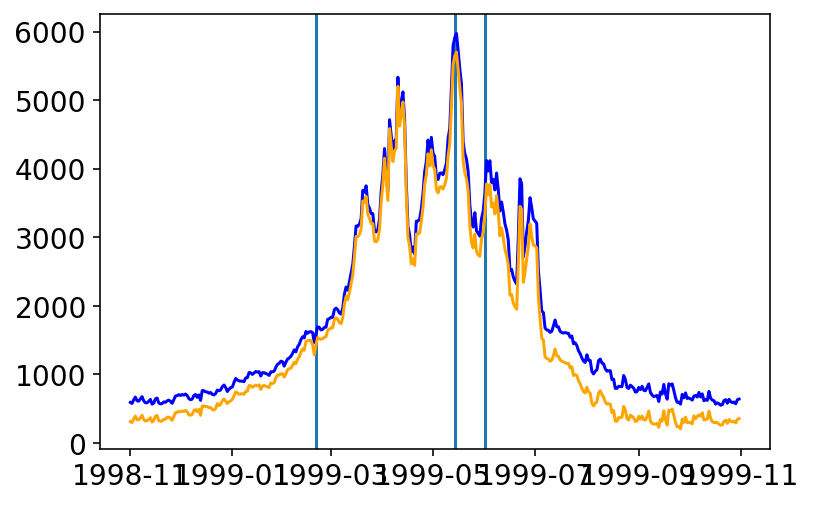

5382257.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
4722    1792.503921
4723    1465.943503
4724     988.674866
4725    1021.457271
4726    1423.778351
Name: Q_impact, Length: 4727, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


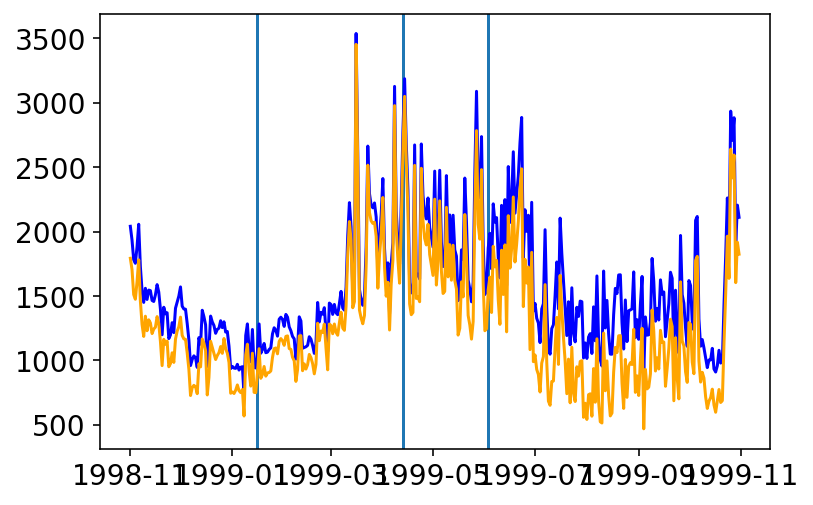

4063700.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1477.697060
11297    1209.828052
11298    1407.126332
11299    1357.781630
11300    1324.041700
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


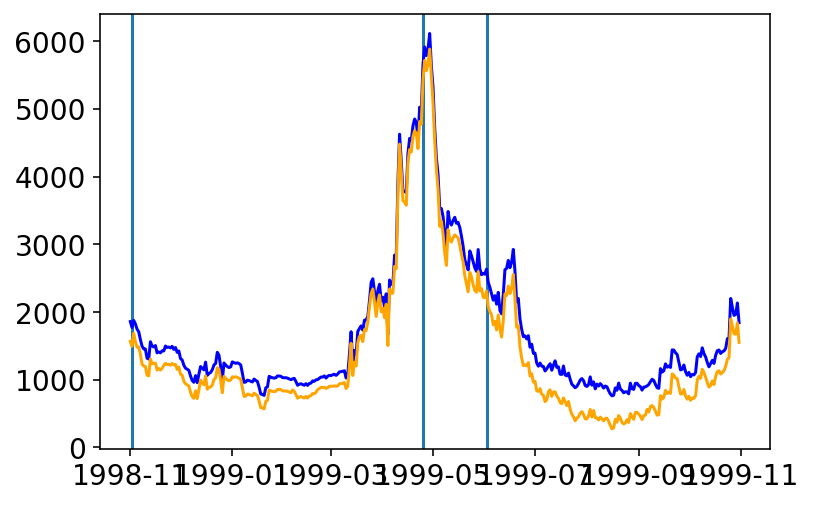

4086000.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1315.254044
11297    1296.496486
11298    1437.209719
11299    1487.455020
11300    1426.189654
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/core/_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/Dana/miniconda3/lib/python3.8/site-packages/scipy/stats/stats.py:114

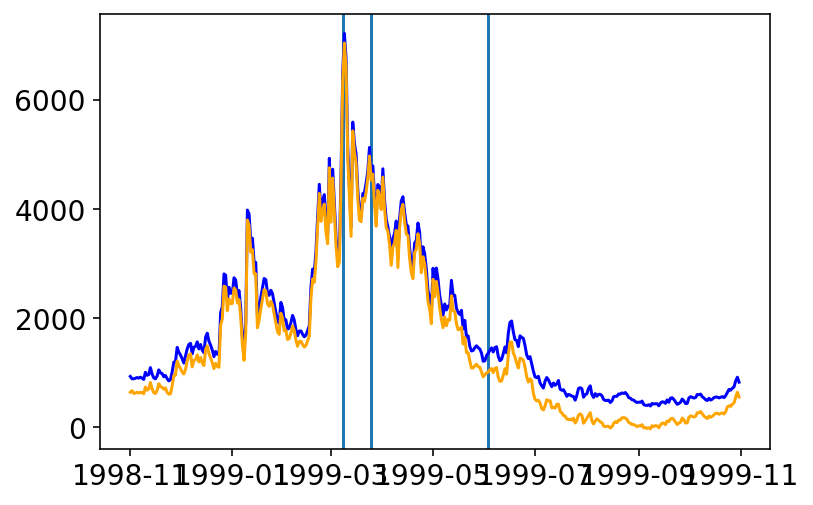

4087120.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
11296    460.376231
11297    419.436621
11298    407.619467
11299    402.697385
11300    383.094490
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


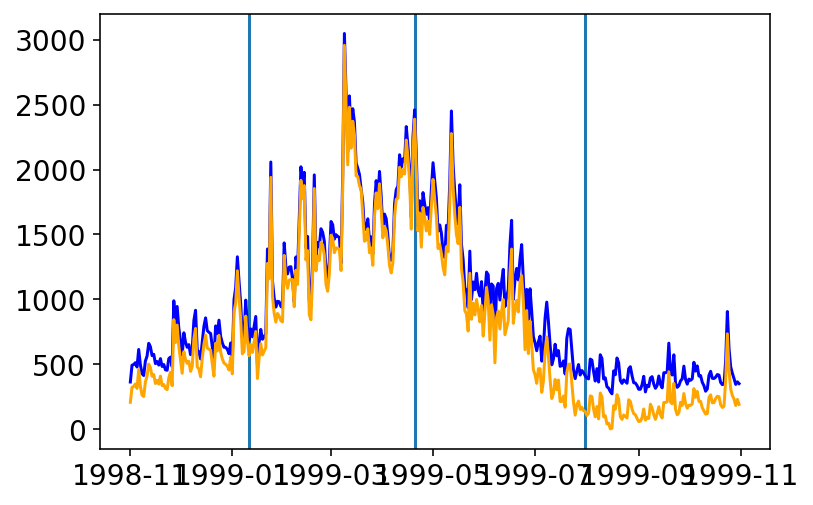

4069416.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
8374    2108.712748
8375    2024.531526
8376    1816.555906
8377    1738.540899
8378    1658.604703
Name: Q_impact, Length: 8379, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


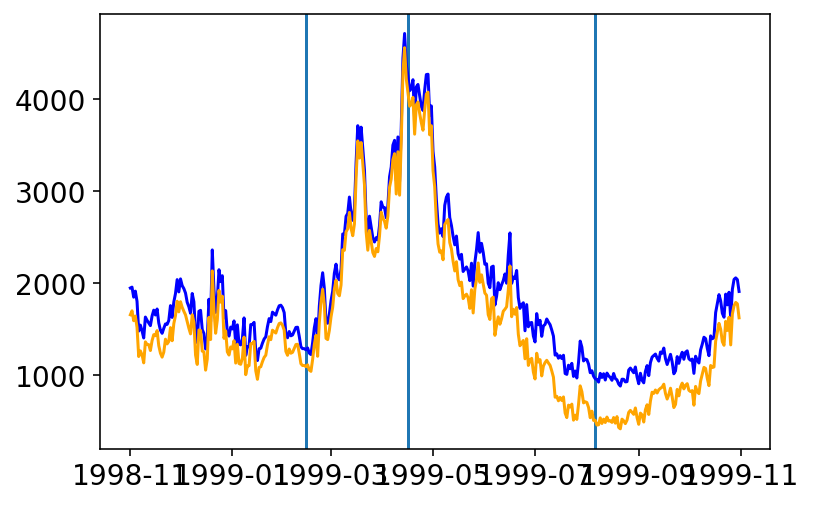

5545750.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
10200    1728.240902
10201    1684.278434
10202    1675.700212
10203    1657.758784
10204    1539.876393
Name: Q_impact, Length: 10205, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


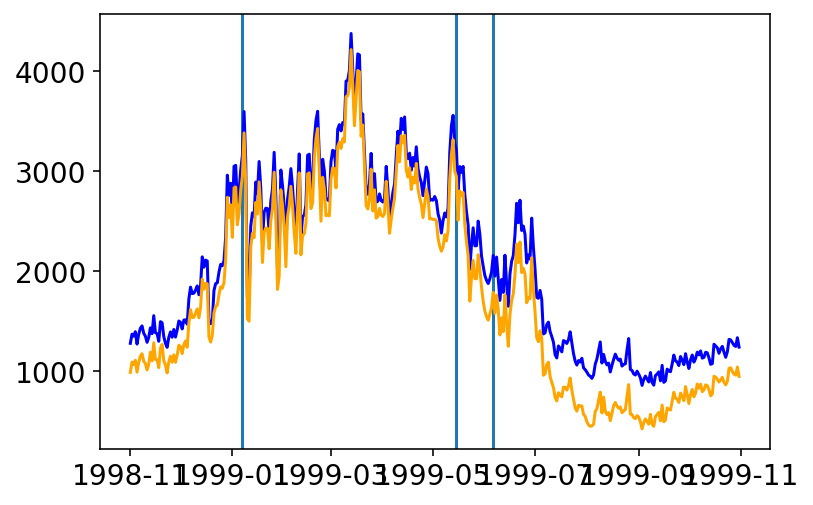

4087240.csv
0         132.436204
1         148.008827
2         160.549612
3         672.379020
4        1136.801504
            ...     
11296     622.737138
11297     614.950370
11298     556.001319
11299     461.462708
11300     423.215262
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


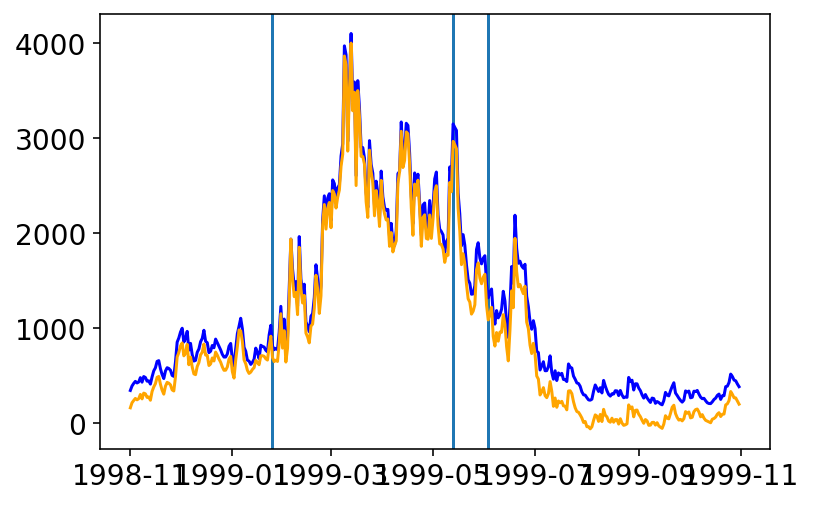

5406469.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
8009    3265.620820
8010    3336.272102
8011    3354.246977
8012    3390.468417
8013    3513.028671
Name: Q_impact, Length: 8014, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


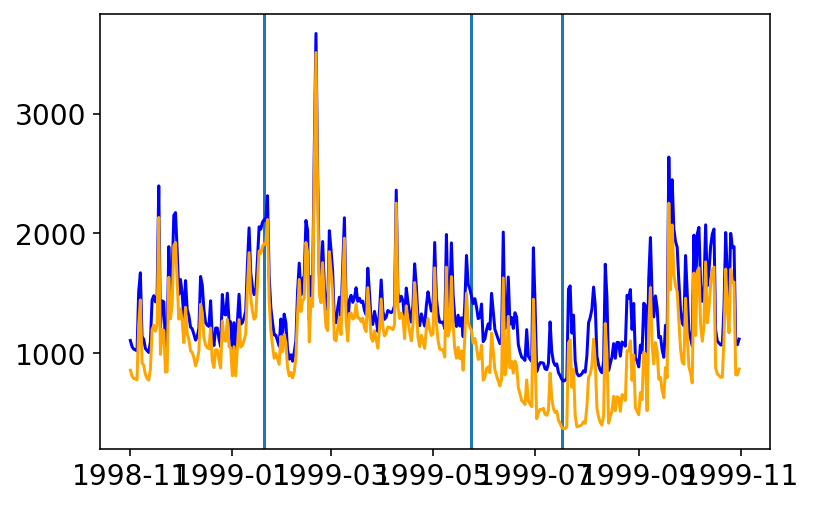

5405000.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1574.574439
11297    1573.063466
11298    1559.904126
11299    1557.173314
11300    1564.926196
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


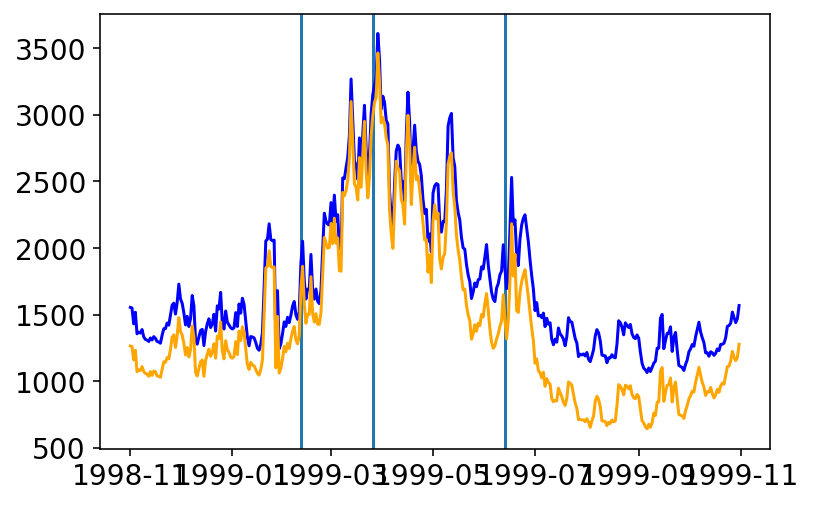

5333500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1768.973242
11297    1624.755612
11298    1614.603516
11299    1633.985574
11300    1604.672725
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


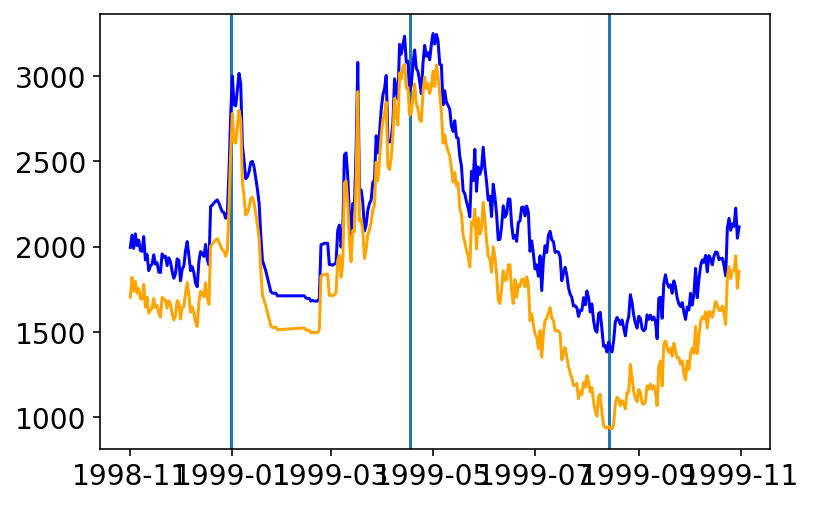

4079000.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2204.294072
11297    2090.266742
11298    1990.129080
11299    1925.266920
11300    1892.259364
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


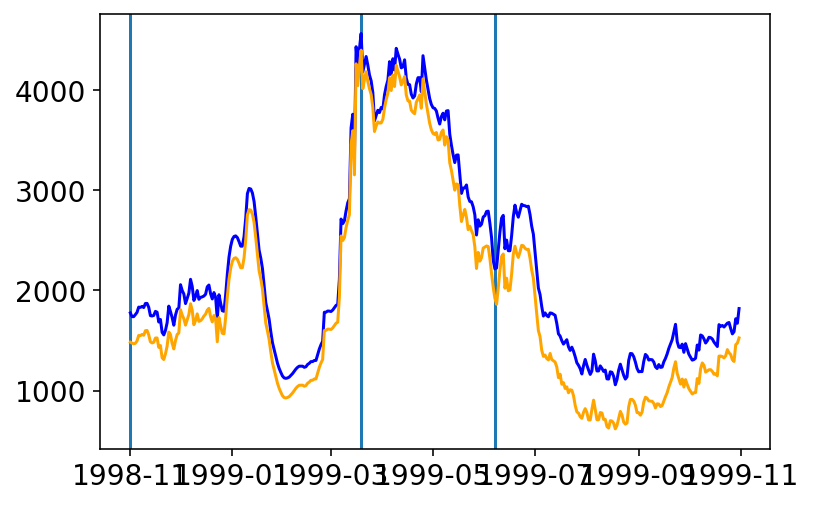

5362000.csv
0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
11296   NaN
11297   NaN
11298   NaN
11299   NaN
11300   NaN
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


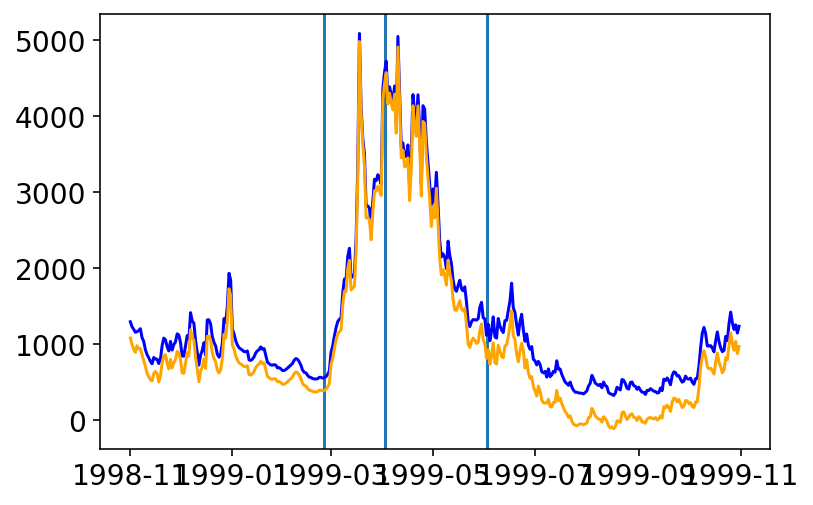

5433000.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2028.222205
11297    2009.809254
11298    2017.637556
11299    2018.478046
11300    2026.525678
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


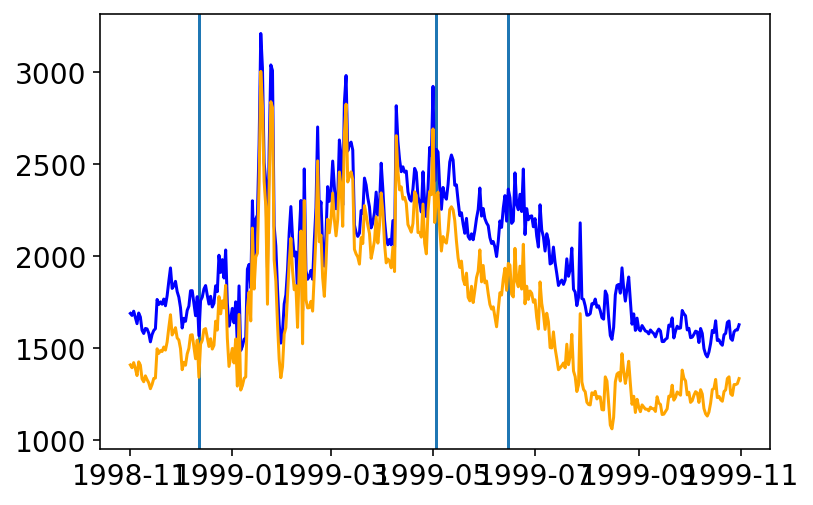

5429500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    4302.984054
11297    3970.616201
11298    4261.182579
11299    4303.536176
11300    4593.692072
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


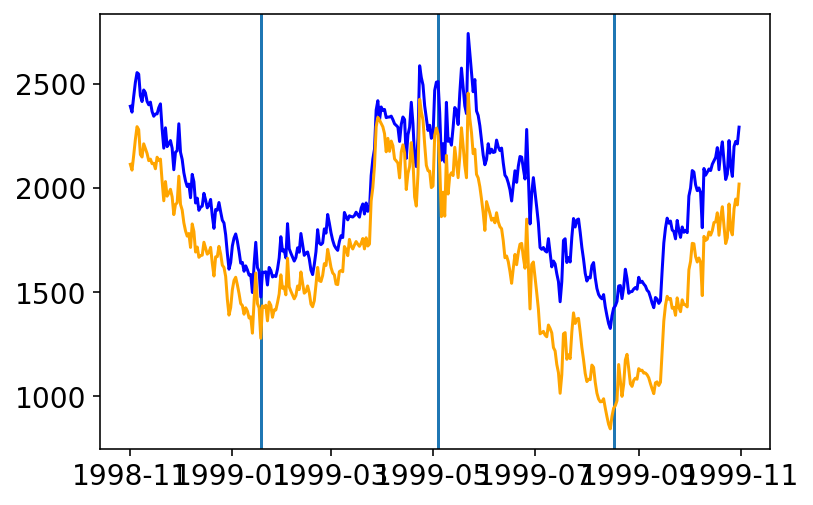

5425500.csv
0         301.089063
1         284.063888
2         266.630574
3                NaN
4                NaN
            ...     
11296    3019.743923
11297    3035.040160
11298    3019.802503
11299    3009.218420
11300    2995.071328
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


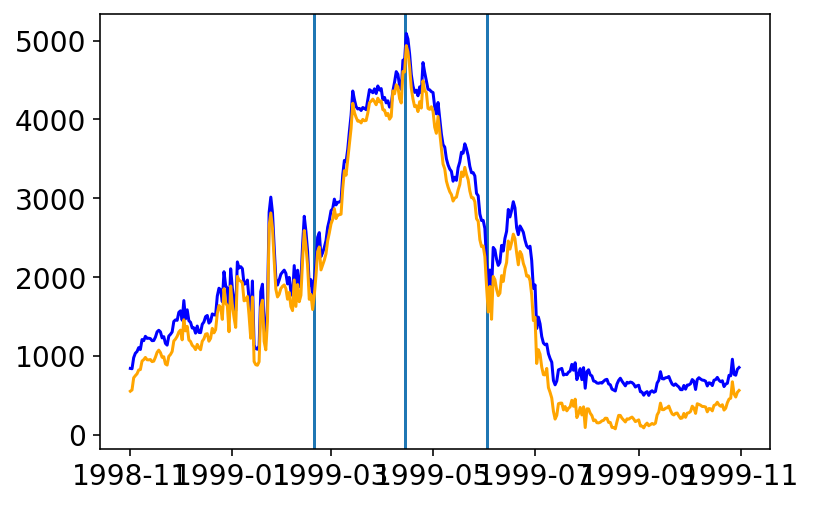

5370000.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1192.739823
11297    1168.646751
11298    1168.963423
11299    1170.040419
11300    1171.106717
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]


no baseflow duration stat


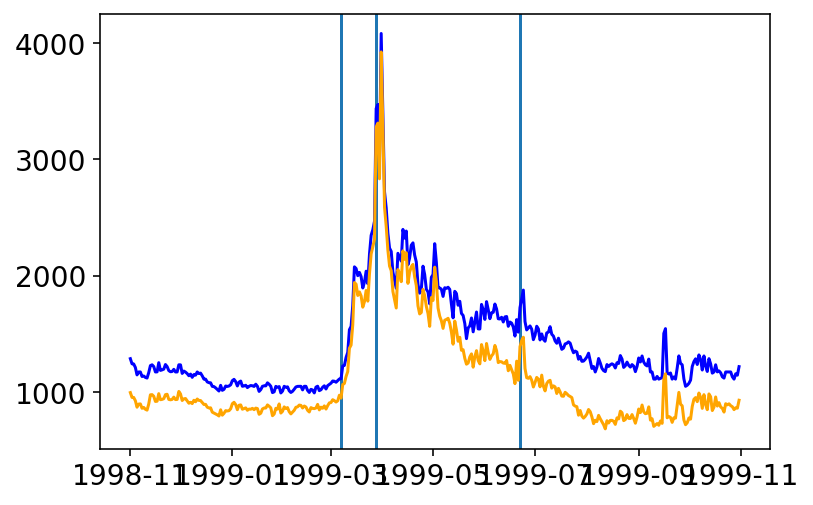

5341752.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
8374    1306.807893
8375    1326.309103
8376    1285.196113
8377    1319.484148
8378    1258.560856
Name: Q_impact, Length: 8379, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipytho

<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:435: RuntimeWarning: invalid value encountered in double_scalars
  baseflow_lowduration_diff = (baseflow_lowduration_impact-baseflow_lowduration)/baseflow_lowduration
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: R

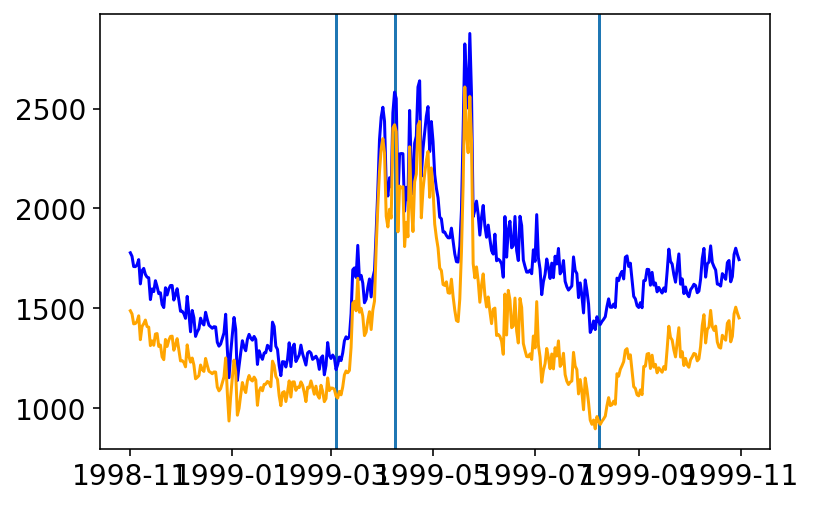

5427850.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
7278    2351.021801
7279    2182.252133
7280    2166.991101
7281    1765.918365
7282    2628.294098
Name: Q_impact, Length: 7283, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


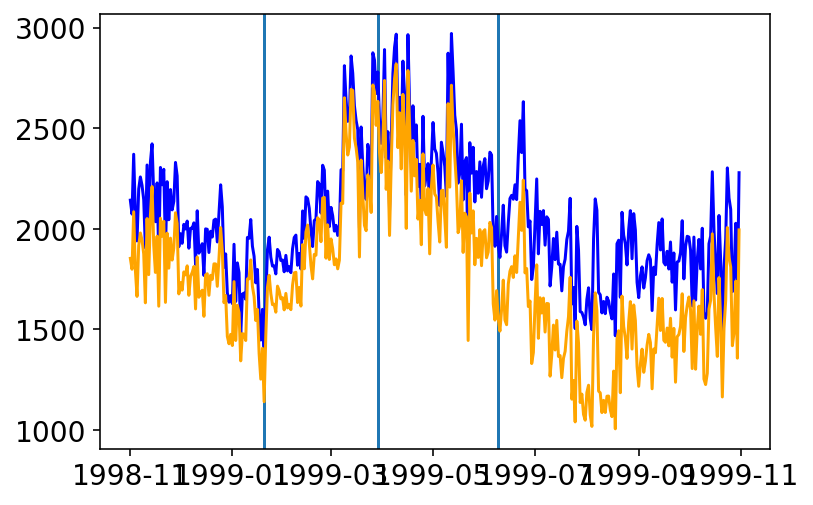

5403500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
10200    1416.036412
10201    1289.924271
10202    1241.340326
10203    1269.997558
10204    1273.672342
Name: Q_impact, Length: 10205, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-Na

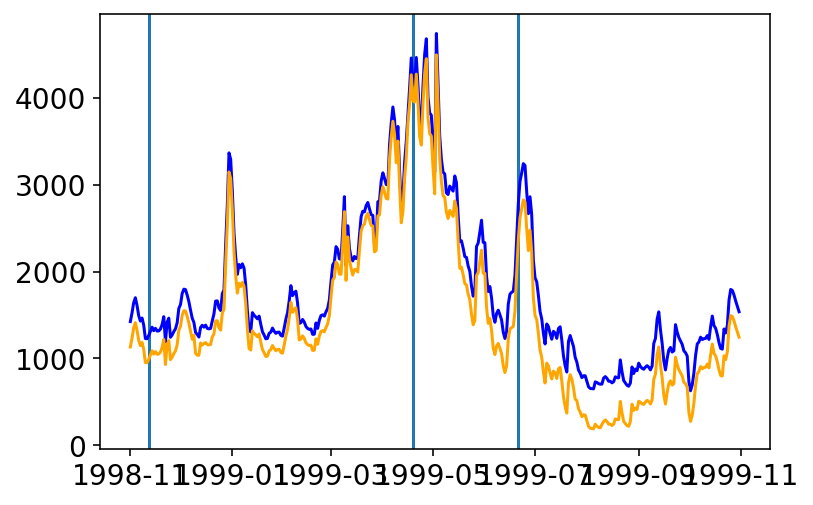

5407000.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1956.753934
11297    2044.163376
11298    1910.019589
11299    1916.207742
11300    1940.658947
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


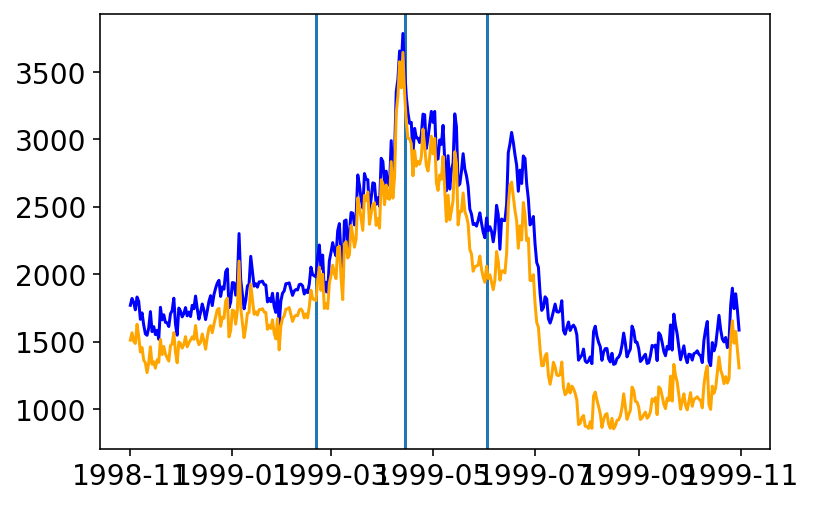

5382325.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
10566    2373.421562
10567    2384.961132
10568    2390.399209
10569    2402.496947
10570    2423.240042
Name: Q_impact, Length: 10571, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

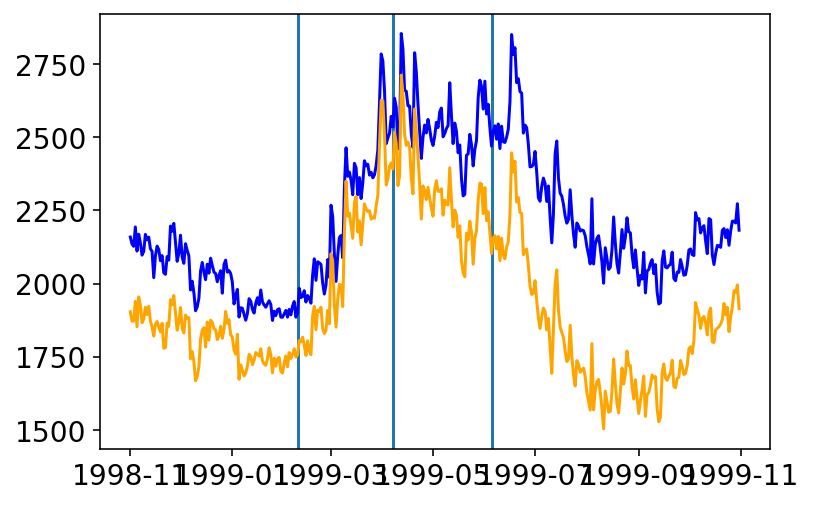

5340500.csv
0         551.753701
1         729.973464
2         791.218880
3         658.254374
4         822.348302
            ...     
11296    1482.820552
11297    1579.955985
11298    1645.195688
11299    1582.646670
11300    1577.493590
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


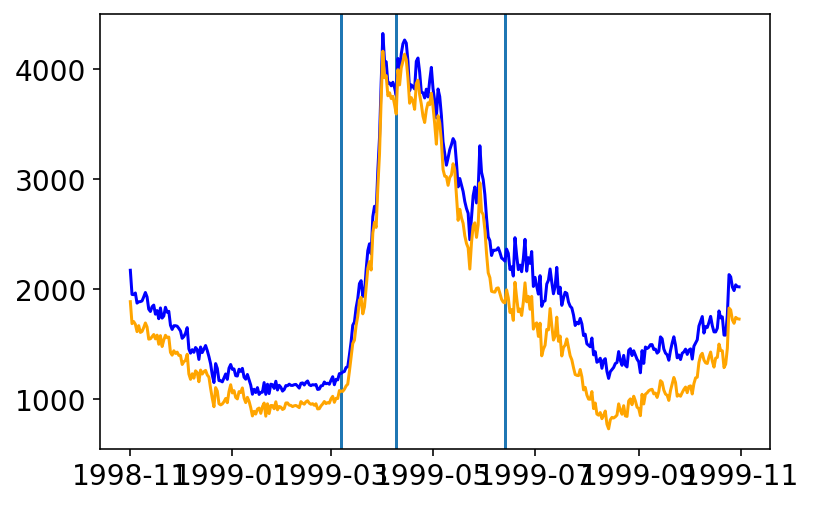

4073500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    3024.152377
11297    2943.709704
11298    2872.123003
11299    2798.612956
11300    2741.154253
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


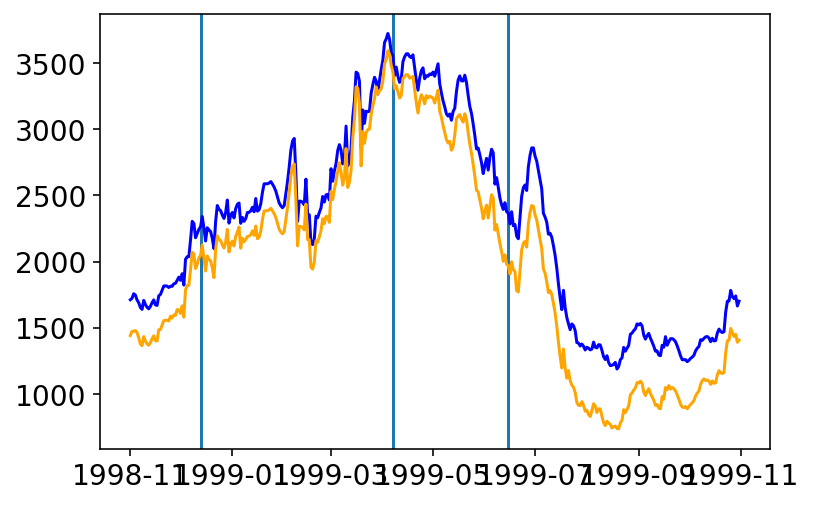

5431016.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
10200    990.938708
10201    976.704438
10202    958.293810
10203    900.442228
10204    927.441046
Name: Q_impact, Length: 10205, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

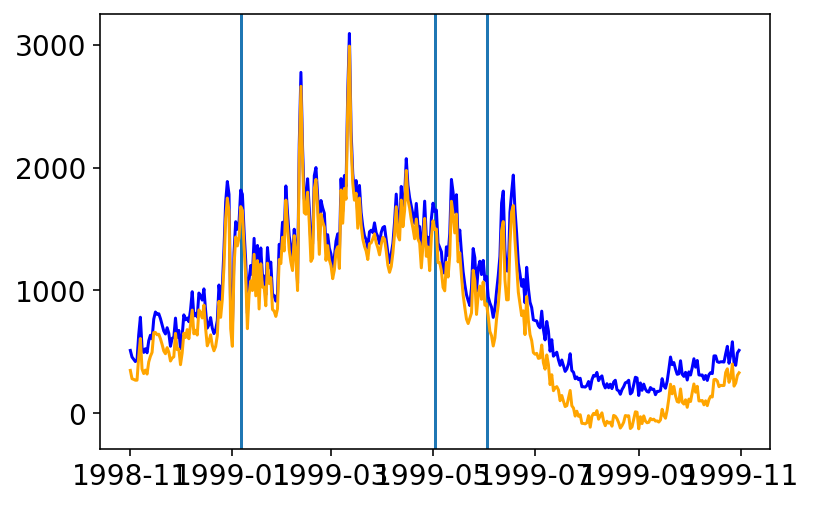

4073462.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
9105    1642.372861
9106    1682.858017
9107    1659.214817
9108    1626.292901
9109    1655.270120
Name: Q_impact, Length: 9110, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

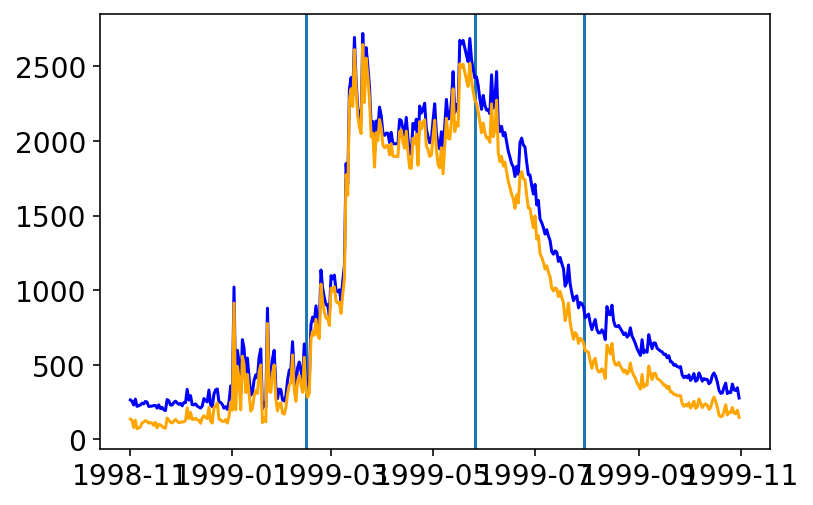

4087050.csv
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
5087    347.976705
5088    346.223409
5089    336.402408
5090    327.907665
5091    336.465343
Name: Q_impact, Length: 5092, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


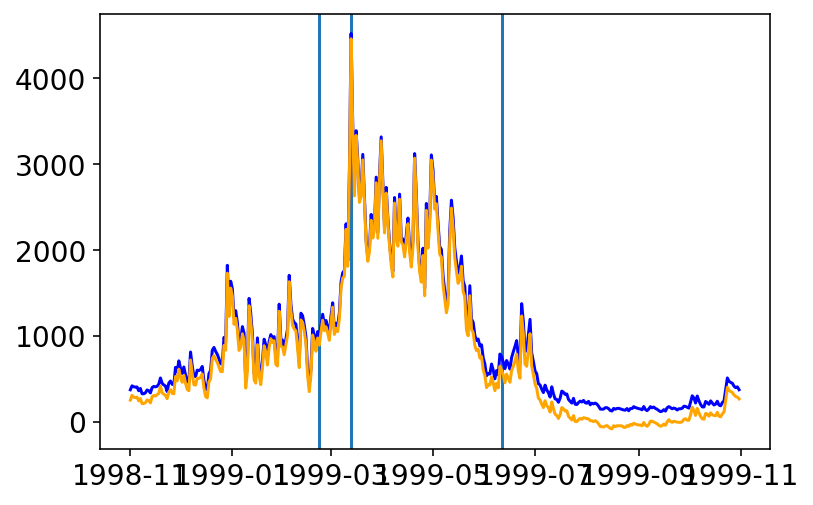

5357335.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
10931    2614.183138
10932    2483.530916
10933    2488.025091
10934    2448.225524
10935    2385.333424
Name: Q_impact, Length: 10936, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


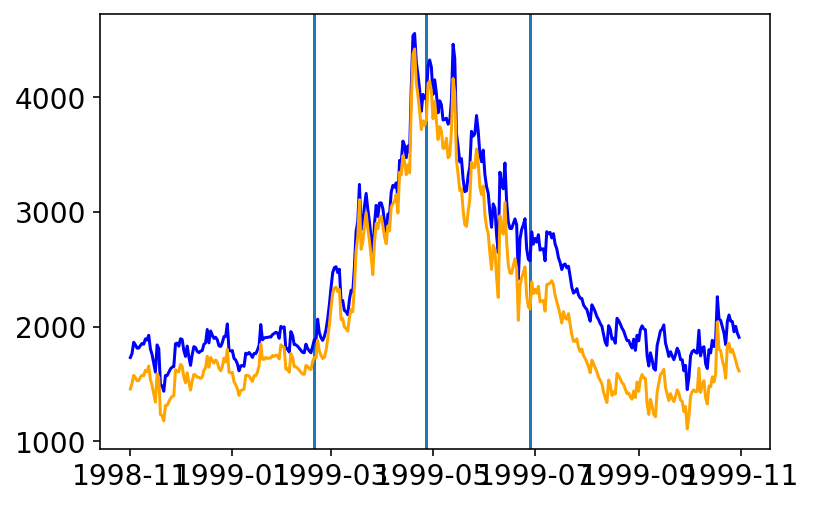

5397500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1667.043582
11297    1430.882802
11298    1163.034974
11299    1118.949232
11300    1077.583780
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


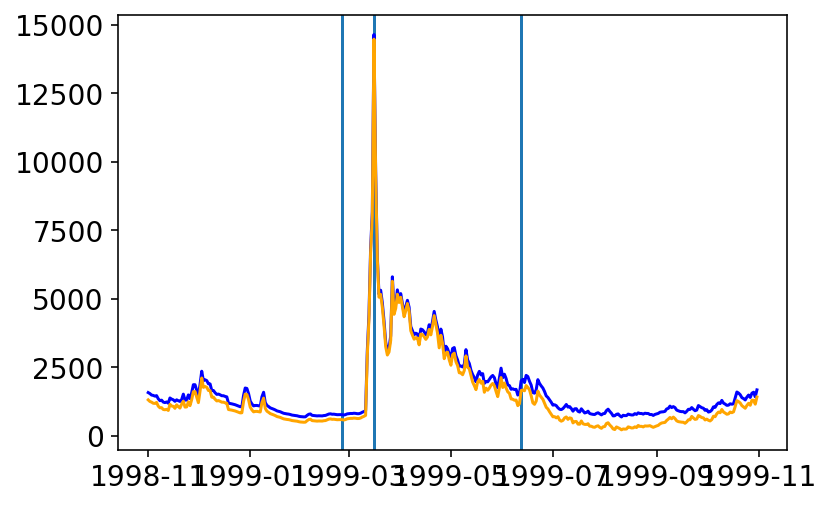

5400625.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
2895    1562.269334
2896    1548.654022
2897    1566.769361
2898    1572.729879
2899    1584.673550
Name: Q_impact, Length: 2900, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


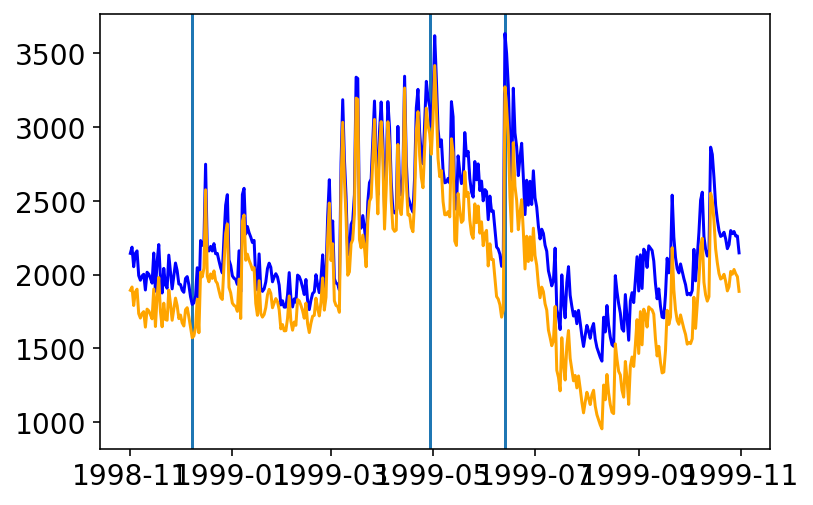

4087119.csv
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
6183    495.277192
6184    507.690133
6185    508.441107
6186    510.849952
6187    531.817768
Name: Q_impact, Length: 6188, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


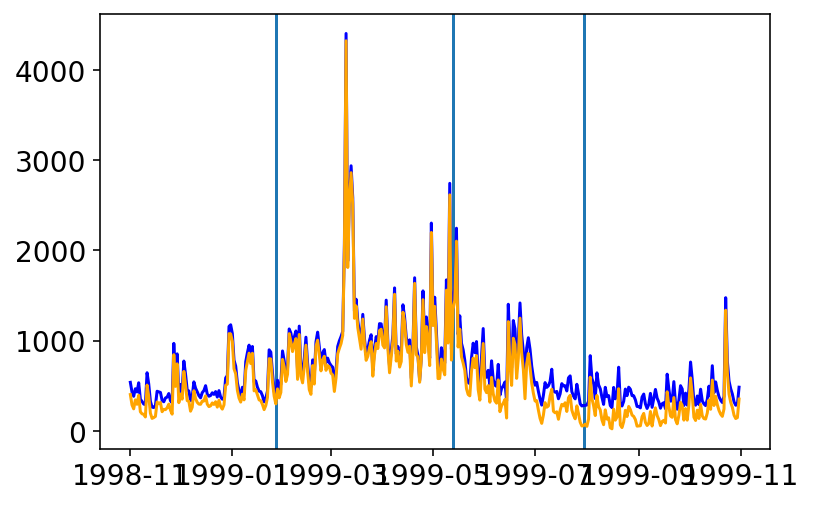

5381000.csv
0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
11296   NaN
11297   NaN
11298   NaN
11299   NaN
11300   NaN
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


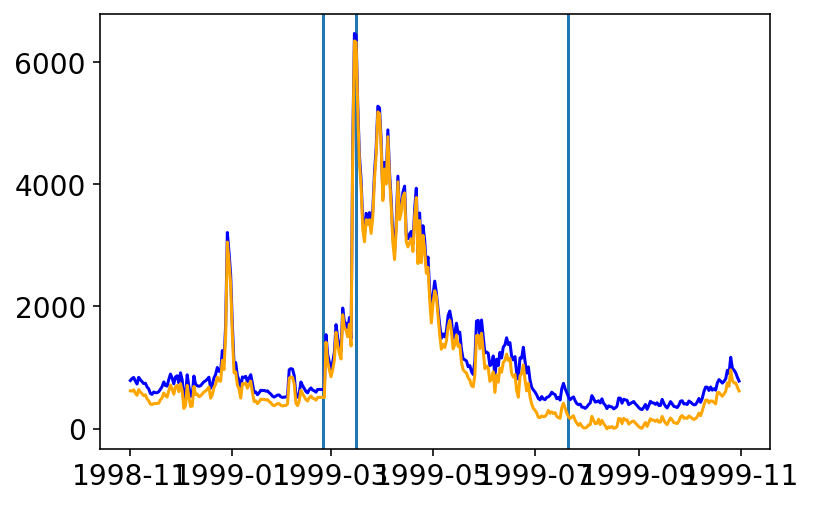

5382284.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
4356    1788.483880
4357    1790.588223
4358    1811.104684
4359    1838.167989
4360    1798.214340
Name: Q_impact, Length: 4361, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:435: RuntimeWarning: divide by zero encountered in double_scalars
  baseflow_lowduration_diff = (baseflow_lowduration_impact-baseflow_lowduration)/baseflow_lowduration


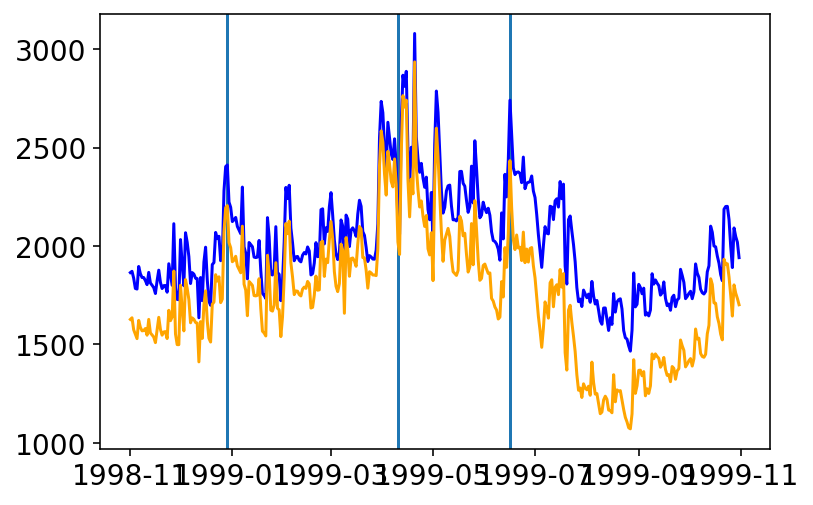

5408480.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
2826    2414.957173
2827    2333.596509
2828    2295.362006
2829    2241.516469
2830    2228.955034
Name: Q_impact, Length: 2831, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


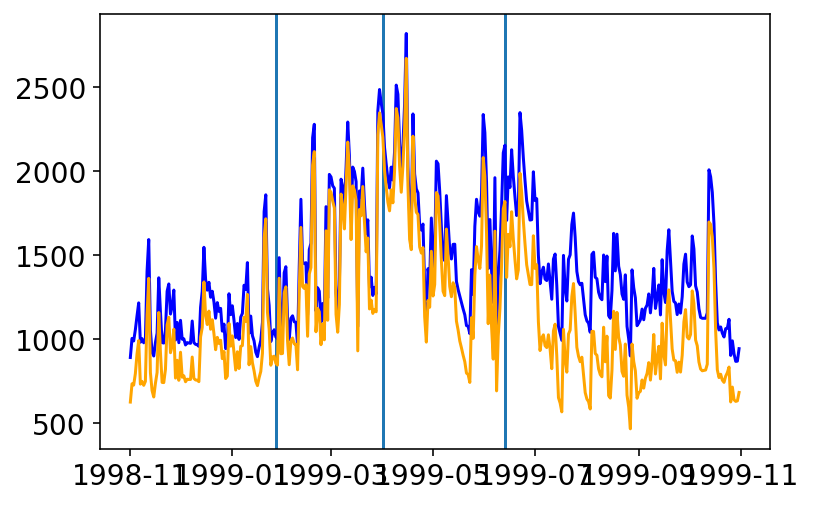

5390680.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
4713    2140.519234
4714    2082.632568
4715    2072.276181
4716    2039.955963
4717    1994.203144
Name: Q_impact, Length: 4718, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipytho

<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


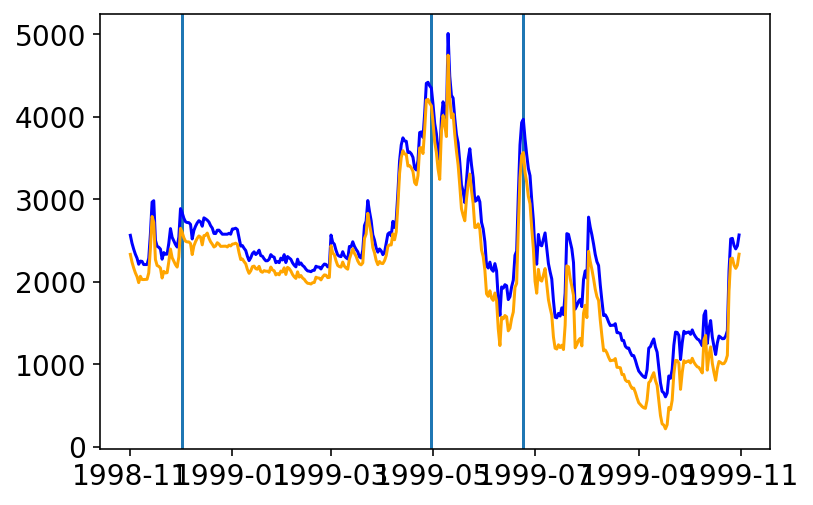

4087220.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
11296    406.446176
11297    374.683741
11298    360.996182
11299    353.823647
11300    350.278402
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


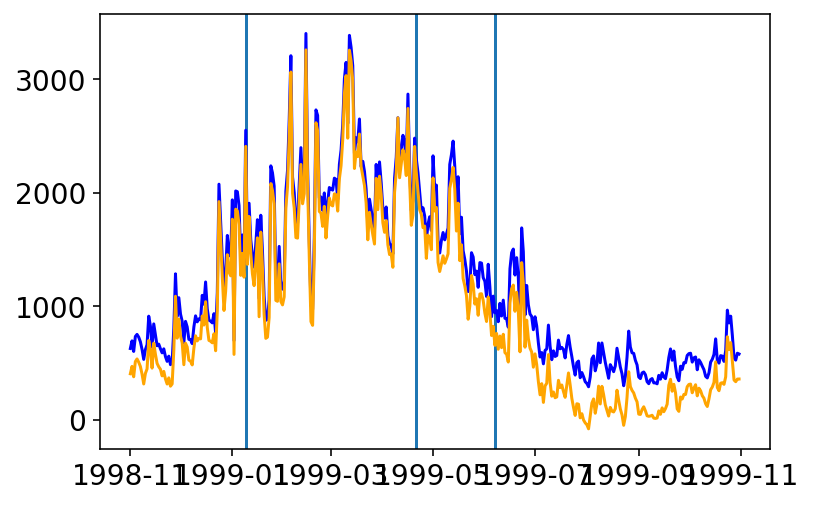

40851385.csv
0        1255.245030
1        1121.416991
2        1256.333411
3        1305.030126
4        1297.264126
            ...     
11296    3715.486530
11297    3771.158106
11298    3790.873586
11299    3136.870617
11300    2837.757213
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


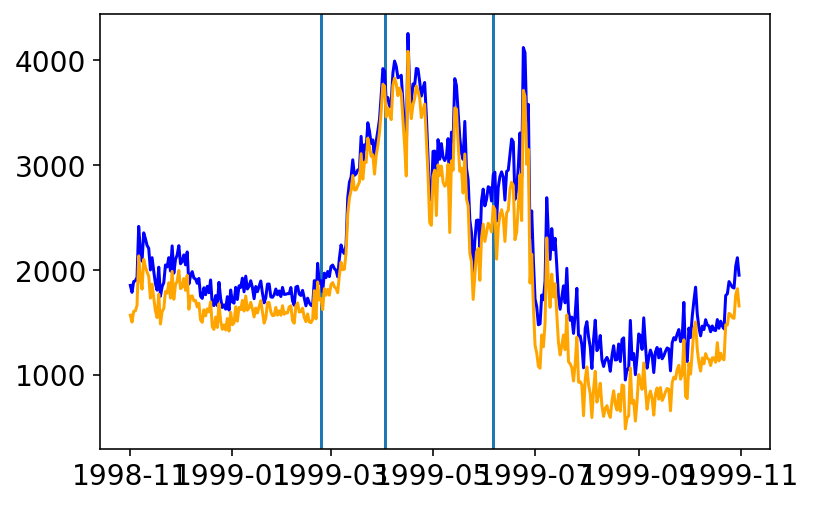

5430150.csv
0        1291.842738
1        1359.352857
2        1424.422852
3        1557.002966
4        1443.537163
            ...     
11296    1826.653929
11297    1812.969713
11298    1855.194004
11299    1842.260617
11300    1881.221902
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]


no baseflow duration stat


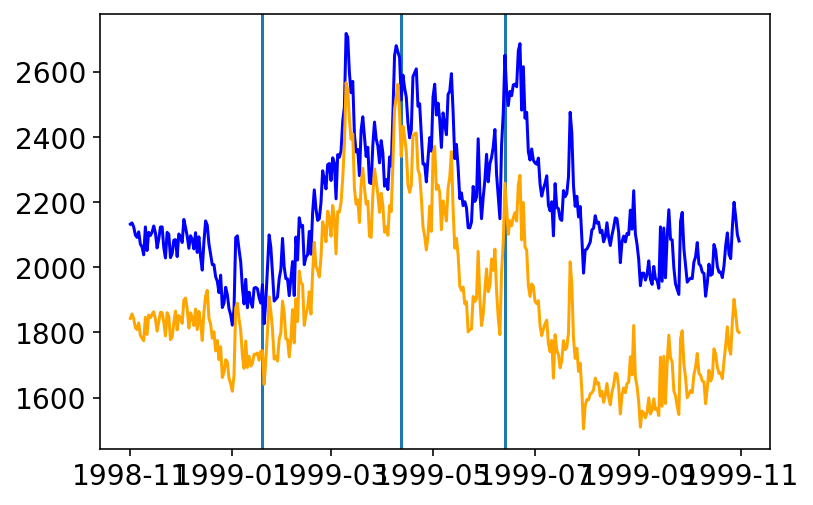

5360500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1820.595687
11297    1630.073965
11298    1414.746158
11299    1909.953388
11300    1691.327135
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


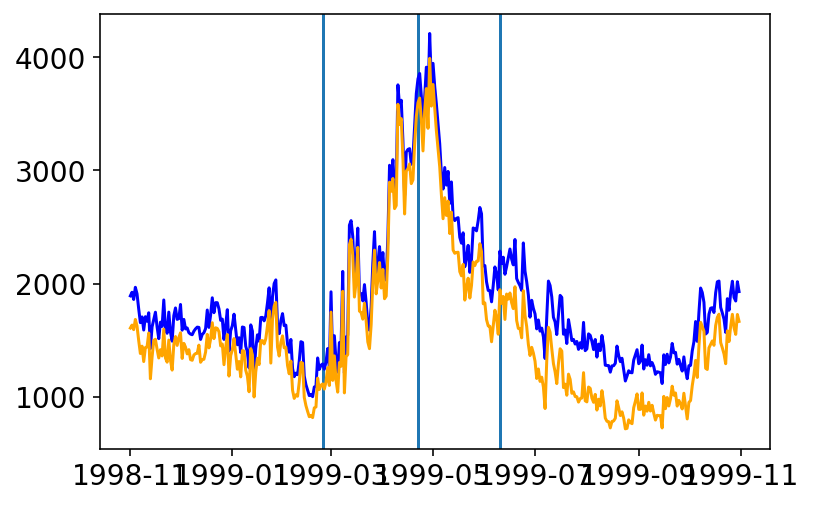

5368000.csv
0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
11296   NaN
11297   NaN
11298   NaN
11299   NaN
11300   NaN
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


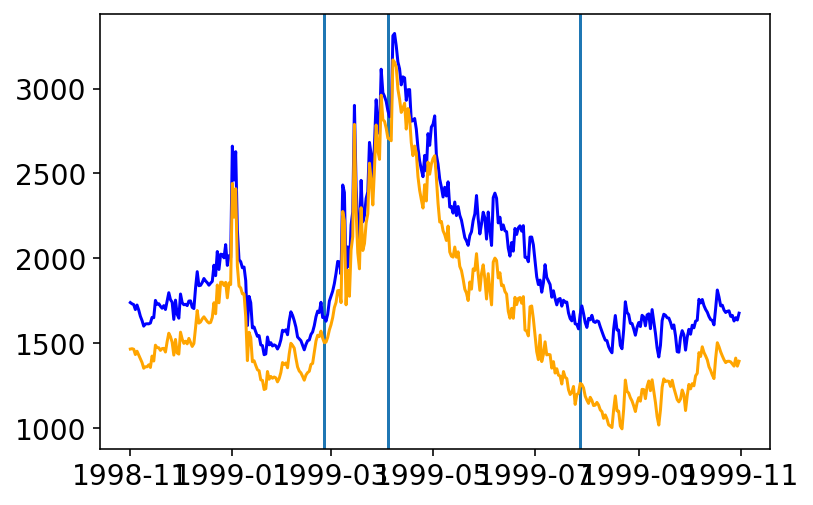

4087142.csv
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
4722   -310.955435
4723   -201.305407
4724   -197.018948
4725   -141.808965
4726    -96.623291
Name: Q_impact, Length: 4727, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


no baseflow duration stat


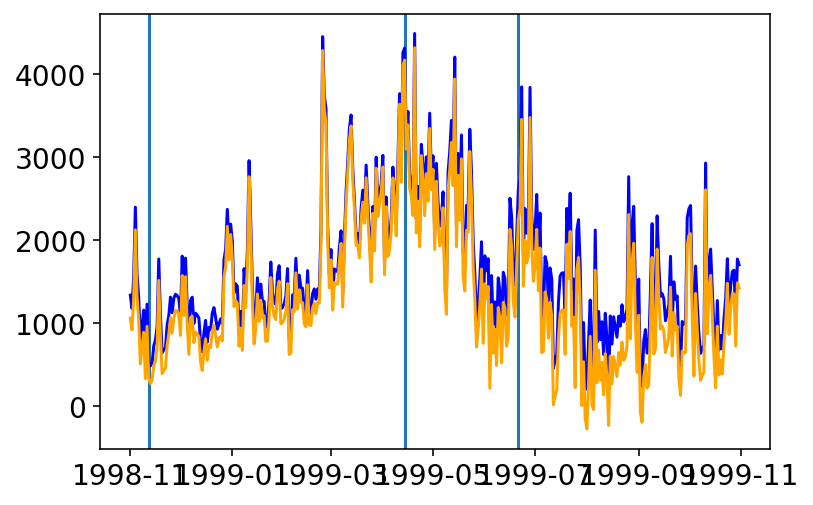

5427570.csv
0        145.929306
1        151.828871
2        161.112194
3        179.376943
4        187.679101
           ...     
7939     530.122051
7940     485.287905
7941     418.143484
7942    1080.424393
7943    1375.302585
Name: Q_impact, Length: 7944, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


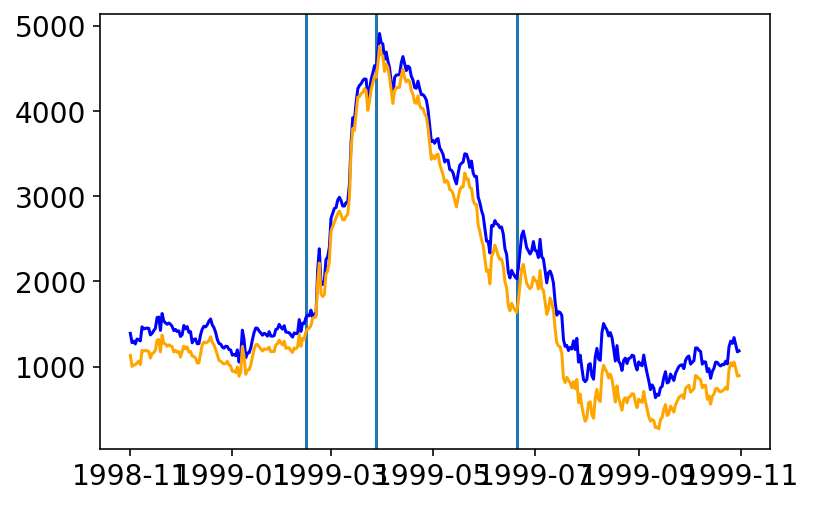

5423500.csv
0         148.746861
1         174.168287
2         179.315601
3         203.266367
4         188.454709
            ...     
11296    2419.915640
11297    2344.705879
11298    2342.125694
11299    2302.033234
11300    2299.274792
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


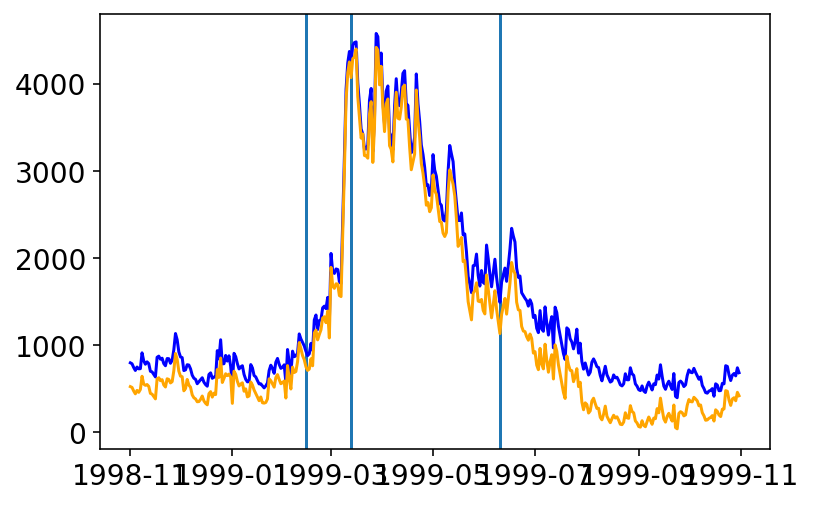

40263491.csv
0       1752.102042
1       1760.923625
2       1759.927407
3       1740.522812
4       1740.869323
           ...     
9400    1348.917455
9401    1347.389760
9402    1341.249111
9403    1356.960576
9404    1352.282685
Name: Q_impact, Length: 9405, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


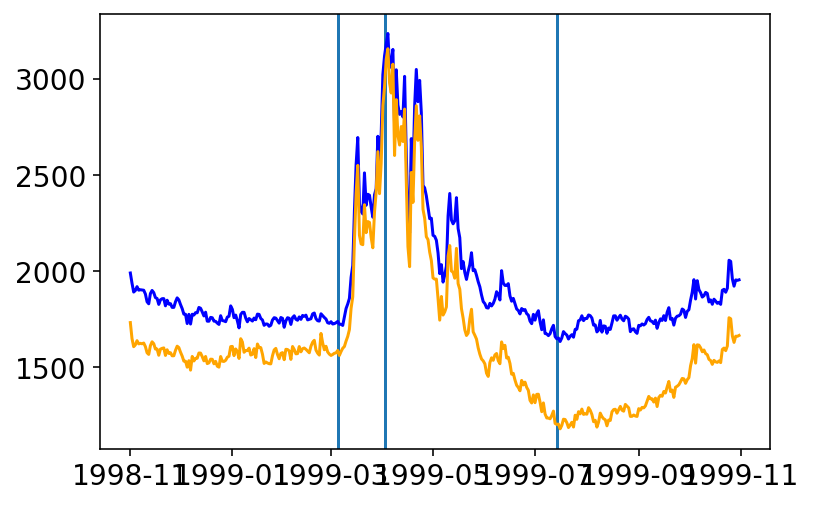

4069500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2236.817379
11297    2148.626021
11298    1857.544280
11299    1792.945828
11300    1704.346235
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


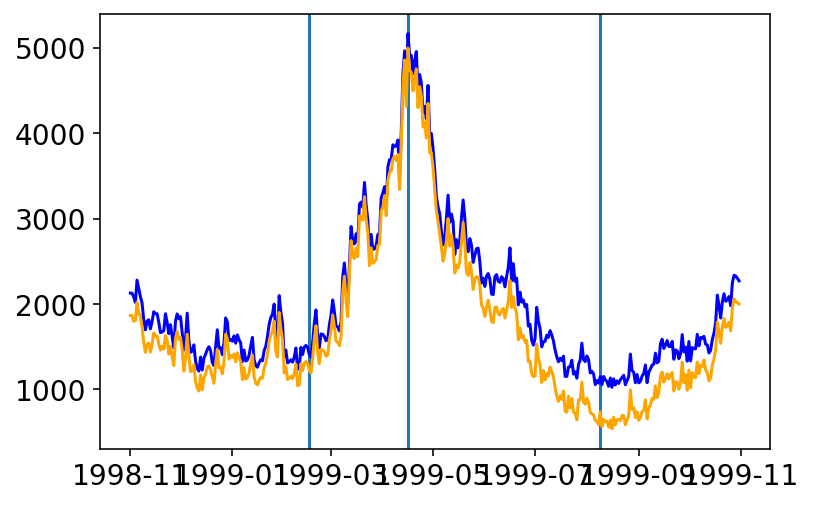

5356500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296            NaN
11297            NaN
11298    1256.129121
11299    1234.430113
11300    1249.199519
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


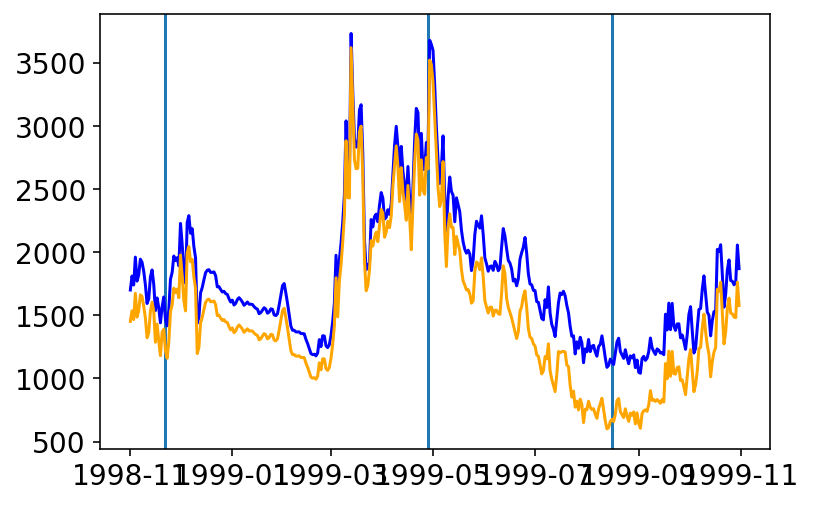

5403000.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
3991    1043.711198
3992     966.424632
3993     921.624043
3994     880.786315
3995     854.888971
Name: Q_impact, Length: 3996, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:435: RuntimeWarning: invalid value encountered in double_scalars
  baseflow_lowduration_diff = (baseflow_lowduration_impact-baseflow_lowduration)/baseflow_lowduration


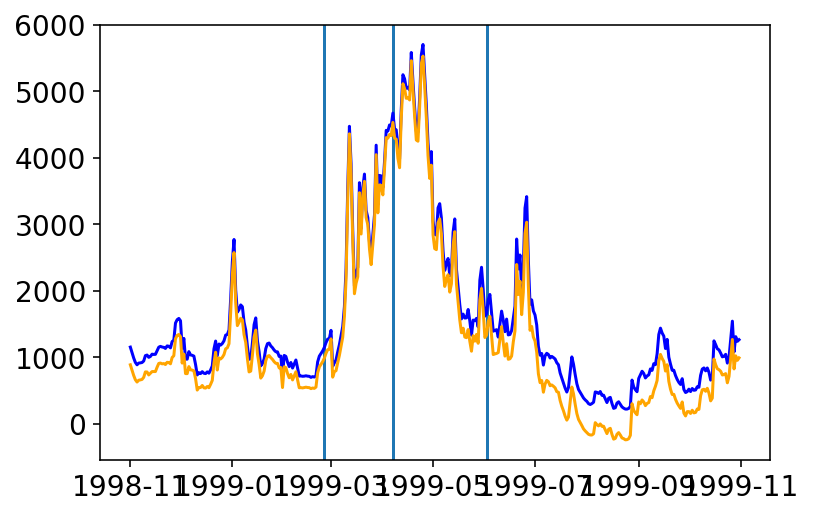

4080000.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
4531    6009.078472
4532            NaN
4533            NaN
4534            NaN
4535            NaN
Name: Q_impact, Length: 4536, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


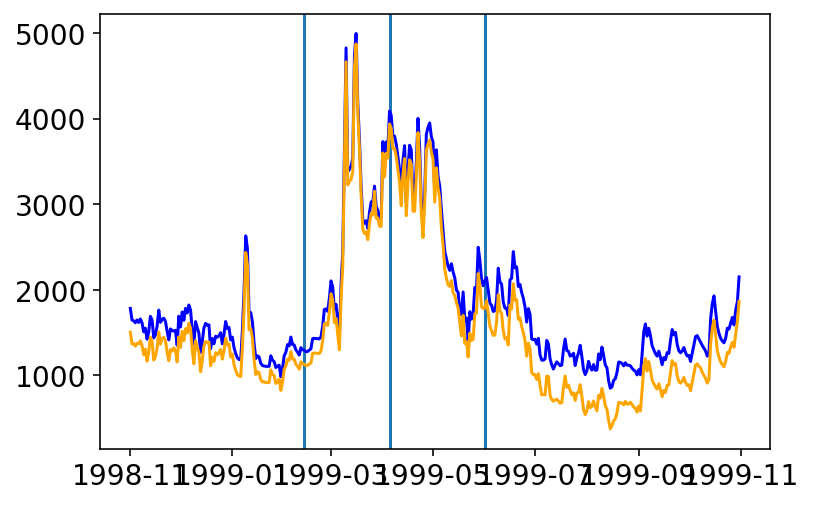

5393500.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
11296    367.167783
11297    307.426007
11298    331.421296
11299    322.713648
11300    320.957640
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


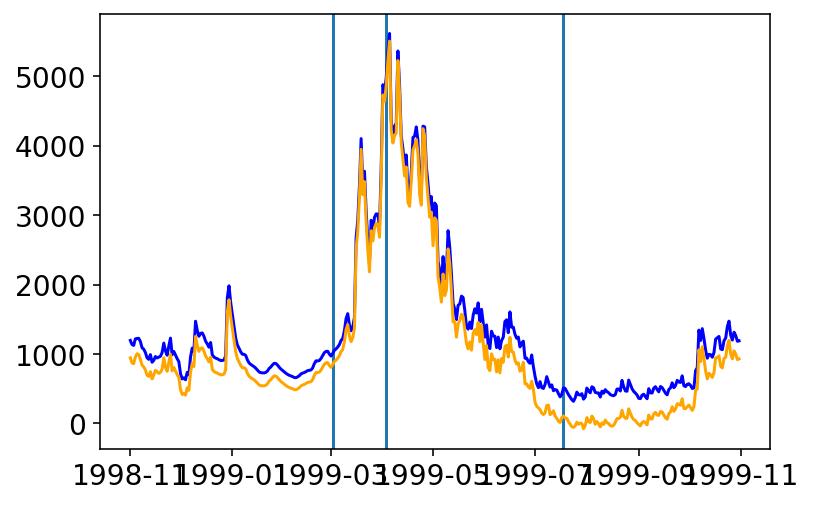

5357230.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
5087    2219.192968
5088    2454.811981
5089    2206.946016
5090    2196.547032
5091    2198.300994
Name: Q_impact, Length: 5092, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


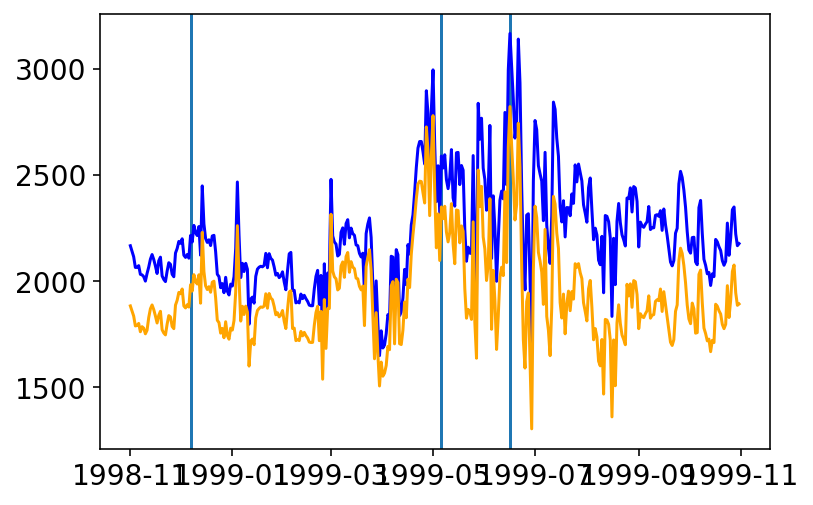

5544200.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2953.816714
11297    2228.674392
11298    1932.404621
11299    1915.152201
11300    1882.436507
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


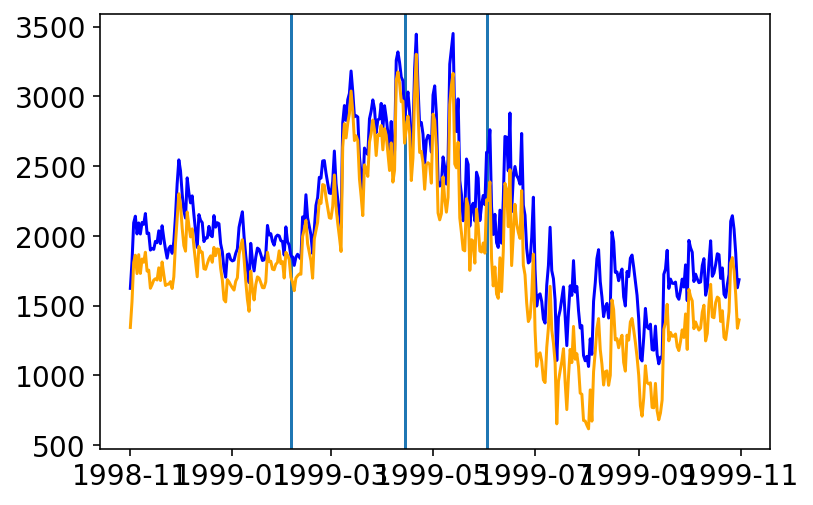

4065106.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
10566    2944.801473
10567    2962.991705
10568    2667.638609
10569    2483.425821
10570    2424.482383
Name: Q_impact, Length: 10571, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


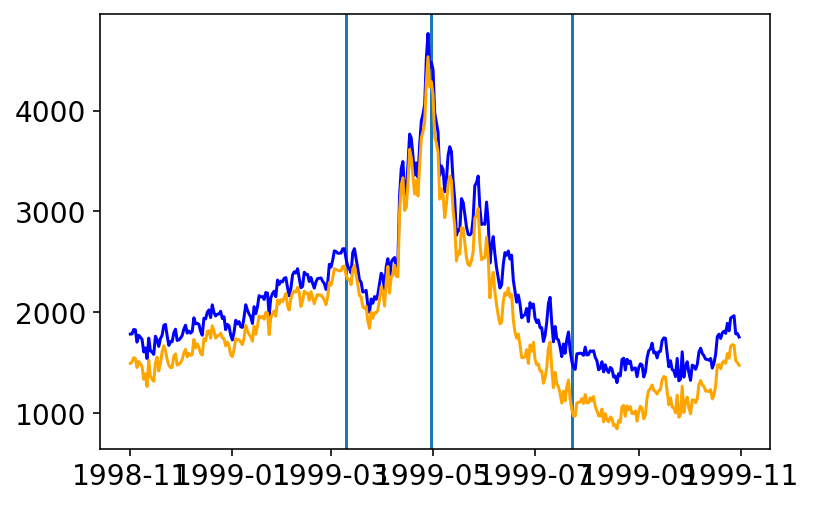

5410490.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2316.089792
11297    2293.721886
11298    2280.826366
11299    2281.010807
11300    2286.376248
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


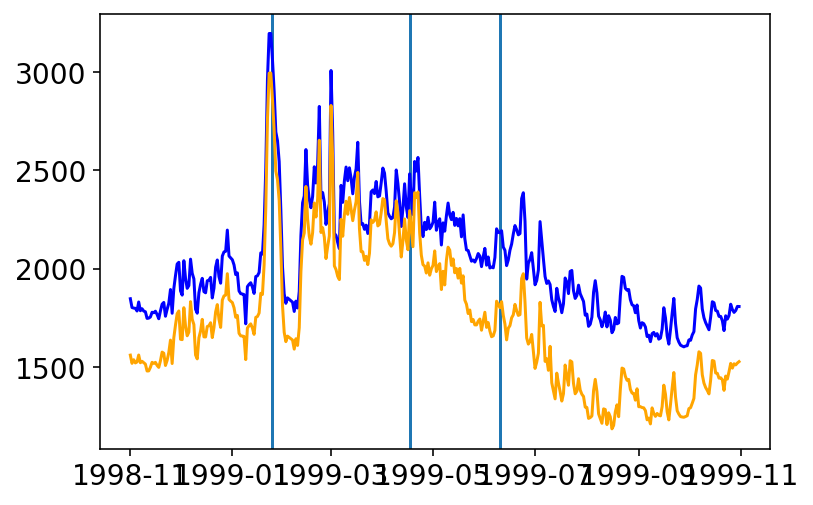

5438283.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
10566    2408.308225
10567    2373.415637
10568    2346.436175
10569    2328.216855
10570    2283.576906
Name: Q_impact, Length: 10571, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]


no baseflow duration stat


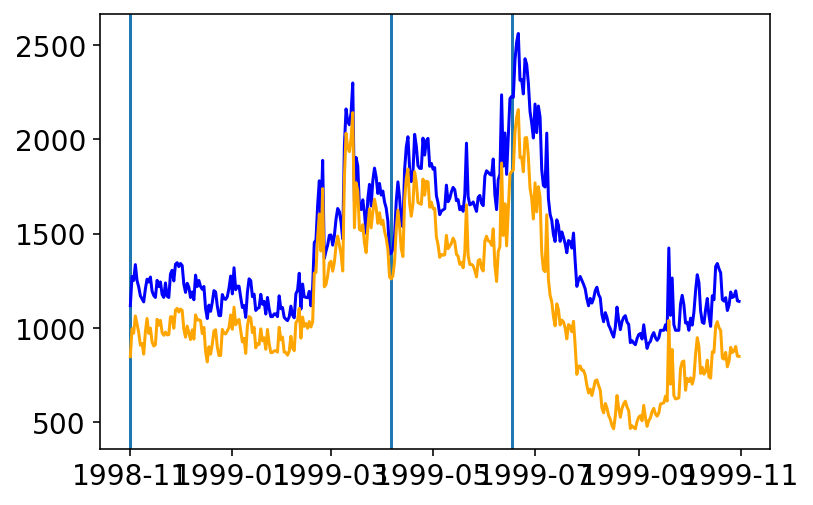

4080798.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
10200    1773.893182
10201    1758.103242
10202    1772.879332
10203    1784.708417
10204    1784.617903
Name: Q_impact, Length: 10205, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean o

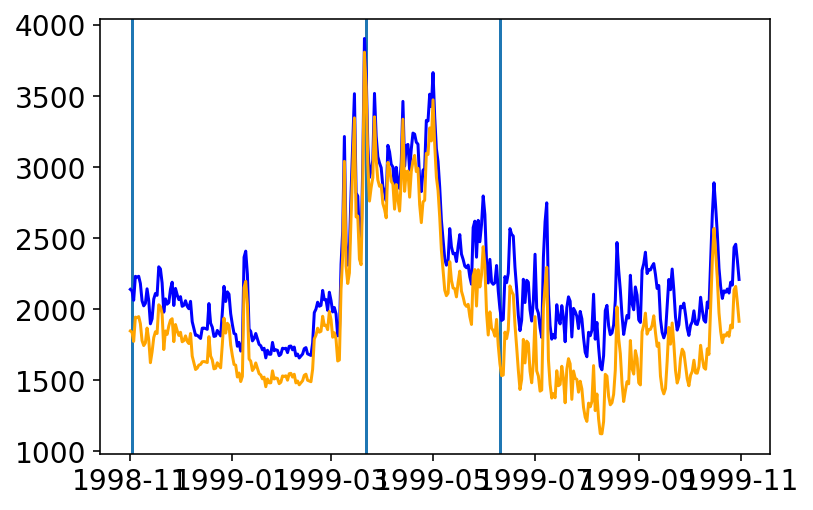

5435943.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
9105    1226.247727
9106    1185.396947
9107    1131.948395
9108    1211.771256
9109    1180.839403
Name: Q_impact, Length: 9110, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


no baseflow duration stat


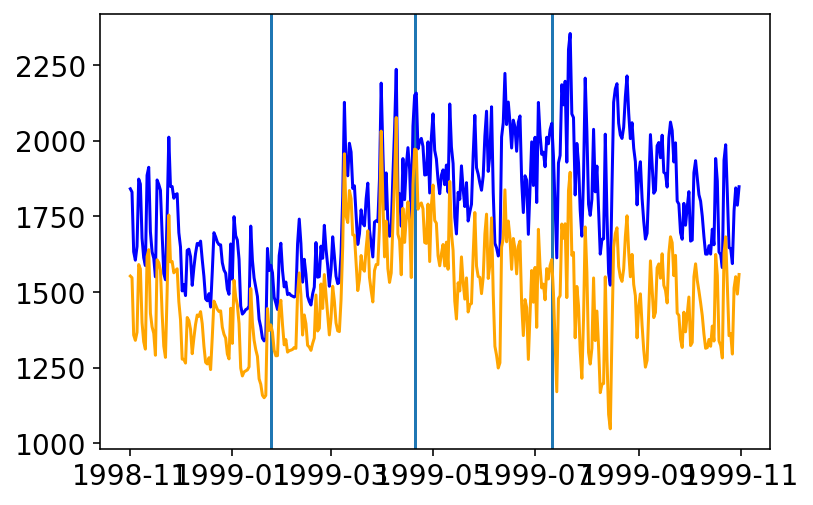

4082400.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
10931    2047.103097
10932    2072.767005
10933    1962.036960
10934    1943.648582
10935    1438.015268
Name: Q_impact, Length: 10936, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


no baseflow duration stat


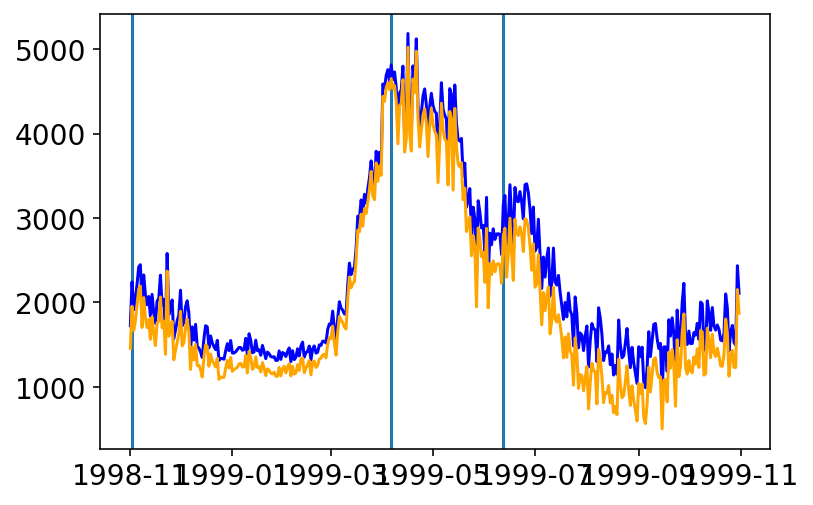

5426250.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1864.719662
11297    1736.611835
11298    1636.558671
11299    1530.791209
11300    1472.755600
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]


no baseflow duration stat


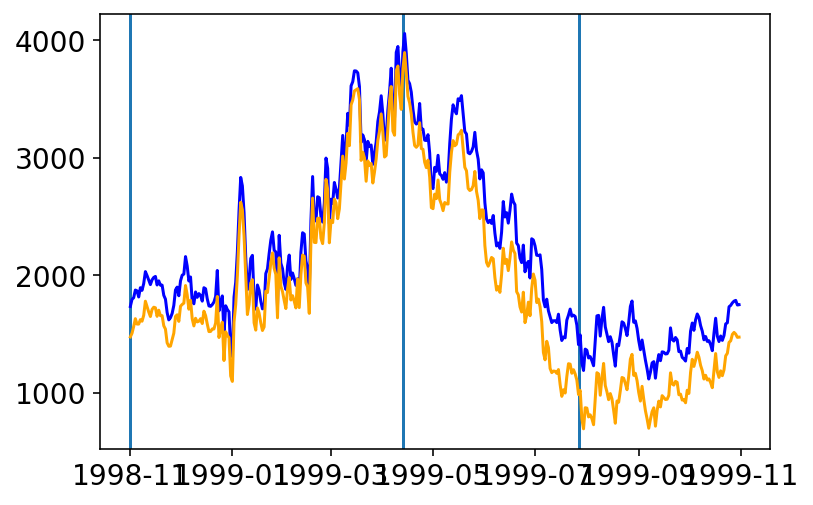

4087030.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
11296    786.109937
11297    733.167803
11298    712.849438
11299    682.481762
11300    685.810837
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


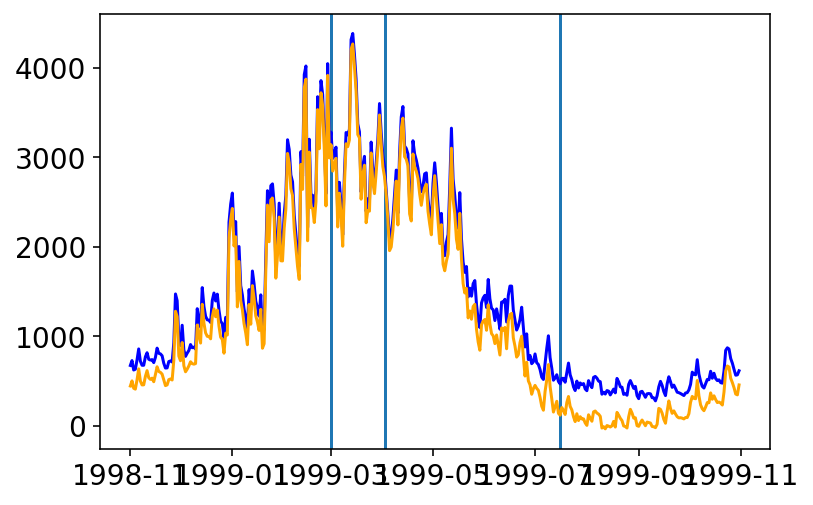

5400718.csv
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
1428    253.137898
1429    222.002433
1430    206.464666
1431    188.958154
1432    190.091775
Name: Q_impact, Length: 1433, dtype: float64

/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1368: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(
/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1368: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


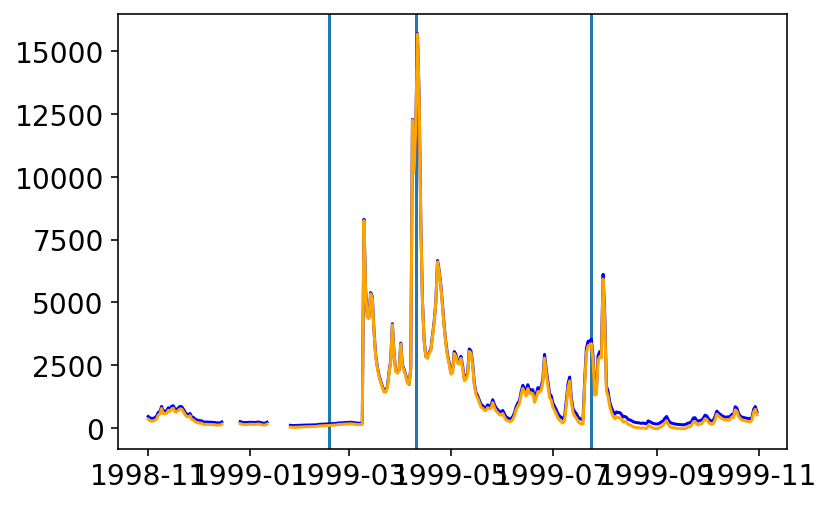

4071765.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2115.781347
11297    2133.220460
11298    2141.297781
11299    1995.029261
11300    2019.636072
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipytho

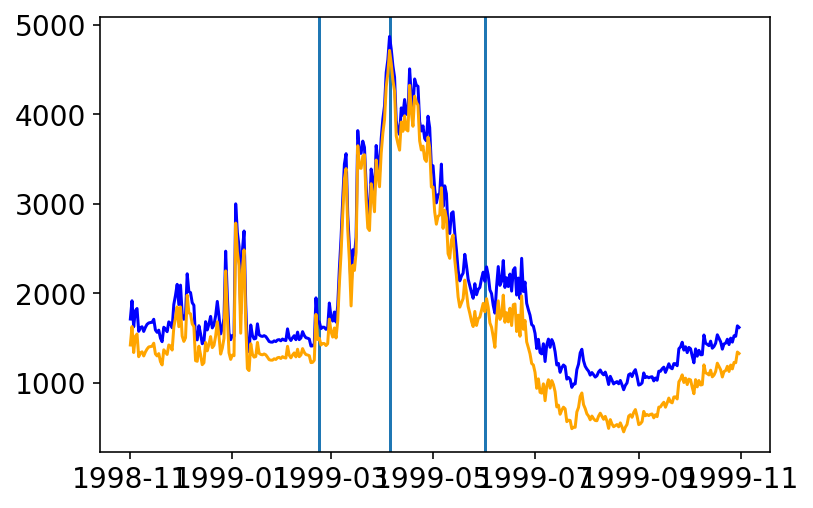

5395000.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2574.837833
11297    2336.747245
11298    2229.961679
11299    2261.205874
11300    2512.504020
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


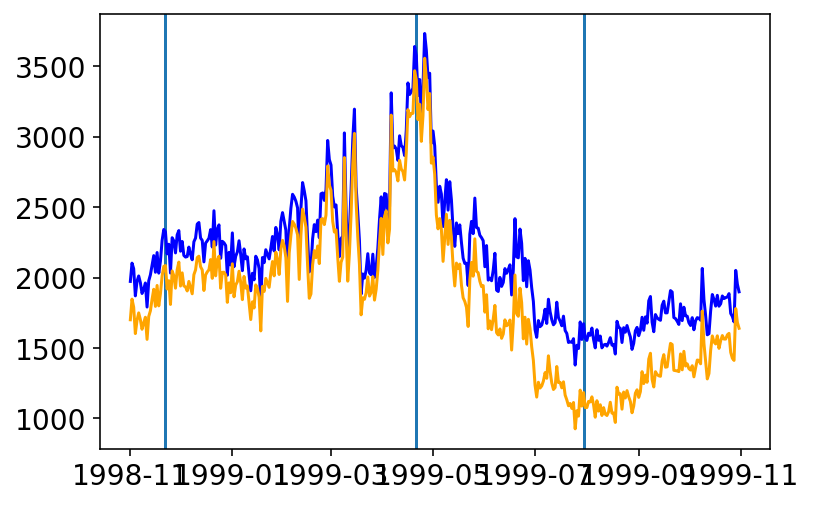

4086500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1032.671846
11297     949.732643
11298     942.718637
11299     906.849390
11300     823.789149
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


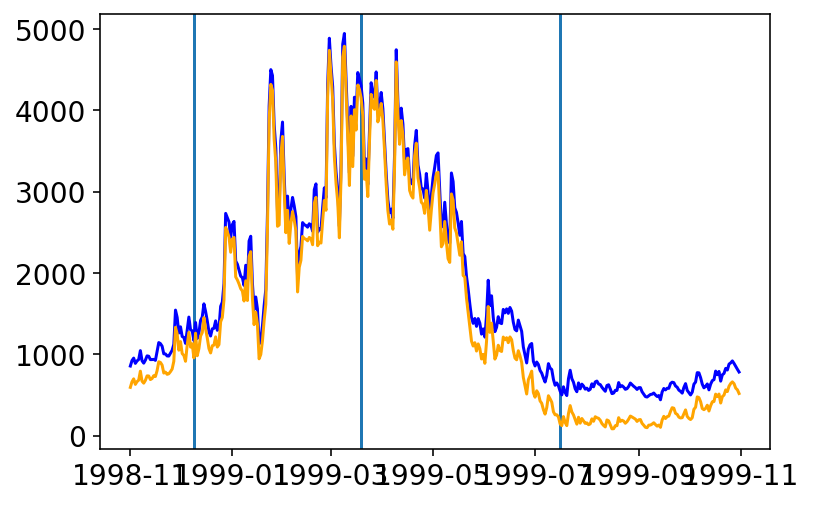

53674967.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
3261    1759.760710
3262    1754.011188
3263    1818.770252
3264    1853.156565
3265    1857.764781
Name: Q_impact, Length: 3266, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:435: RuntimeWarning: divide by zero encountered in double_scalars
  baseflow_lowduration_diff = (baseflow_lowduration_impact-baseflow_lowduration)/baseflow_lowduration


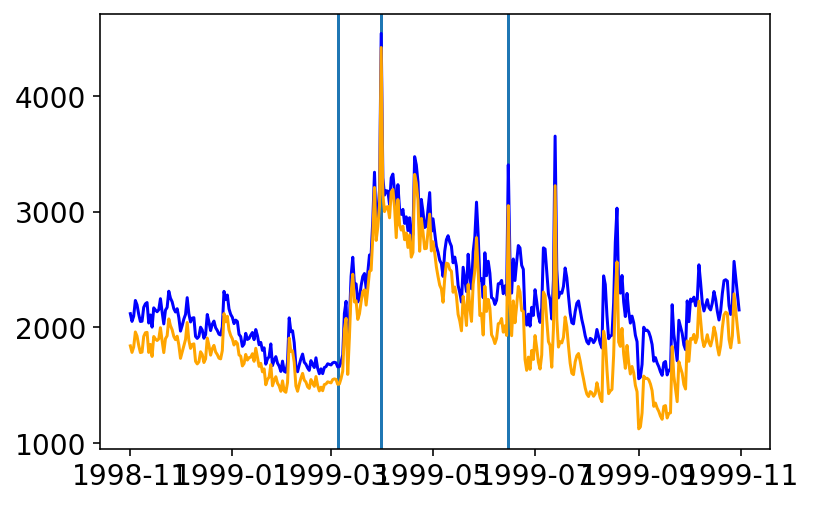

5424057.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
8739    3561.157388
8740    3510.940584
8741    3328.402731
8742    2744.746182
8743    2506.485682
Name: Q_impact, Length: 8744, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


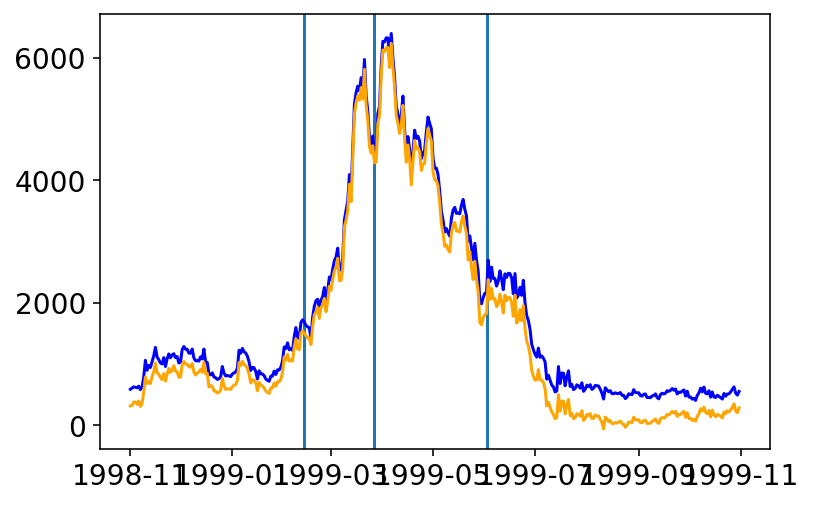

5331833.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
9105    1642.151716
9106    1601.420249
9107    1618.891318
9108    1604.929189
9109    1597.582137
Name: Q_impact, Length: 9110, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipytho

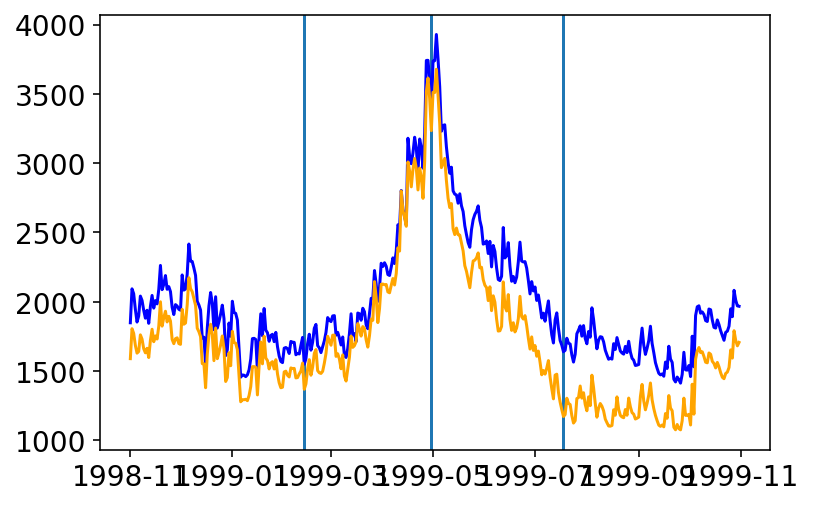

4085395.csv


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1368: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
4651    180.916839
4652     -1.023693
4653     18.538773
4654    177.489286
4655     25.335376
Name: Q_impact, Length: 4656, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1368: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(
/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82

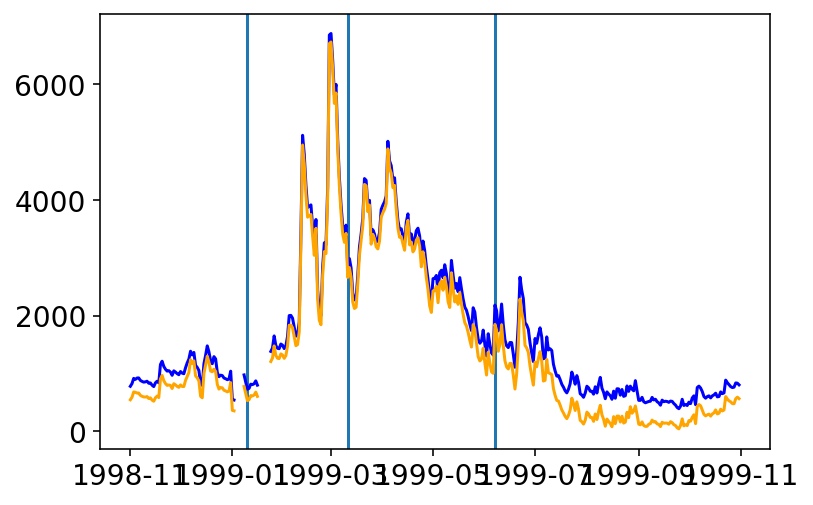

4073365.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
7278    3364.911204
7279    3306.437338
7280    3250.298635
7281    3196.729933
7282    3154.046827
Name: Q_impact, Length: 7283, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

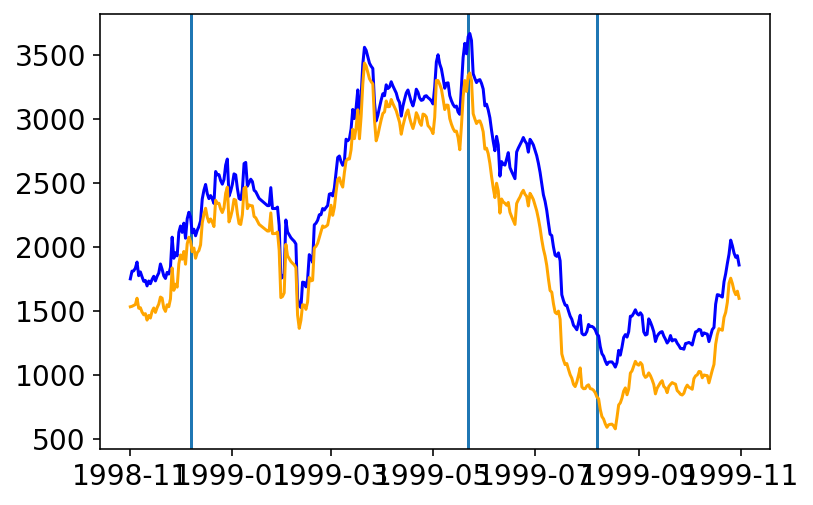

407809265.csv


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1368: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
6112    668.765042
6113    729.084200
6114    808.356984
6115    942.049863
6116    909.484408
Name: Q_impact, Length: 6117, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1368: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


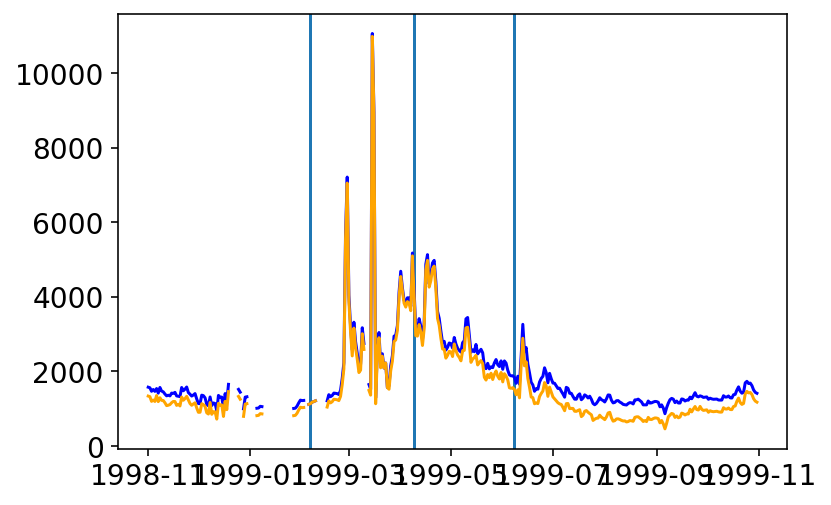

4071000.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2278.710412
11297    2282.931222
11298    2240.057853
11299    2189.005769
11300    2171.504593
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


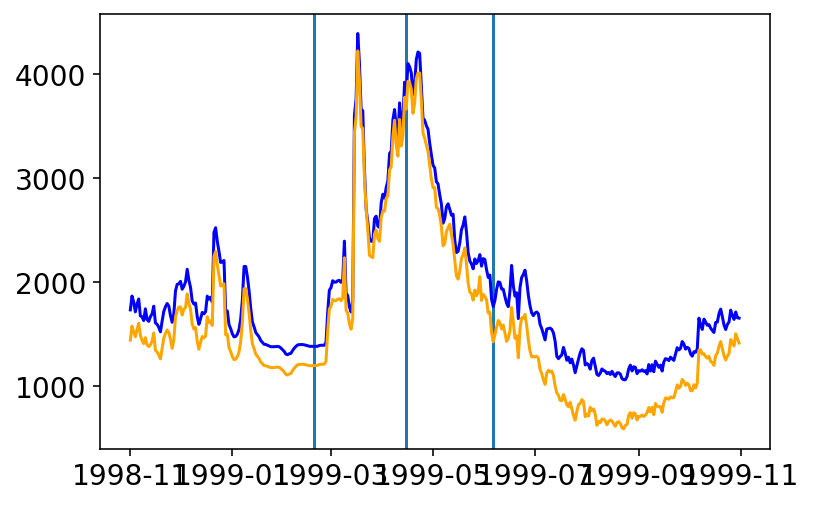

5407470.csv
0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
6966   NaN
6967   NaN
6968   NaN
6969   NaN
6970   NaN
Name: Q_impact, Length: 6971, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipytho

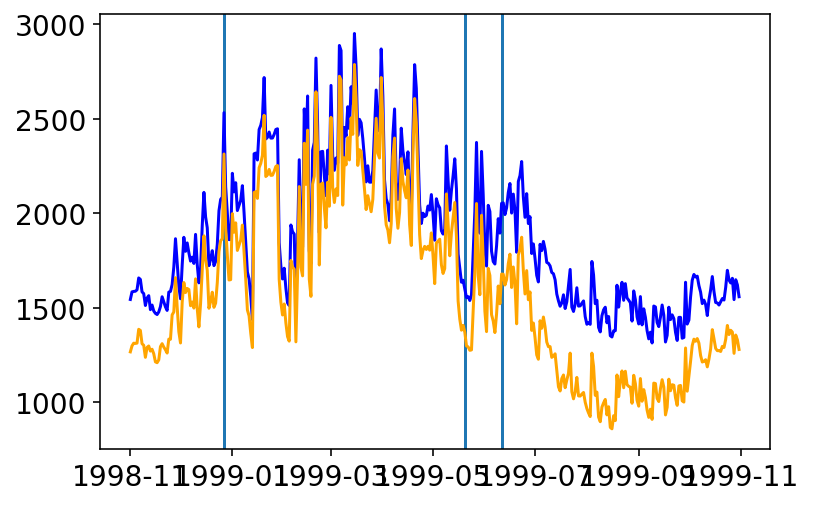

4067500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2625.405990
11297    2701.613405
11298    2727.712990
11299    2606.958651
11300    2333.753034
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

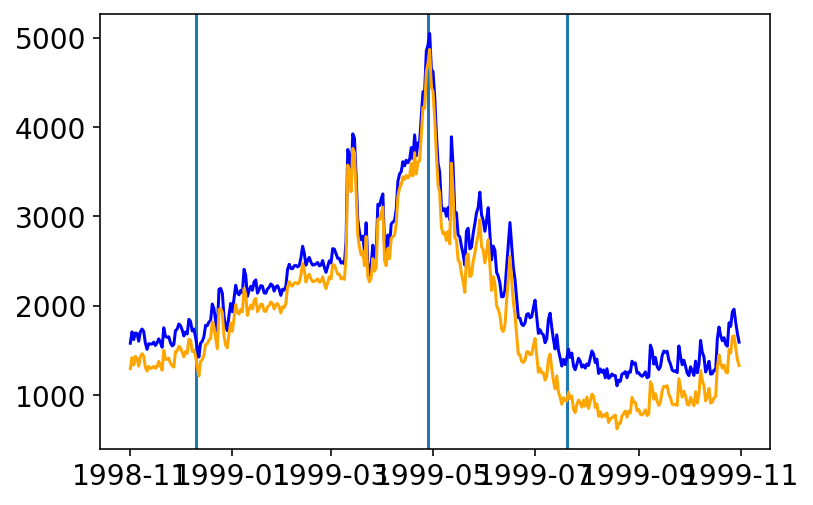

4063000.csv
0        1873.154110
1        1763.995080
2        2072.762423
3        1978.105196
4        2209.170853
            ...     
11296    3317.574239
11297    3458.525384
11298    2983.589519
11299    2695.989147
11300    2777.689777
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

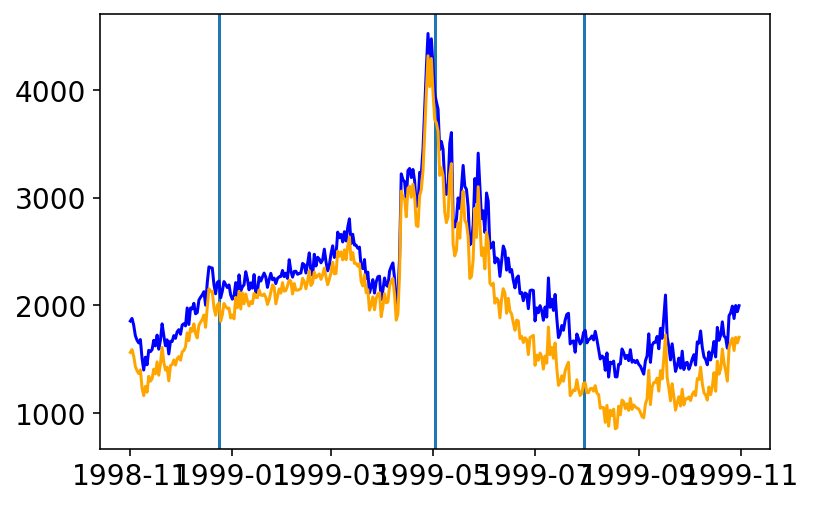

5423510.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
5382    1007.091035
5383     712.724178
5384     667.102542
5385     732.713039
5386     667.499125
Name: Q_impact, Length: 5387, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipytho

<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(h

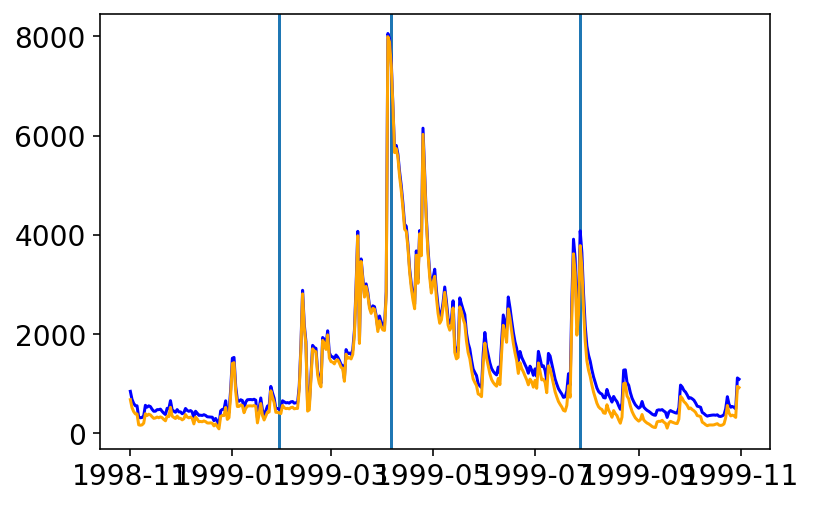

5342000.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
8374    1944.674455
8375    1935.614027
8376    1955.605016
8377    1961.516220
8378    1967.175997
Name: Q_impact, Length: 8379, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

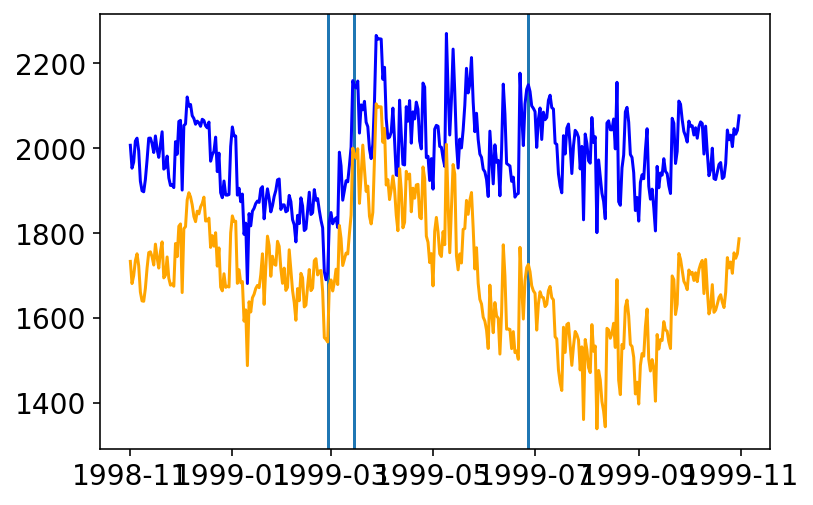

4085427.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1288.355128
11297    1174.365718
11298    1088.211670
11299    1041.007472
11300    1023.339763
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: Run

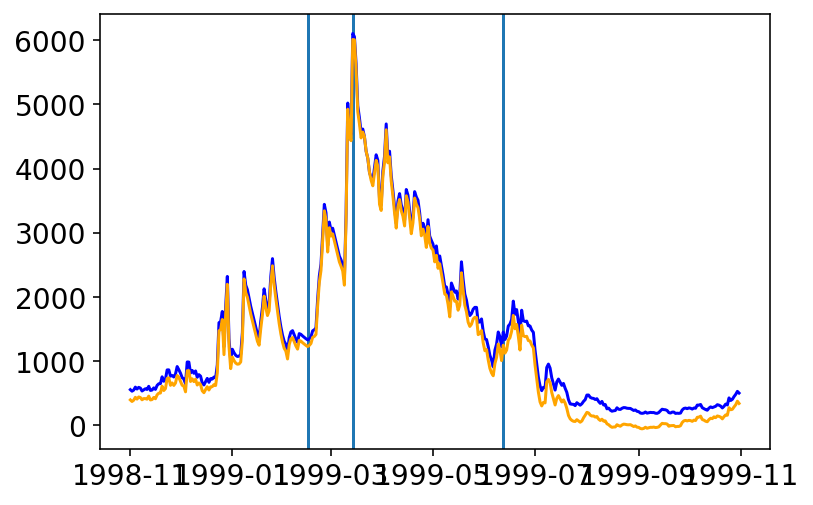

5428500.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
6548    4994.700194
6549    4972.972274
6550    4499.615090
6551    4363.709733
6552    4518.851612
Name: Q_impact, Length: 6553, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:435: RuntimeWarning: invalid value encountered in double_scalars
  baseflow_lowduration_diff = (baseflow_lowduration_impact-baseflow_lowduration)/baseflow_lowduration
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


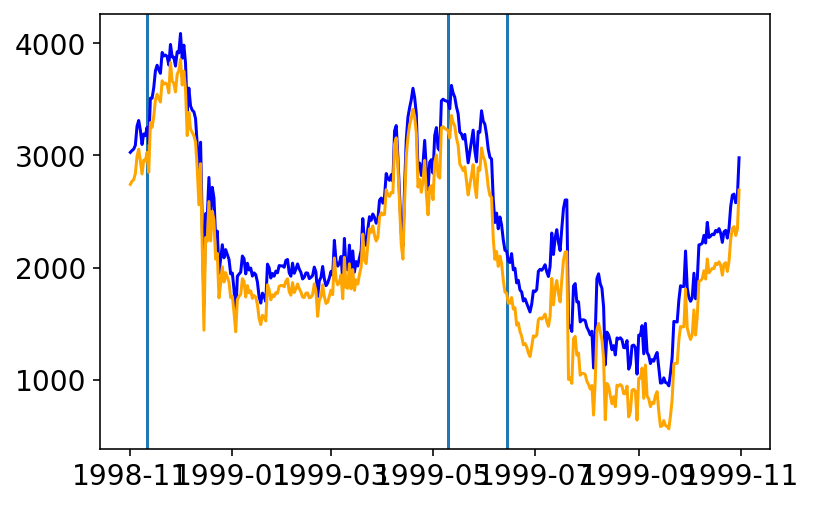

40854592.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
2826    1189.698463
2827     819.015466
2828     626.404479
2829     582.531275
2830     604.108059
Name: Q_impact, Length: 2831, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


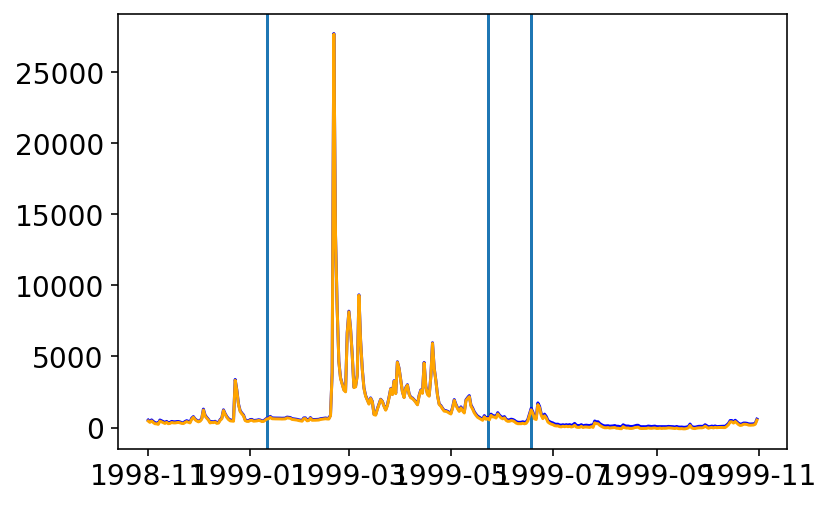

5367500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296            NaN
11297    1295.047183
11298    1308.102761
11299    1365.899750
11300    1451.107159
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipytho

<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean o

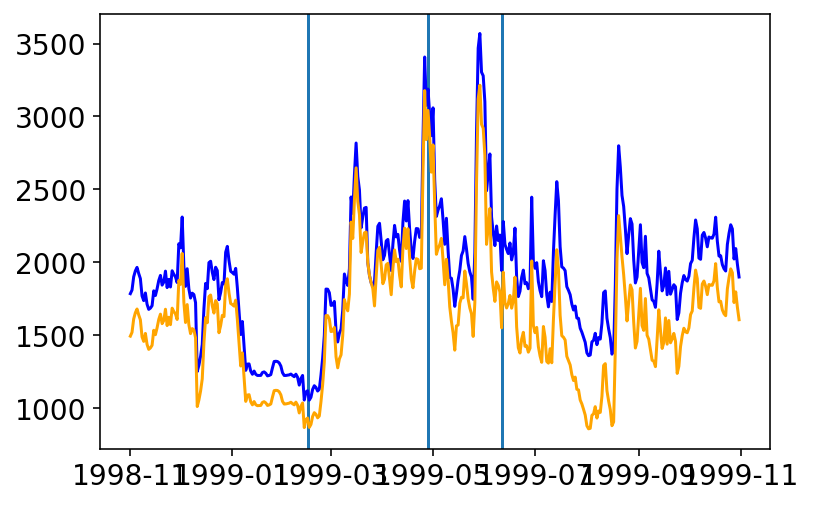

5427948.csv
0         71.257428
1         66.781093
2         80.937957
3        120.697273
4         92.383545
            ...    
11296    747.605164
11297    731.326678
11298    747.849991
11299    767.241983
11300    776.974805
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]


no baseflow duration stat


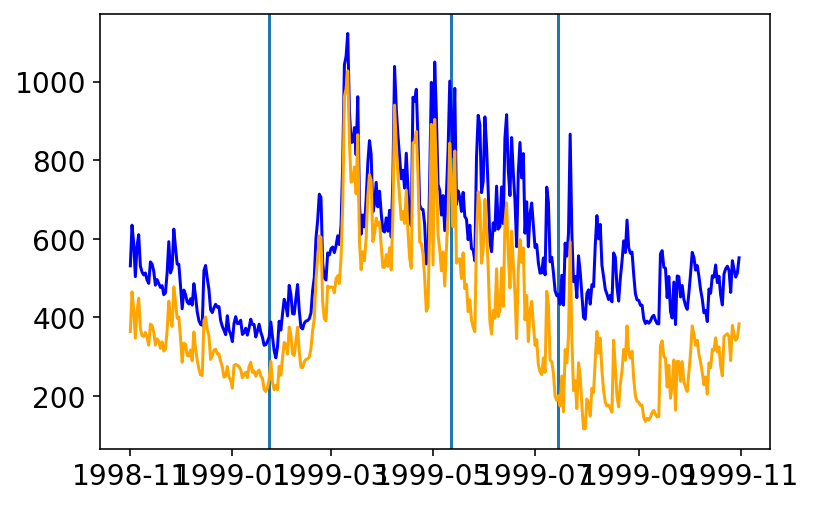

5408000.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1912.366764
11297    1896.720680
11298    1912.489045
11299    1907.929773
11300    1930.980204
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


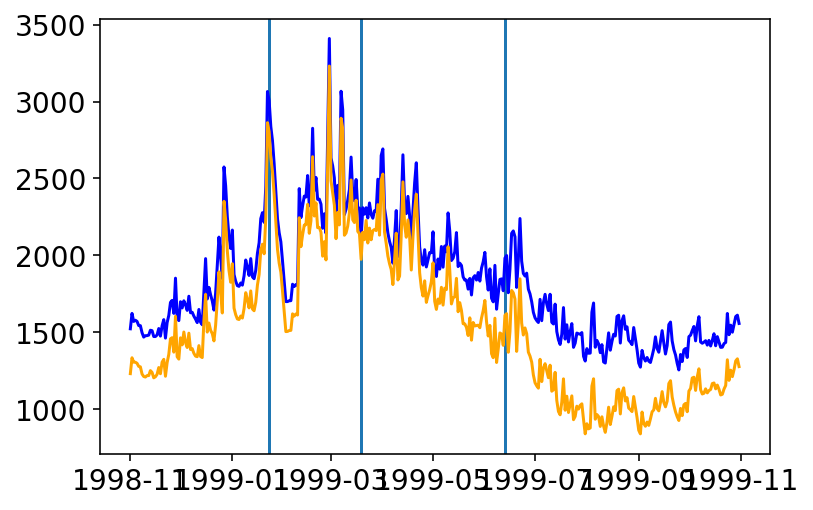

4025500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1817.841501
11297    1813.420160
11298    1821.270276
11299    1831.041611
11300    1826.221679
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


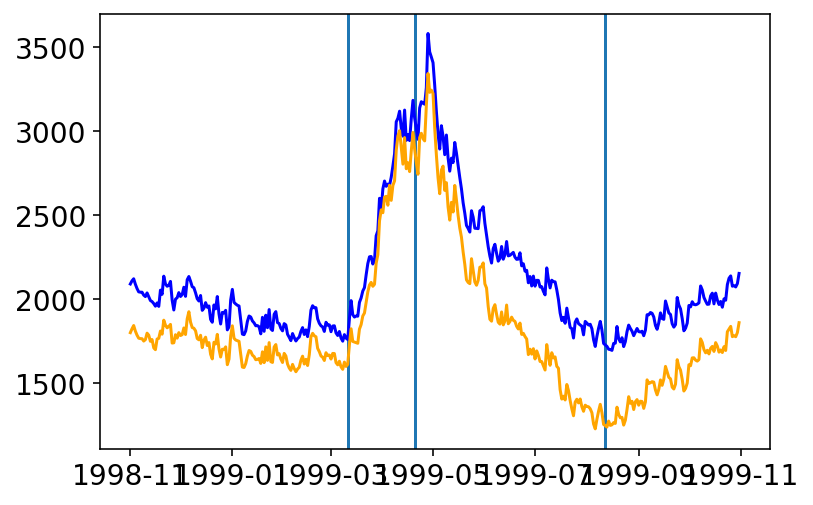

5404000.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1809.815743
11297    1753.374965
11298    1786.600574
11299    1774.272876
11300    1508.211967
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]


no baseflow duration stat


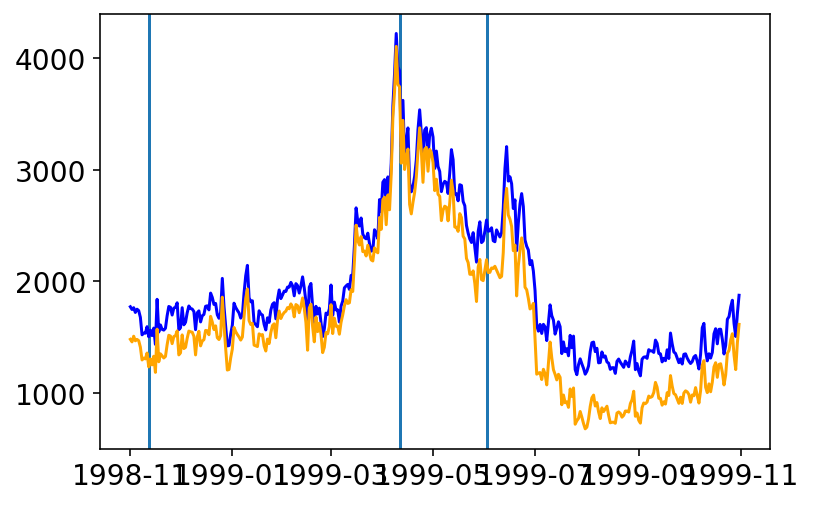

4066003.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2609.482676
11297    2576.626995
11298    2474.436414
11299    2194.889007
11300    2174.658978
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


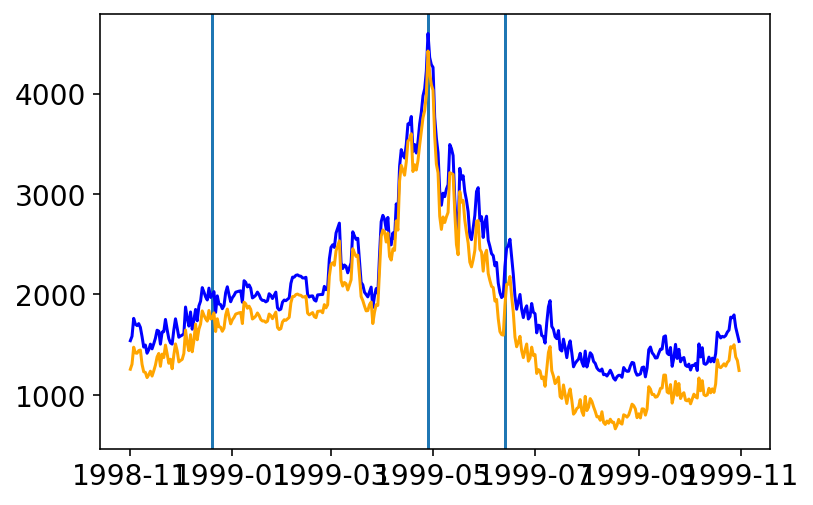

5382000.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
11296    975.248658
11297    861.313705
11298    839.724292
11299    847.391264
11300    845.964295
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


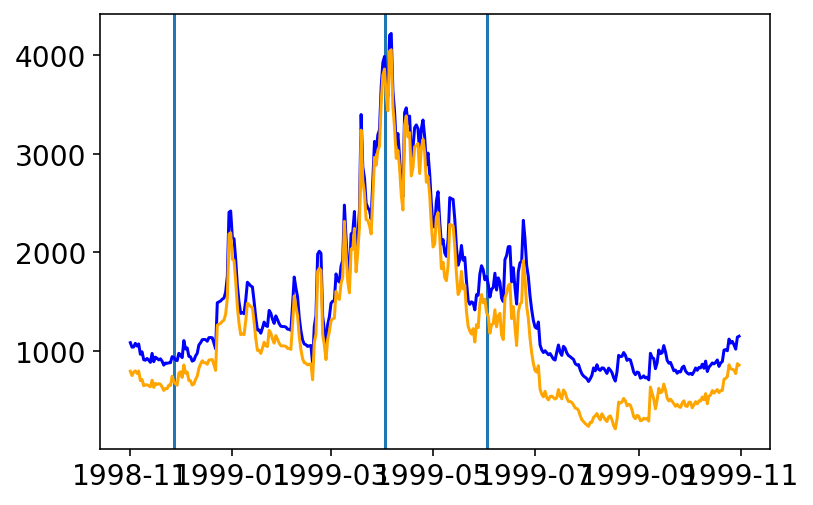

40871473.csv
0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
          ...    
9105    58.062080
9106    91.625317
9107    78.348320
9108    79.157807
9109    79.180301
Name: Q_impact, Length: 9110, dtype: float64


<ipython-input-29-82688014335a>:169: RuntimeWarning: divide by zero encountered in double_scalars
  baseflow_q95_diff = (baseflow_q95_impact-baseflow_q95)/baseflow_q95*100
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


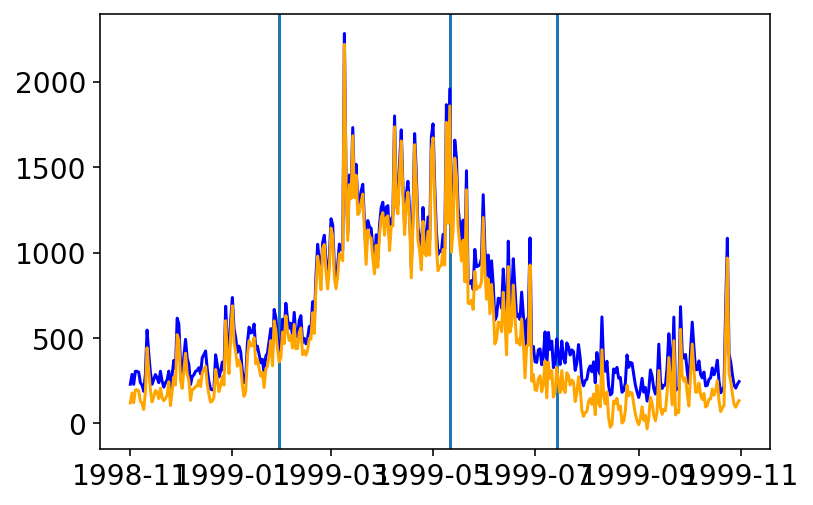

5394500.csv
0         854.137256
1         868.186422
2         854.137256
3         890.170765
4         870.788120
            ...     
11296    1484.490281
11297    1343.276306
11298    1431.651108
11299    1369.116603
11300    1367.831366
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:435: RuntimeWarning: invalid value encountered in double_scalars
  baseflow_lowduration_diff = (baseflow_lowduration_impact-baseflow_lowduration)/baseflow_lowduration


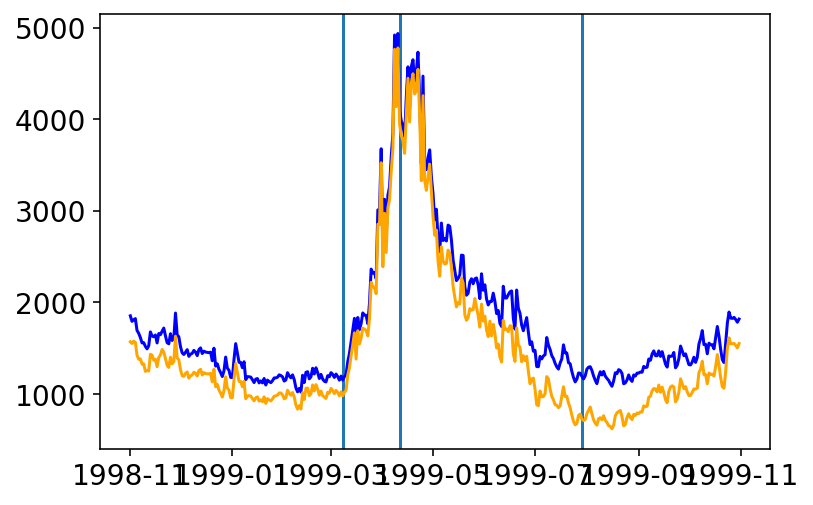

5378185.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
6477    1124.072308
6478    1118.020985
6479     930.871935
6480    1021.504194
6481    2589.621161
Name: Q_impact, Length: 6482, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipytho

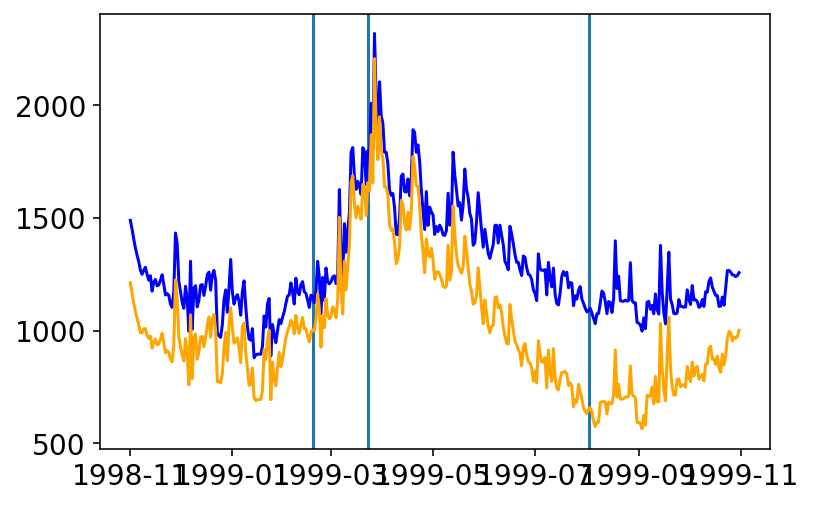

5426067.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
6913    1490.254447
6914    1420.013969
6915    1391.019337
6916    1357.270262
6917    1366.423688
Name: Q_impact, Length: 6918, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


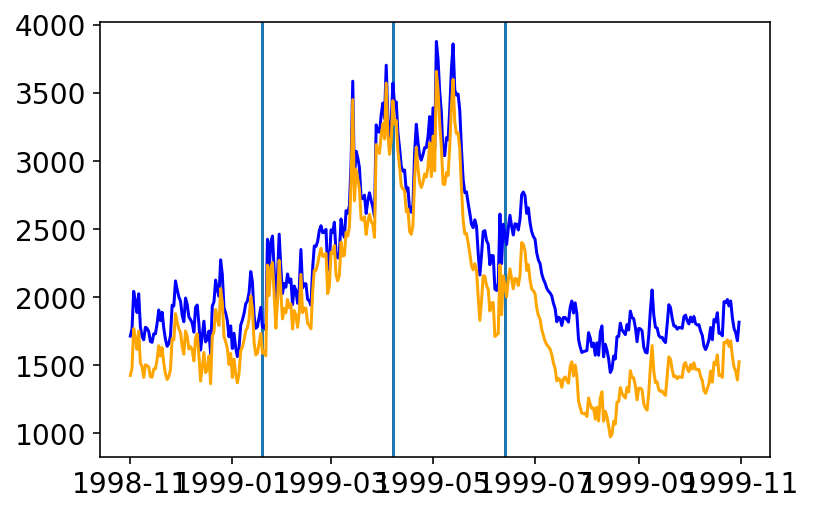

4087159.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
11296    105.255997
11297    101.443283
11298     97.081010
11299     92.631437
11300     98.145500
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]


no baseflow duration stat


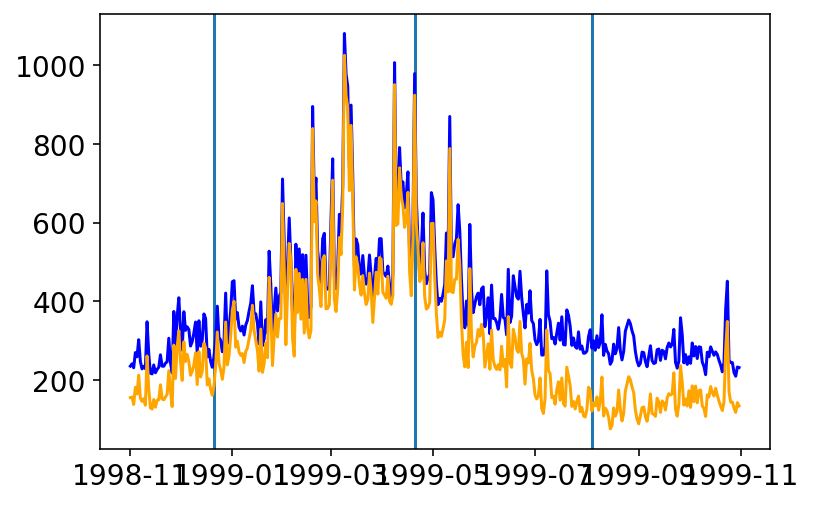

5357215.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
10931    2109.947022
10932    2098.073746
10933    2097.720202
10934    2089.531361
10935    2082.487037
Name: Q_impact, Length: 10936, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


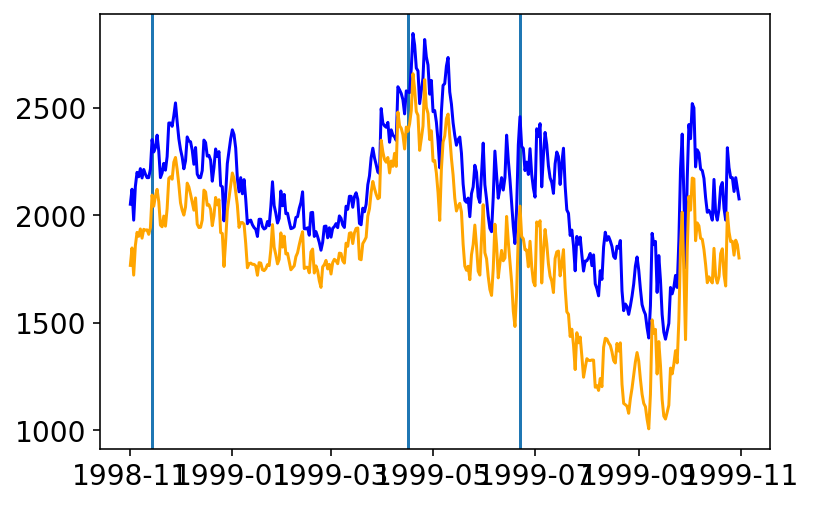

4087170.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
4356    1435.832443
4357    1542.339253
4358    1271.574018
4359    -188.146661
4360     856.337797
Name: Q_impact, Length: 4361, dtype: float64


<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:435: RuntimeWarning: divide by zero encountered in double_scalars
  baseflow_lowduration_diff = (baseflow_lowduration_impact-baseflow_lowduration)/baseflow_lowduration


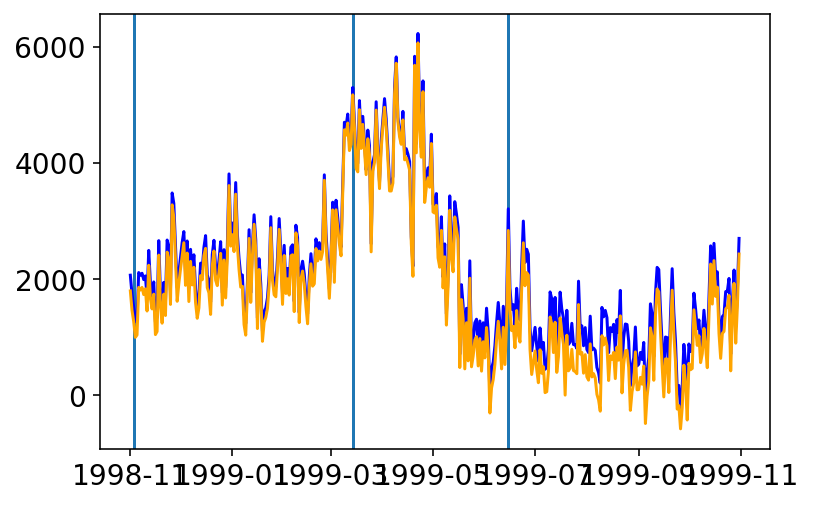

40871488.csv
0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
          ...    
9105    74.006153
9106    72.367772
9107    67.142682
9108    59.235516
9109    59.494712
Name: Q_impact, Length: 9110, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


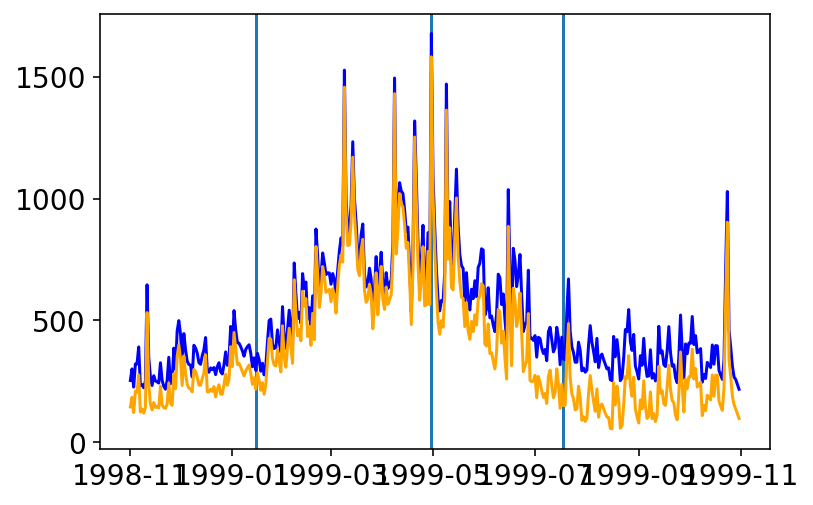

4084445.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
10931    3807.531691
10932    3786.587844
10933    3311.187548
10934    2846.517738
10935    2866.074324
Name: Q_impact, Length: 10936, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


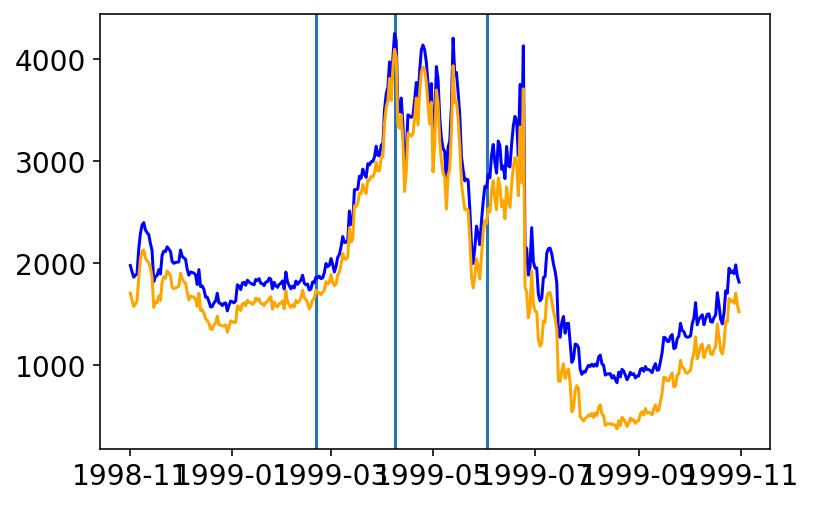

40869416.csv
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
6548    145.689289
6549    142.284039
6550    140.213422
6551    130.489462
6552    137.158407
Name: Q_impact, Length: 6553, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


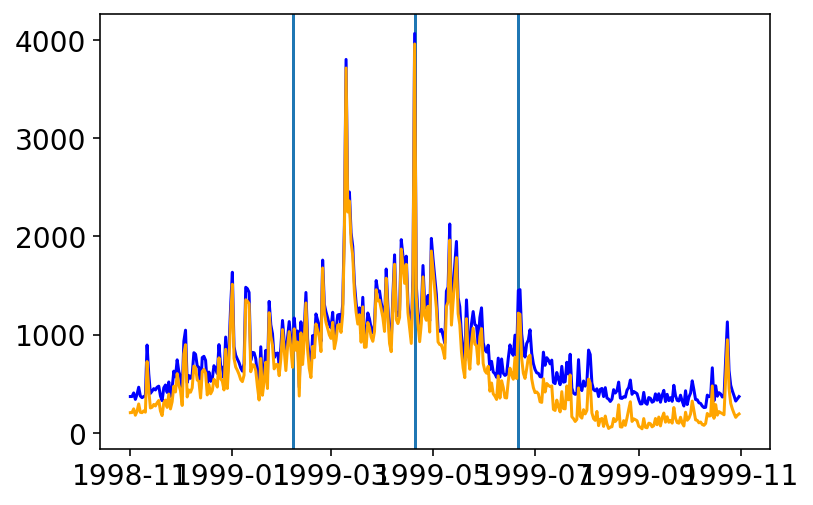

5344490.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
5087    1112.757627
5088    1480.208980
5089    1561.190121
5090    1183.931061
5091     699.075014
Name: Q_impact, Length: 5092, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


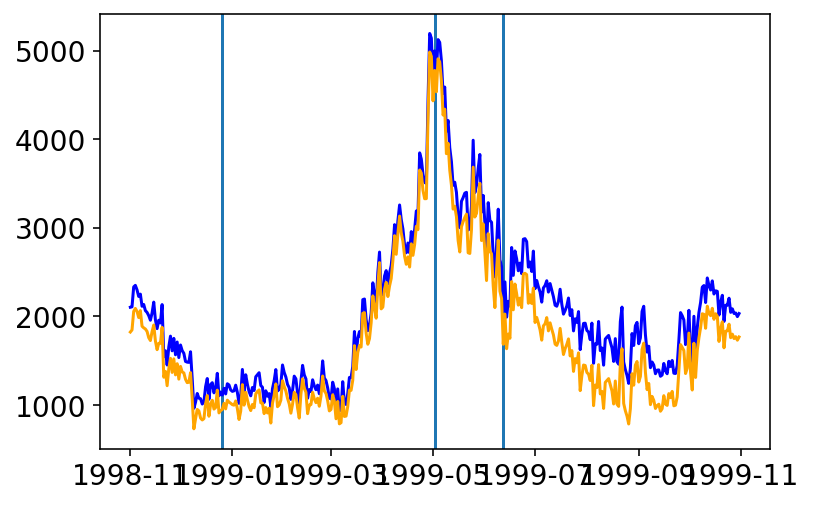

40734644.csv
0       156.832181
1       162.294559
2       172.825122
3       194.562006
4       186.452909
           ...    
2460    190.170768
2461    266.473483
2462    197.060296
2463    159.712065
2464    149.360822
Name: Q_impact, Length: 2465, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


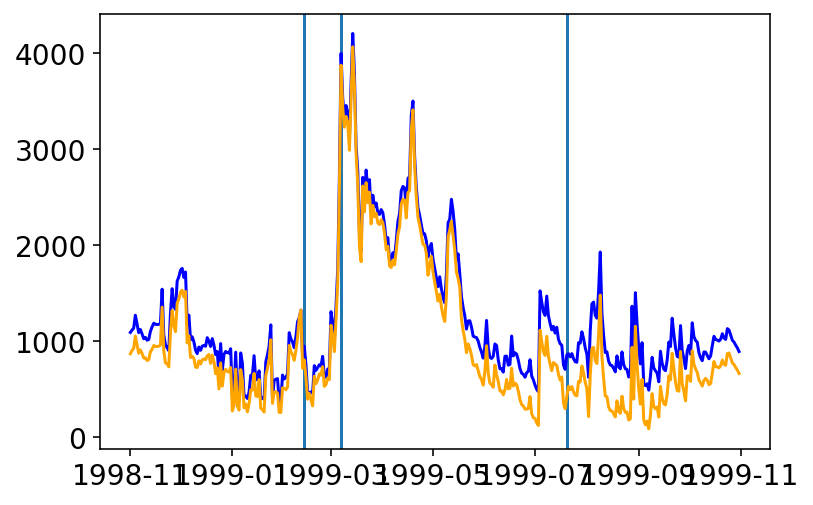

4026390.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
4967            NaN
4968            NaN
4969            NaN
4970    3591.266498
4971    2532.816059
Name: Q_impact, Length: 4972, dtype: float64


<ipython-input-29-82688014335a>:169: RuntimeWarning: divide by zero encountered in double_scalars
  baseflow_q95_diff = (baseflow_q95_impact-baseflow_q95)/baseflow_q95*100
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


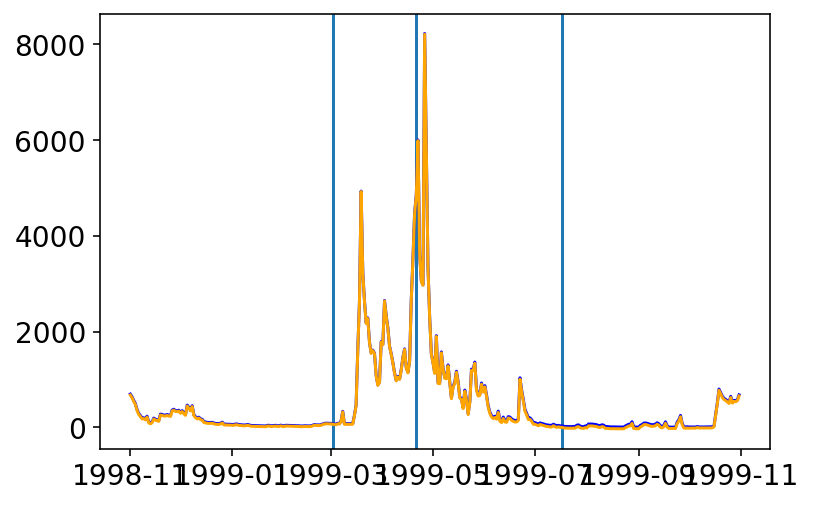

4087204.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
11296    425.690384
11297    378.326559
11298    356.434058
11299    335.997278
11300    320.626024
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


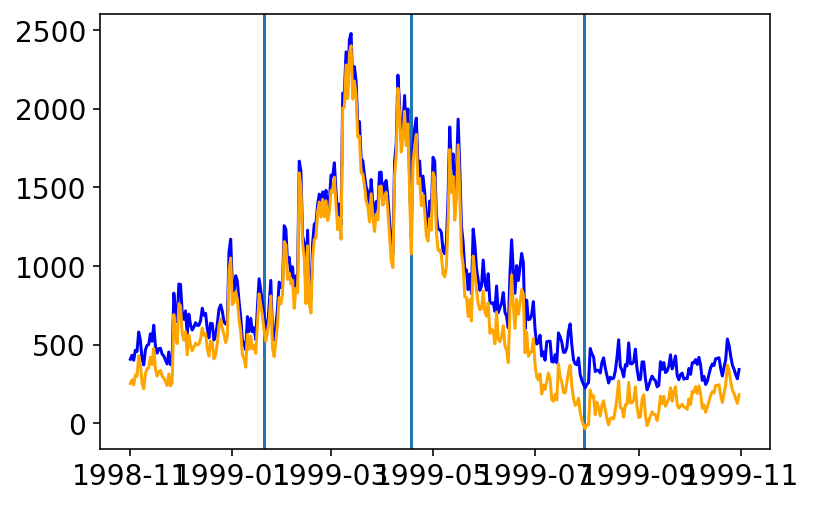

5369500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1392.551003
11297    1318.097177
11298    1193.873091
11299    1227.745365
11300    1270.308731
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


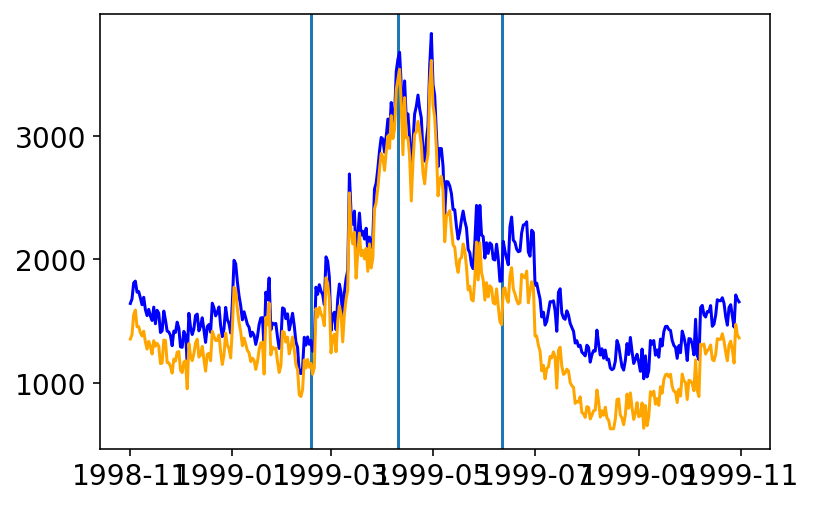

5543830.csv
0         669.645497
1         676.550932
2         667.101389
3         912.062619
4         687.090807
            ...     
11296    1192.046318
11297    1156.201113
11298    1126.450747
11299     939.645388
11300     960.735428
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]


no baseflow duration stat


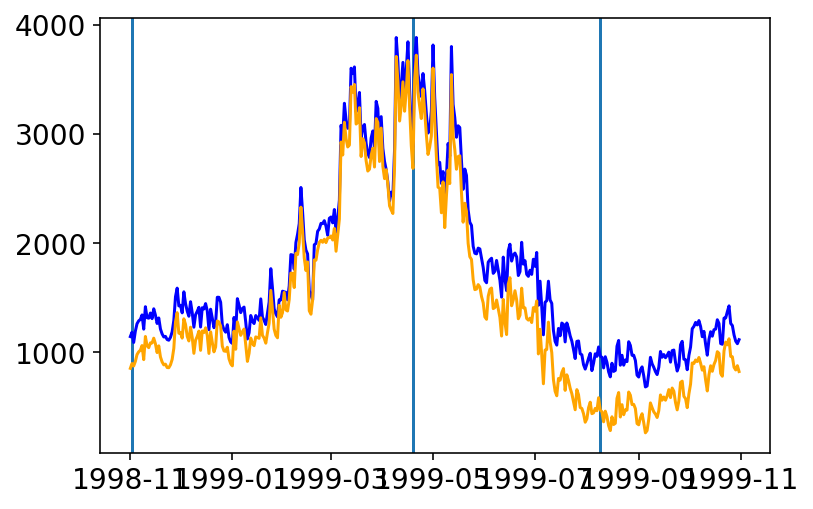

5365500.csv
0         248.651793
1        1116.663670
2        1199.077964
3         836.038361
4         990.889855
            ...     
11296    1568.985700
11297    1201.978405
11298    1337.532170
11299    1478.215072
11300    1288.913256
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]


no baseflow duration stat


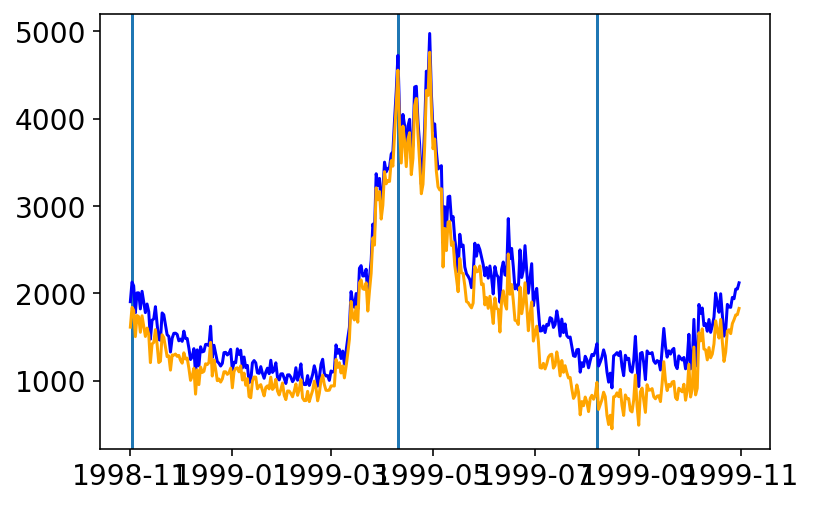

5434500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2026.705250
11297    2004.970905
11298    1983.448182
11299    1974.580483
11300    1968.057697
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


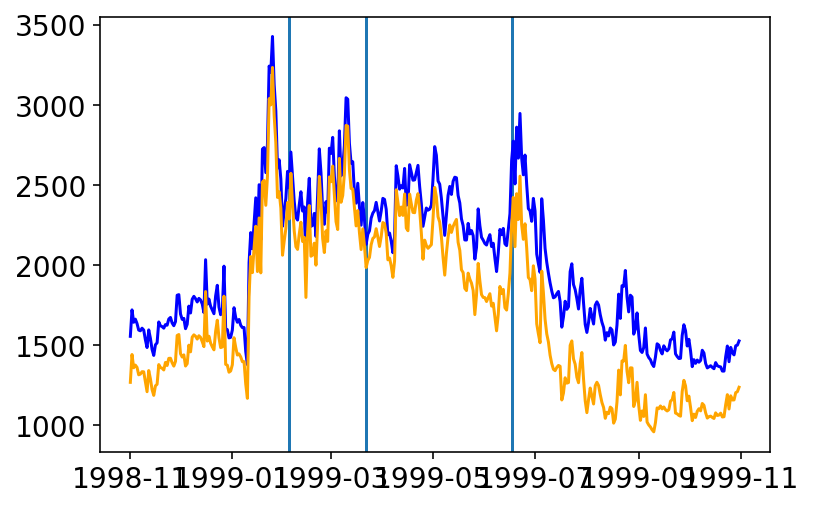

4074950.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2104.620804
11297    2056.111649
11298    2051.416972
11299    2031.950766
11300    2026.792510
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


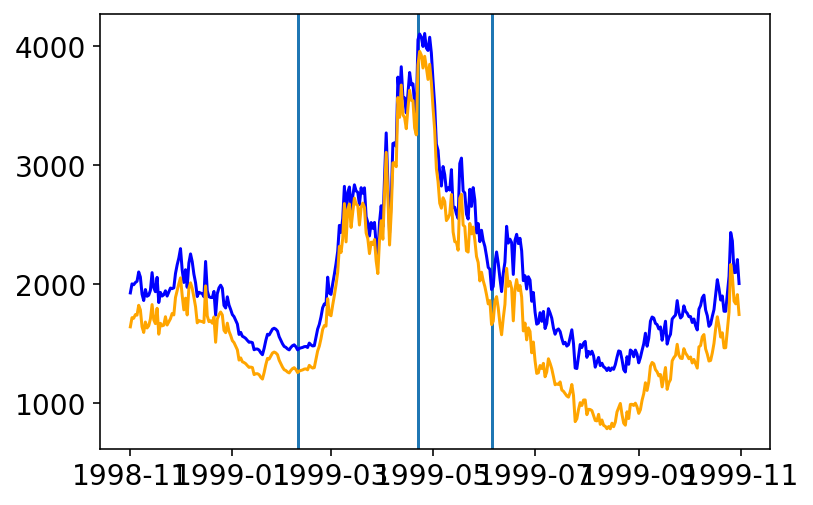

40871475.csv
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
9105    389.547747
9106    412.595891
9107    399.540857
9108    371.563291
9109    358.315646
Name: Q_impact, Length: 9110, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


no baseflow duration stat


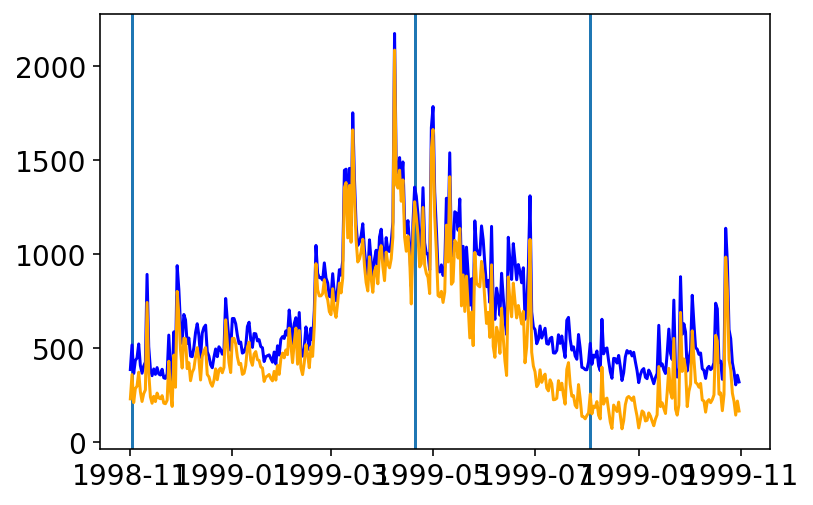

4024430.csv
0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
11296   NaN
11297   NaN
11298   NaN
11299   NaN
11300   NaN
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


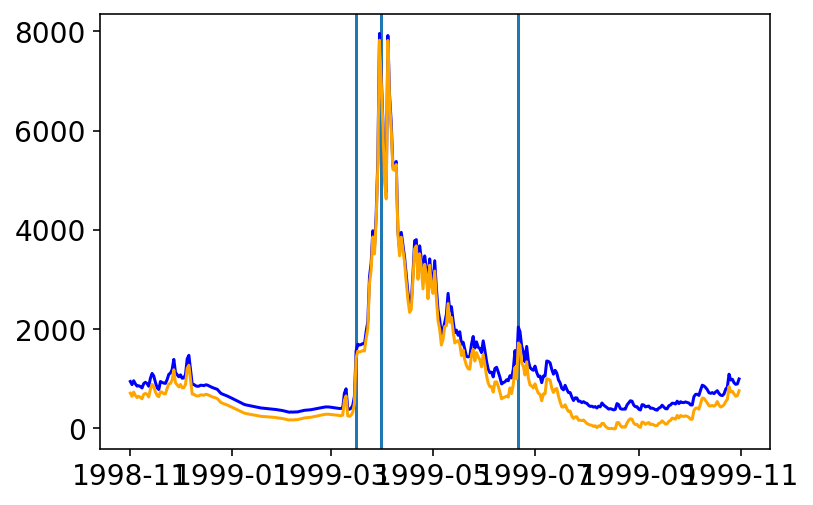

4085200.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
11296    952.121787
11297    919.381041
11298    900.421117
11299    888.663915
11300    889.749333
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: Run

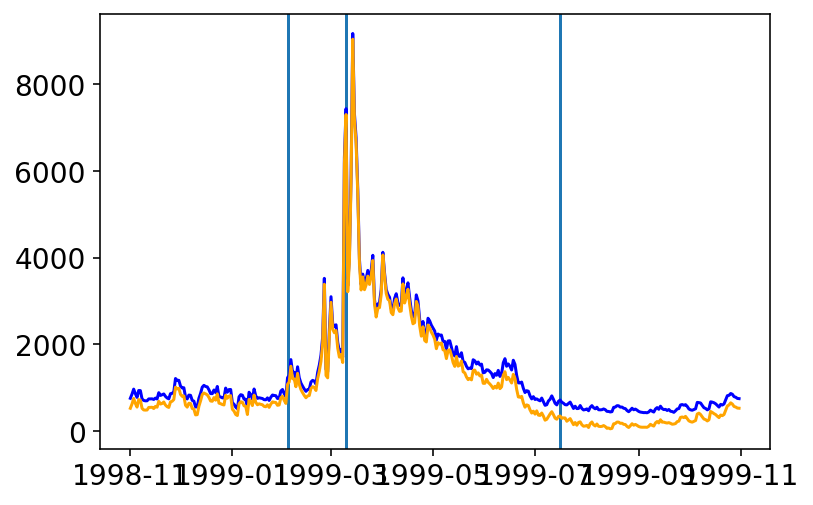

4027500.csv
0        1415.452156
1        1409.813925
2        1458.251452
3        1475.422427
4        1281.928605
            ...     
11296    1932.122237
11297    1848.733080
11298    1944.902004
11299    1924.622066
11300    1913.189065
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


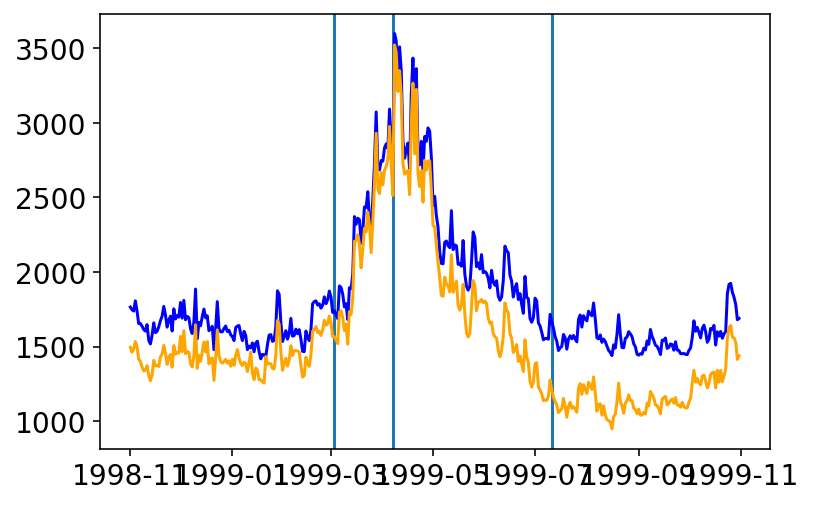

5430175.csv
0         997.974456
1        1167.828981
2         679.470848
3         668.551628
4        1125.629099
            ...     
11296    3303.614318
11297    3281.134008
11298    3286.230850
11299    3282.296611
11300    3294.213748
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


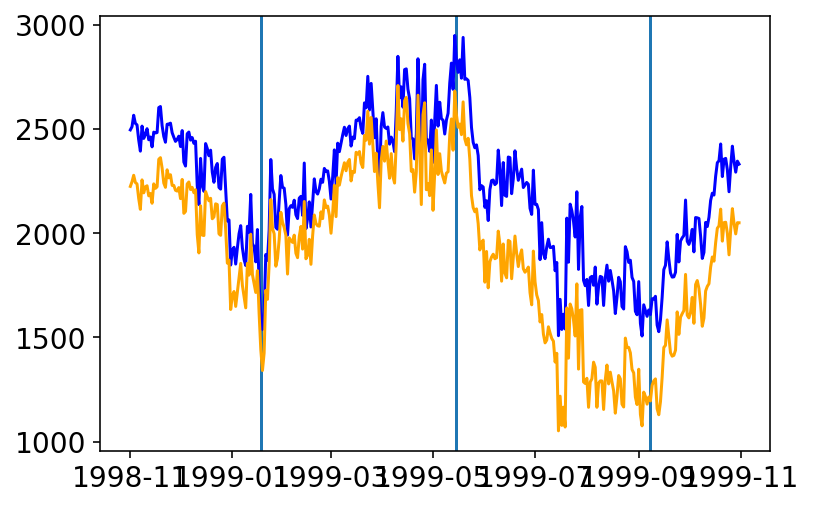

5378183.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
6477    1129.208005
6478    1151.595402
6479     952.539610
6480    1069.724669
6481    2821.875184
Name: Q_impact, Length: 6482, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

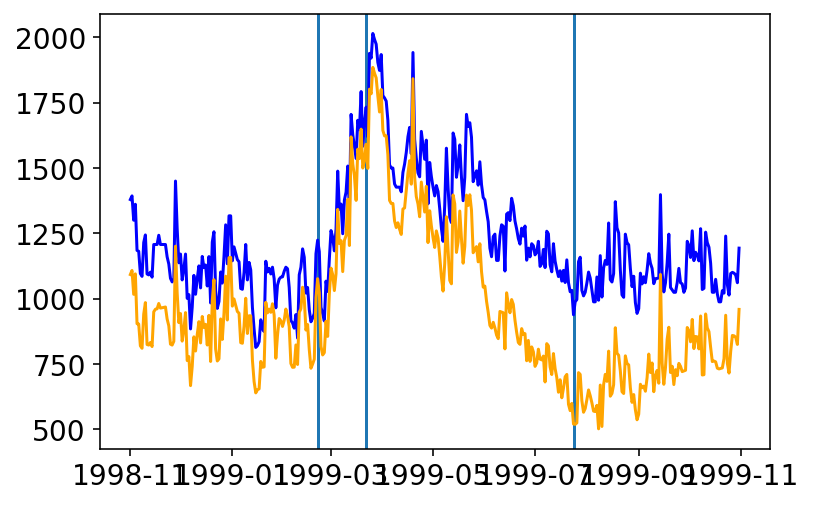

5431032.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
5382    4102.176858
5383    2906.741330
5384    2313.194020
5385    2115.276130
5386    2044.185827
Name: Q_impact, Length: 5387, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


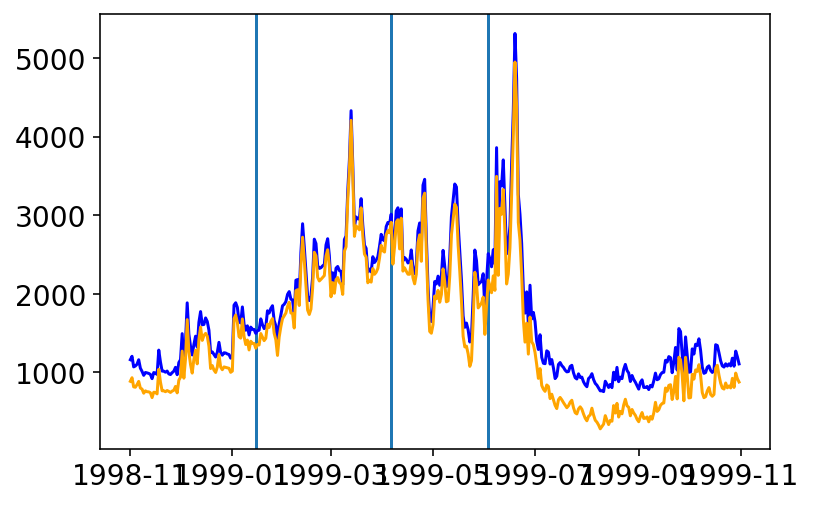

5425912.csv
0         255.243459
1         250.539453
2         253.198239
3        2439.538443
4        1671.149280
            ...     
11296    2960.058162
11297    2972.201224
11298    2976.561430
11299    2978.047470
11300    2982.174023
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


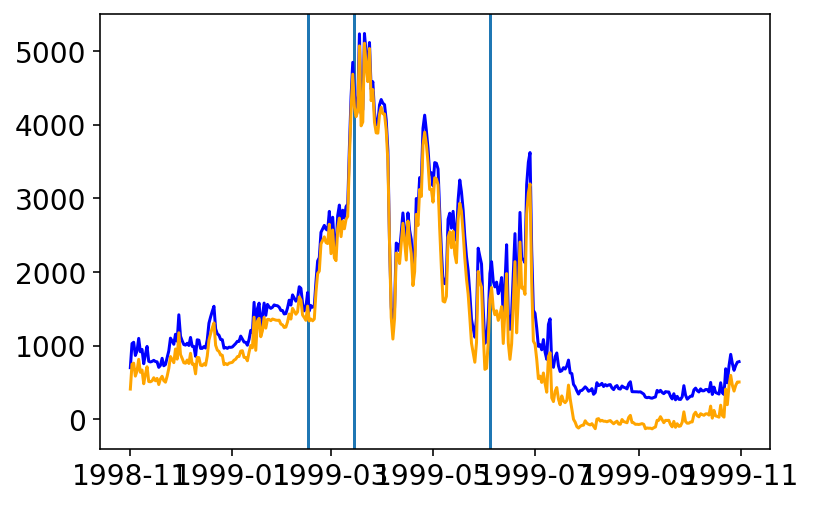

5404116.csv
0        394.009658
1        396.412156
2        395.511219
3        403.119129
4        394.209866
           ...     
8517    1927.131586
8518    1833.633258
8519    1964.764152
8520    5104.024405
8521    3157.403942
Name: Q_impact, Length: 8522, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]


no baseflow duration stat


<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


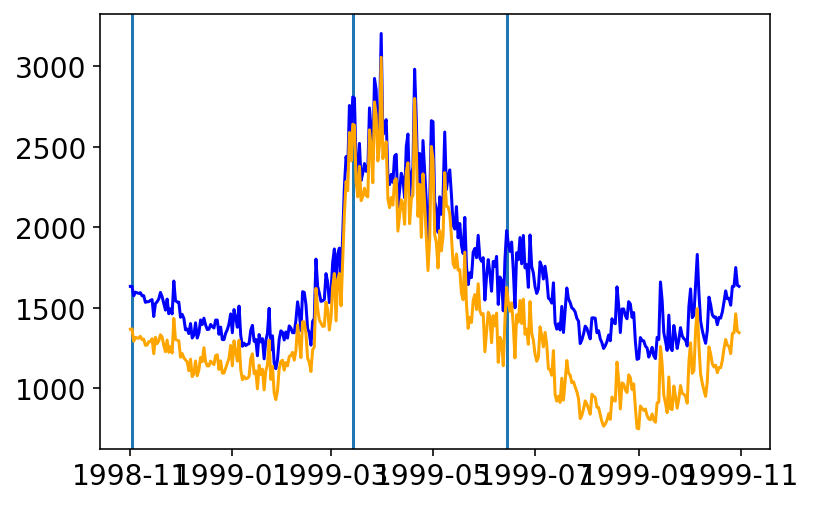

4081000.csv
0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
4531   NaN
4532   NaN
4533   NaN
4534   NaN
4535   NaN
Name: Q_impact, Length: 4536, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


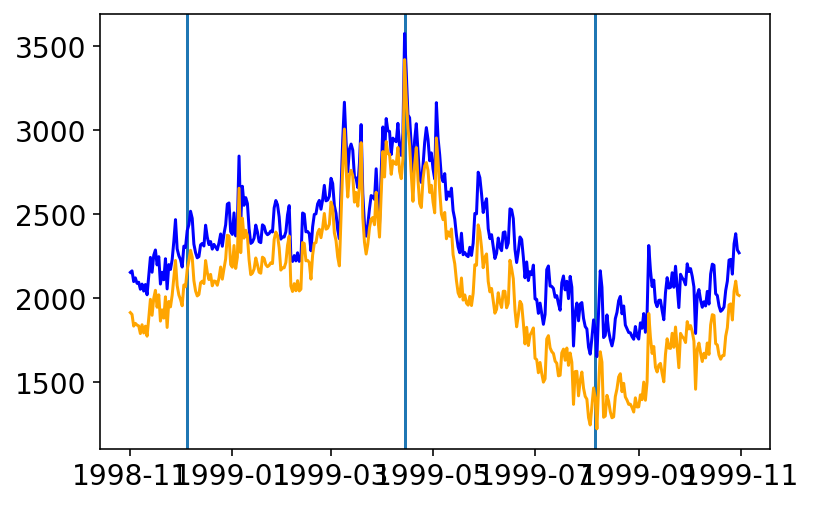

5406476.csv
0       1174.318426
1       1157.218211
2       1167.322883
3       1231.215506
4       1173.541143
           ...     
2077            NaN
2078            NaN
2079    1936.143014
2080    1897.374796
2081    1847.699477
Name: Q_impact, Length: 2082, dtype: float64
no baseflow duration stat


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/core/_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/Dana/miniconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1144: RuntimeWarning: Mean of empty slice.
  return a.std(axis) / a.mean(axis)
/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: inval

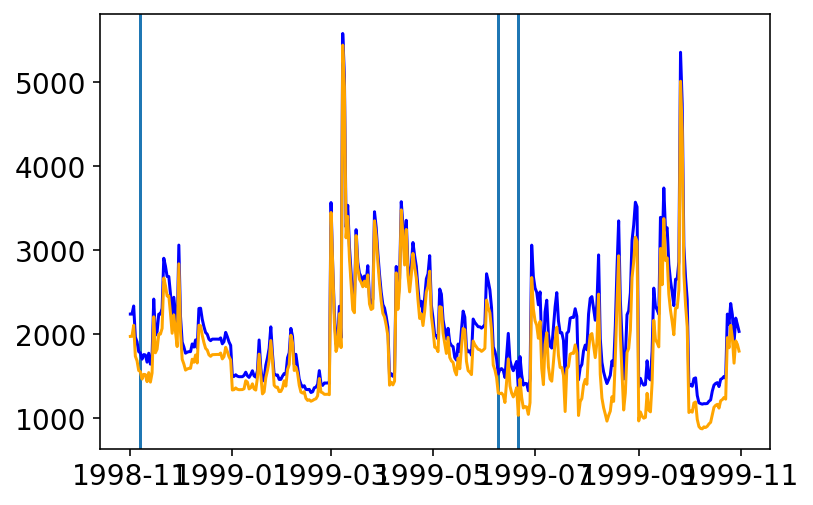

53813595.csv
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
4722    433.938888
4723    444.911424
4724    461.156488
4725    451.357852
4726    444.592330
Name: Q_impact, Length: 4727, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


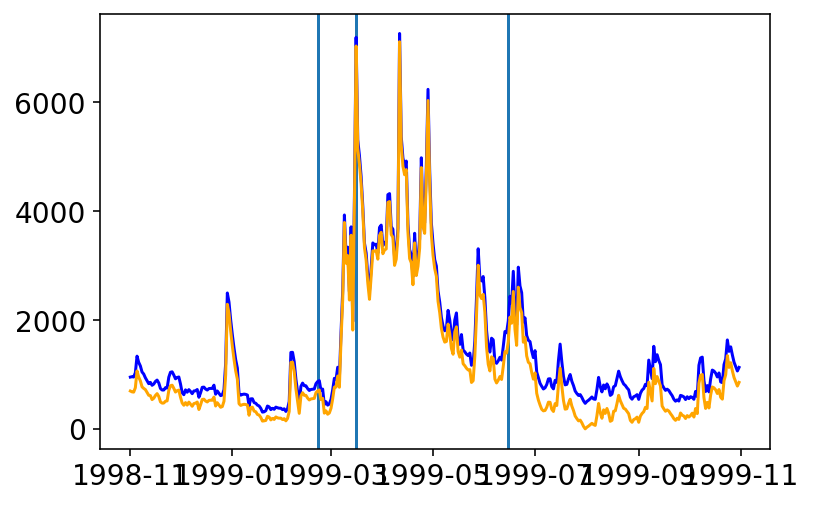

5396000.csv
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
4356    326.873251
4357    309.453328
4358    338.602638
4359    315.372374
4360    313.965464
Name: Q_impact, Length: 4361, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


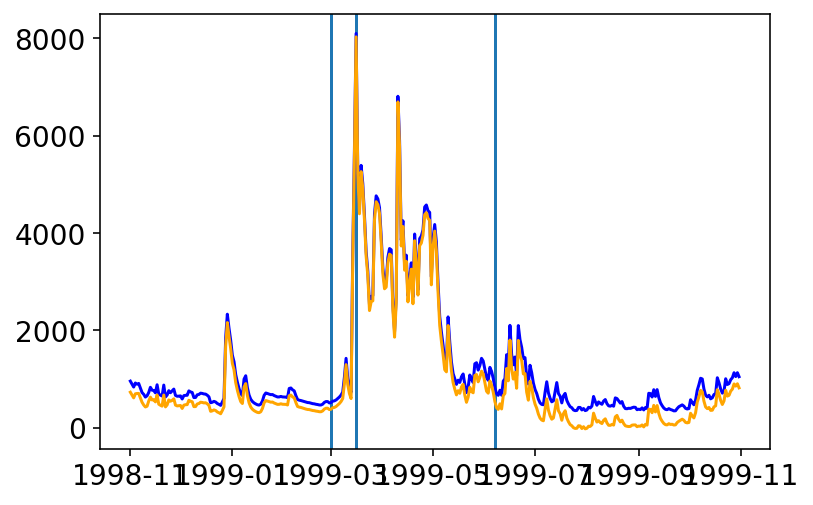

4027000.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
11296    831.367231
11297    612.037329
11298    805.349318
11299    771.556715
11300    721.591413
Name: Q_impact, Length: 11301, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:435: RuntimeWarning: invalid value encountered in double_scalars
  baseflow_lowduration_diff = (baseflow_lowduration_impact-baseflow_lowduration)/baseflow_lowduration


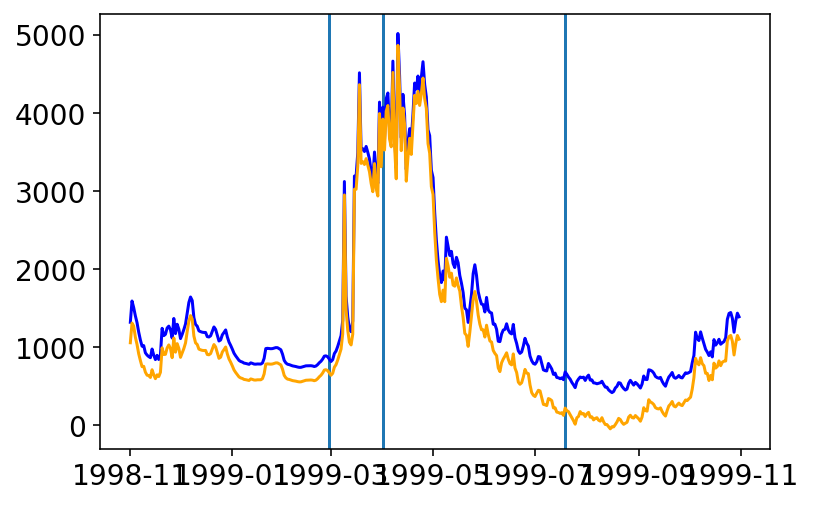

5406460.csv
0       1355.075245
1       1346.203285
2       1361.612479
3       1393.131287
4       1337.798269
           ...     
5747     822.869178
5748     795.859662
5749     909.600812
5750     970.310579
5751     973.553258
Name: Q_impact, Length: 5752, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipytho

<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


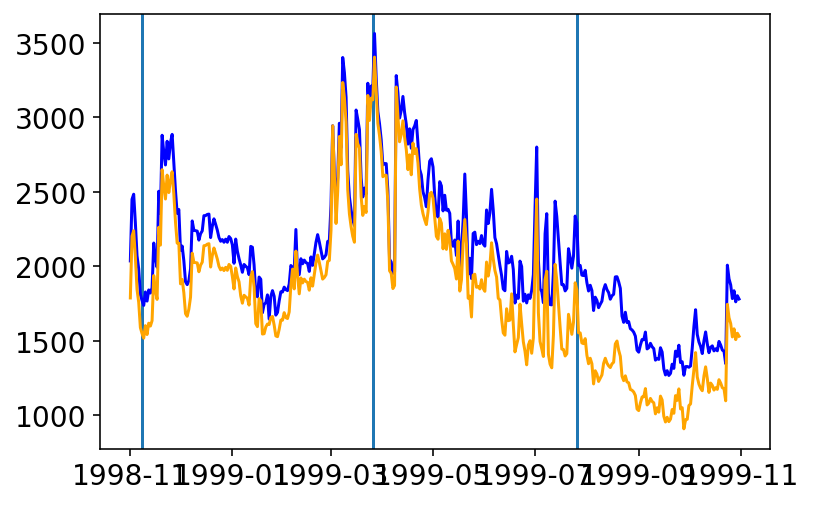

4087088.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
11296    258.877909
11297    248.059599
11298    258.105281
11299    248.445386
11300    231.234789
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


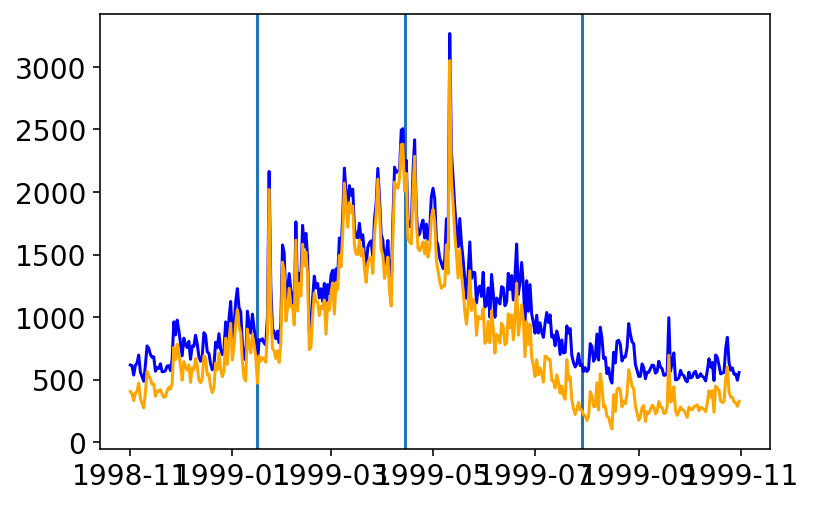

5406500.csv
0         969.153749
1         969.153749
2         969.153749
3                NaN
4         971.172820
            ...     
11296    2513.888940
11297    2508.324881
11298    2473.776144
11299    2482.777992
11300    2501.321047
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]


no baseflow duration stat


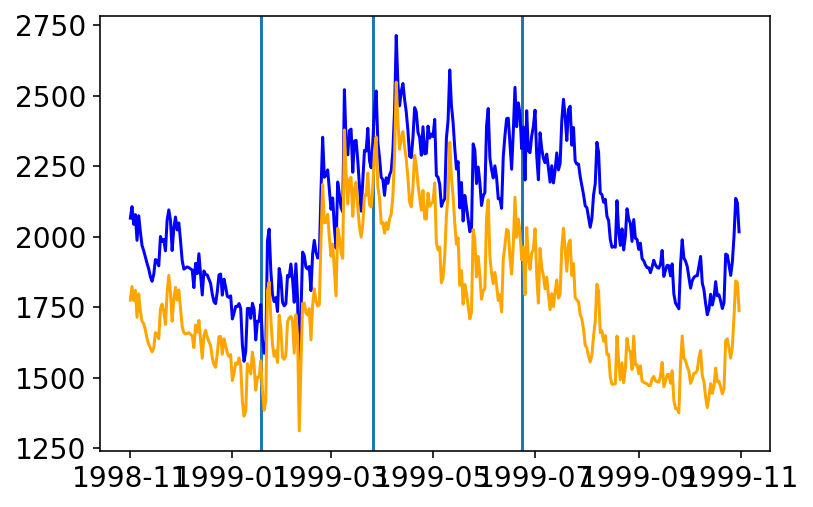

5402000.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
11296    299.515440
11297    263.099633
11298    239.149376
11299    225.852161
11300    219.582294
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

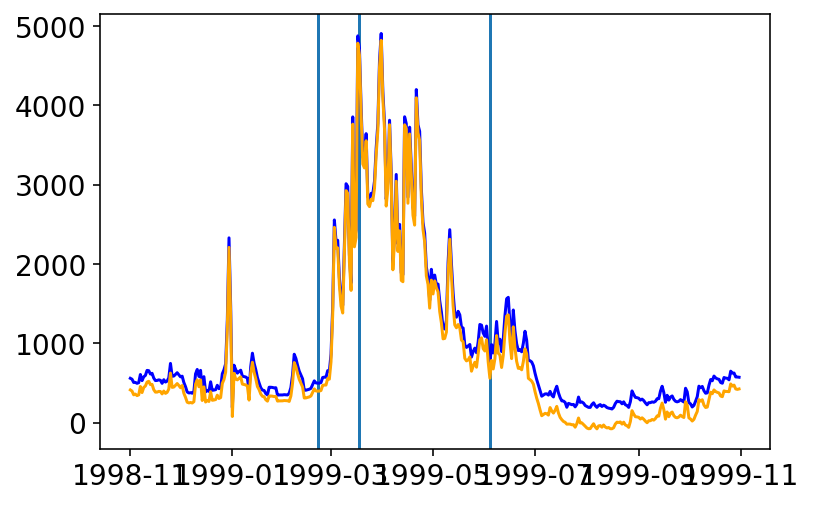

5401050.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2640.930161
11297    2593.693288
11298    2573.153324
11299    2539.678106
11300    2541.471588
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipyt

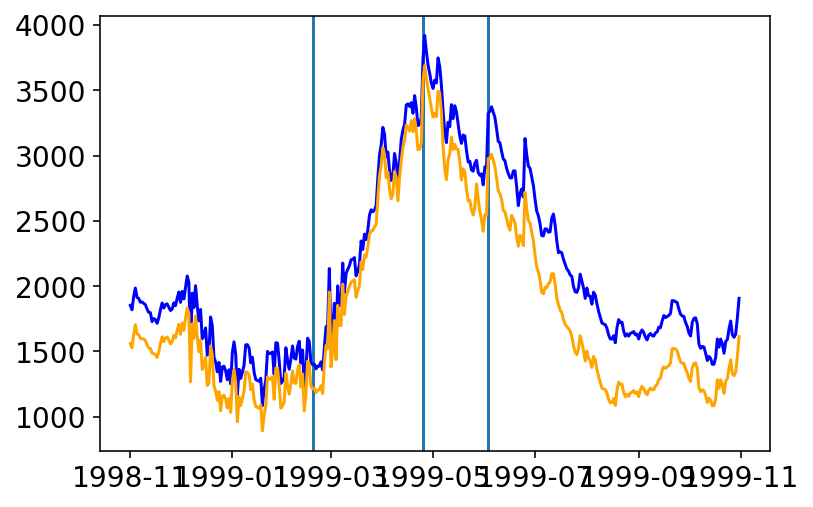

5430500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    2471.046631
11297    2446.908780
11298    2413.247001
11299    2341.994444
11300    2296.754104
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


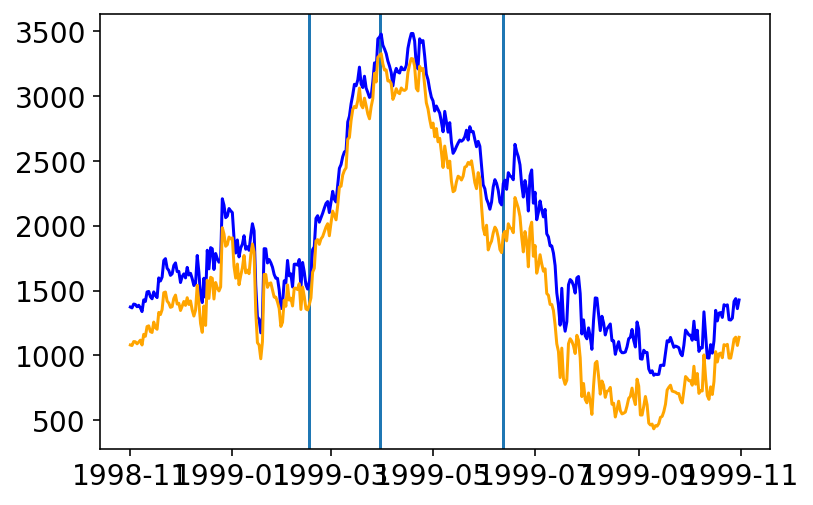

4064500.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
9105    1935.933630
9106    1413.249065
9107    1818.553571
9108    1815.992065
9109    1736.070008
Name: Q_impact, Length: 9110, dtype: float64


<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:435: RuntimeWarning: invalid value encountered in double_scalars
  baseflow_lowduration_diff = (baseflow_lowduration_impact-baseflow_lowduration)/baseflow_lowduration


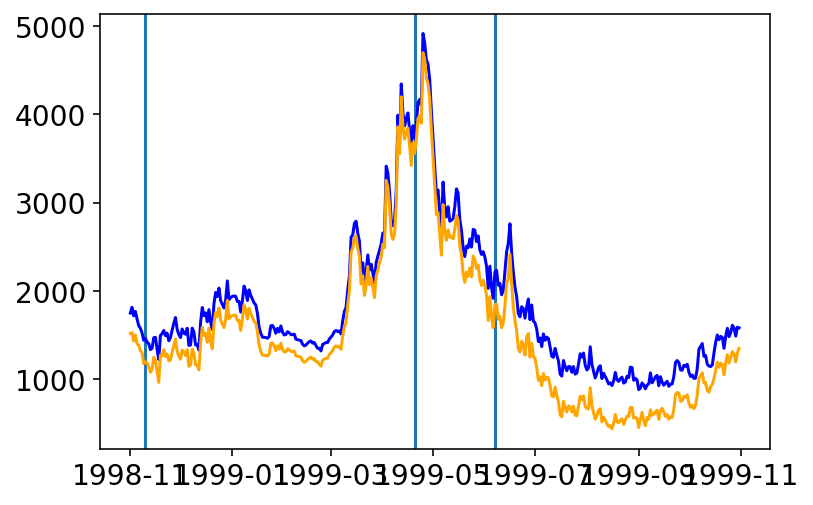

5427530.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
4356    2101.344410
4357    2034.438898
4358    2002.519458
4359    1903.450705
4360    1949.081476
Name: Q_impact, Length: 4361, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


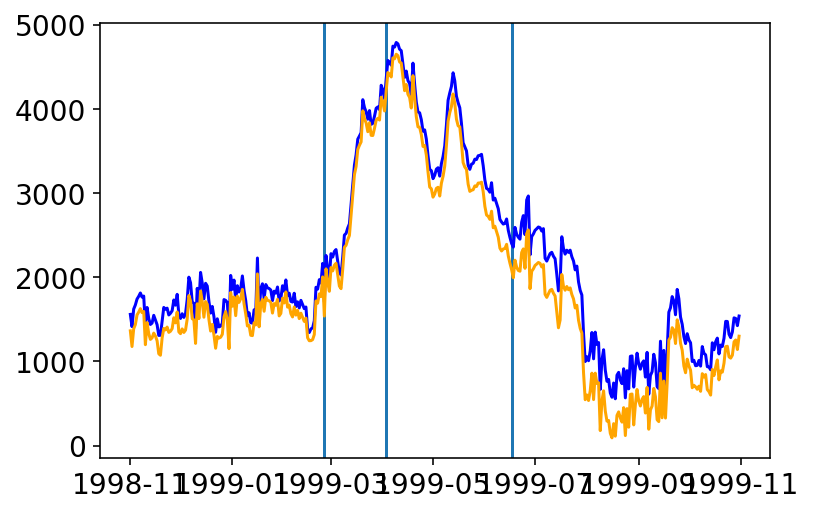

4062011.csv
0        1133.441900
1                NaN
2        1133.441900
3        1133.441900
4        1123.650989
            ...     
11296    2493.780726
11297    2290.669176
11298    2339.518573
11299    2241.740282
11300    2155.066160
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


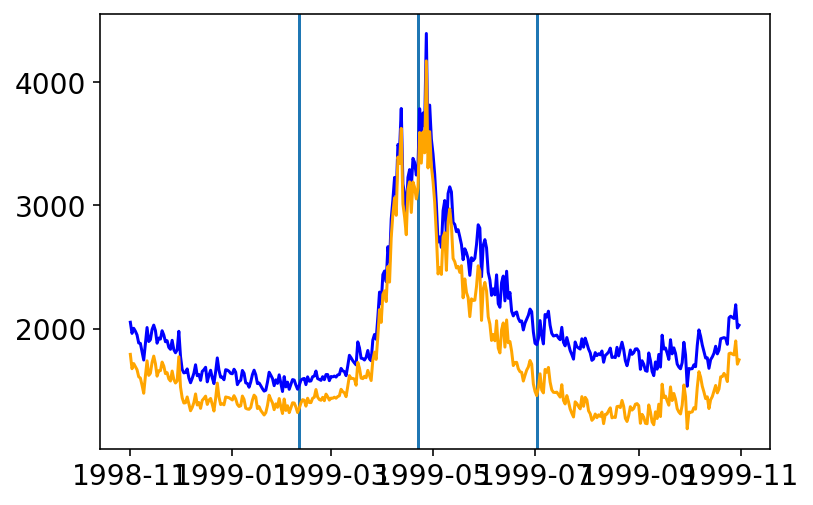

53674464.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
5382    1681.398202
5383    1150.212671
5384    1291.181818
5385    1219.619726
5386    1167.643209
Name: Q_impact, Length: 5387, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


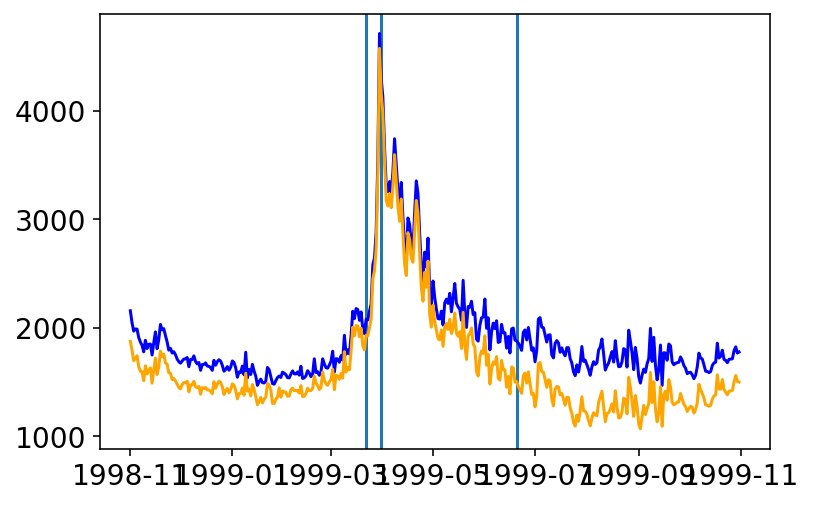

5369000.csv
0        1229.230197
1        1312.531151
2        1387.682385
3        1345.638361
4        1312.695129
            ...     
11296    1890.607925
11297    2090.612422
11298    2030.700365
11299    1876.817910
11300    1916.987697
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


no baseflow duration stat


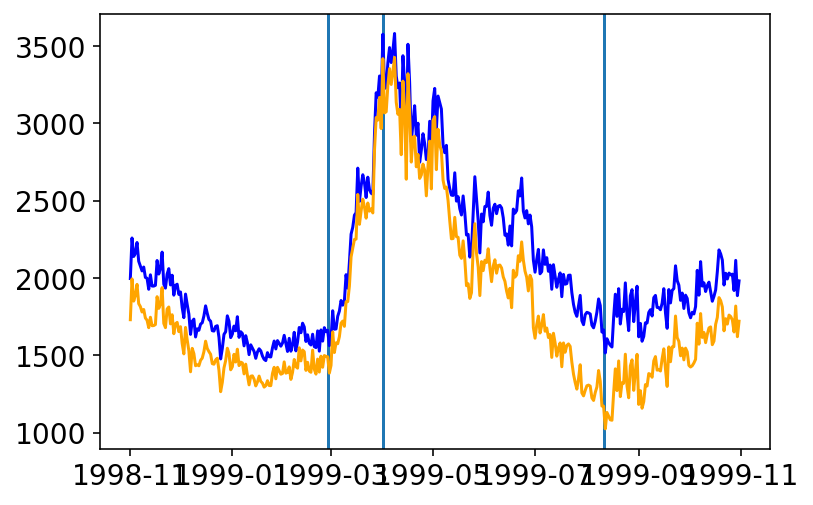

4073468.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
8174    3172.850047
8175    2210.909255
8176    3489.416998
8177    2527.633138
8178    3761.722276
Name: Q_impact, Length: 8179, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


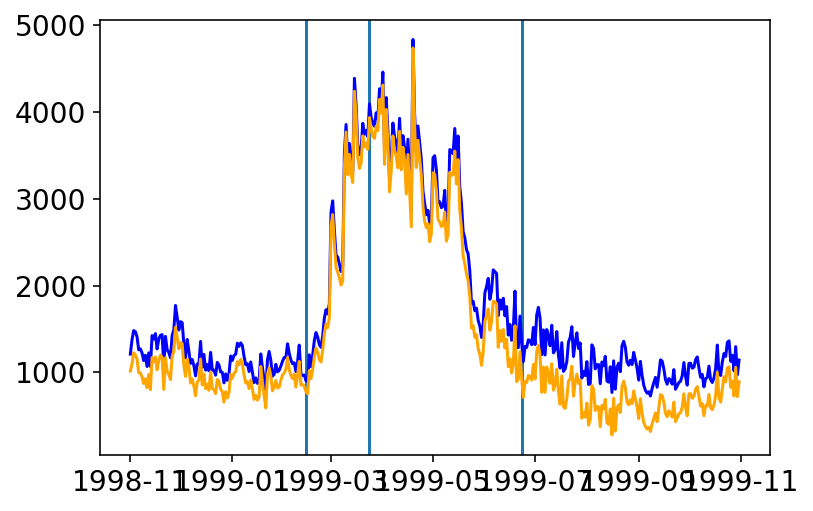

4067958.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
8374    2171.276969
8375    2122.706525
8376    2076.690943
8377    2050.552339
8378    1983.414940
Name: Q_impact, Length: 8379, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


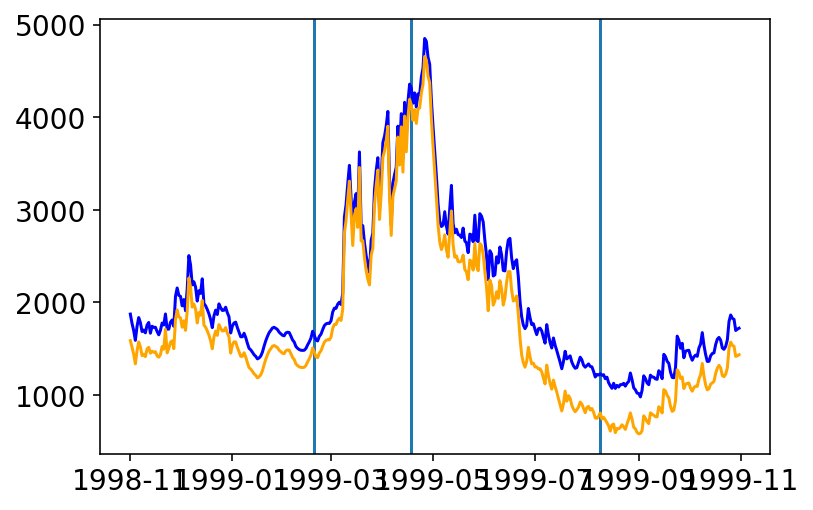

5424000.csv
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
5382    389.097310
5383    326.150841
5384    249.246754
5385    336.037219
5386    368.775837
Name: Q_impact, Length: 5387, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipython-input-29-82688014335a>:13: RuntimeWarning: All-NaN slice encountered
  maxflows = [np.nanmax(hydrograph[hydrograph.year==yr].flow.values) for yr in hydrograph.year.drop_duplicates().values]
<ipytho

<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


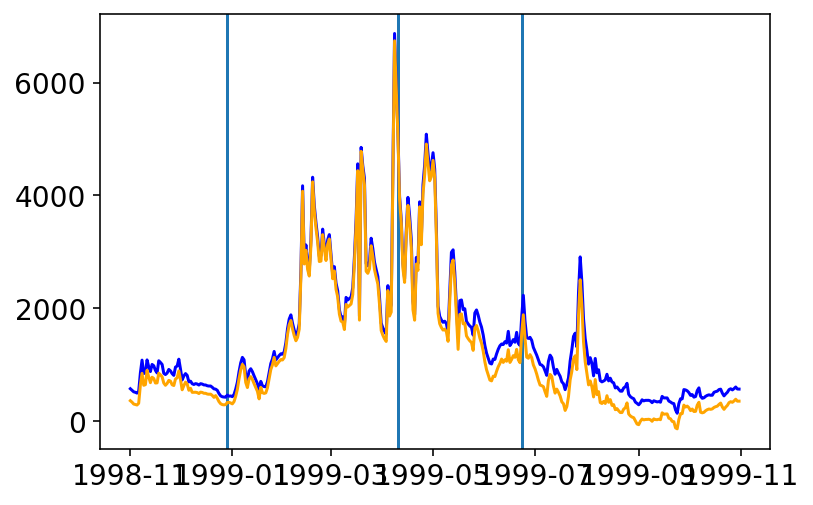

4066500.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
7644    2306.047522
7645    2230.409214
7646    2213.064586
7647    2221.747914
7648    2224.198395
Name: Q_impact, Length: 7649, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


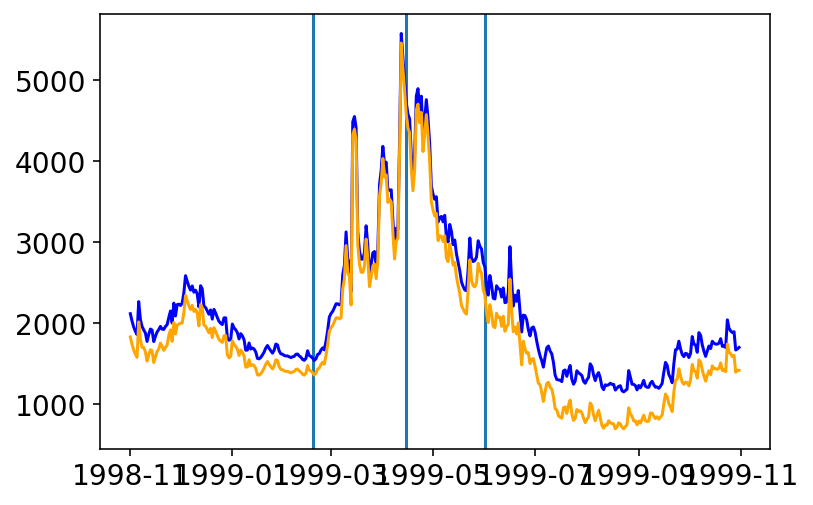

4078500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
10200    1672.601332
10201    1688.407492
10202    1646.521287
10203    1650.299830
10204    1655.979573
Name: Q_impact, Length: 10205, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


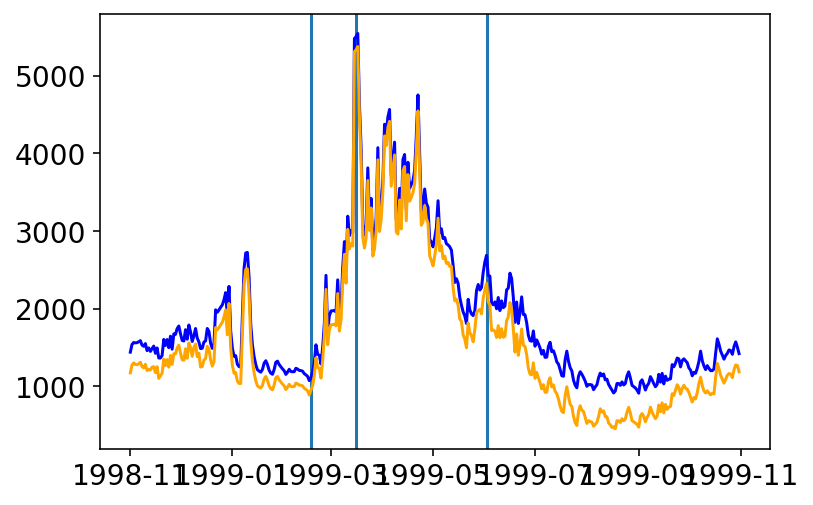

5432500.csv
0                NaN
1                NaN
2                NaN
3                NaN
4                NaN
            ...     
11296    1924.730725
11297    1883.040147
11298    1876.582334
11299    1856.678697
11300    1859.812085
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


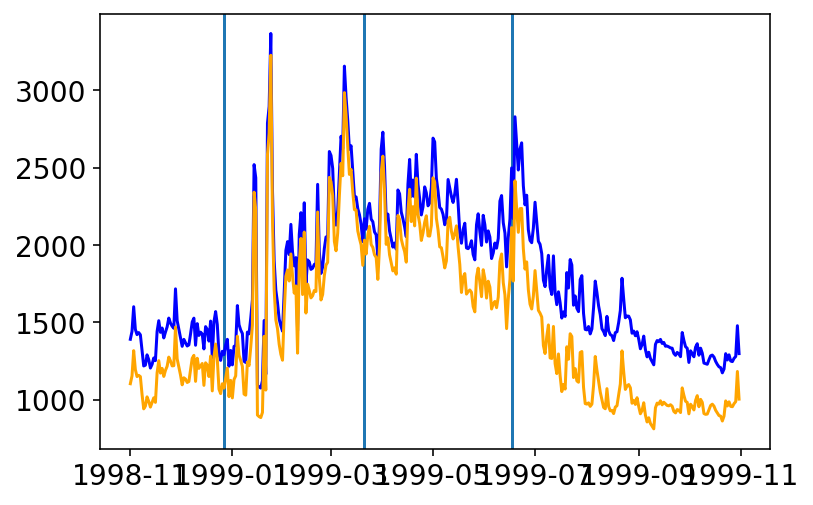

40263205.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
8009    1769.228645
8010    1763.492576
8011    1768.068371
8012    1780.327778
8013    1777.138822
Name: Q_impact, Length: 8014, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


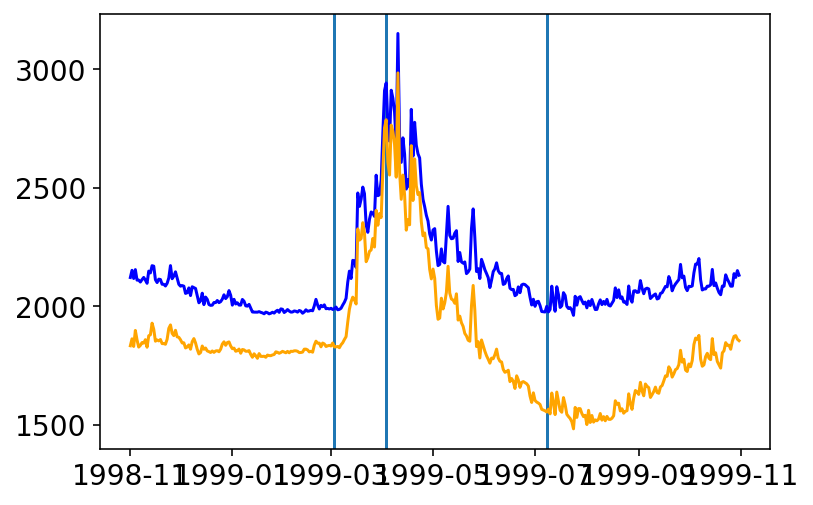

5382267.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
4722    1866.381364
4723    1861.131639
4724    1852.787612
4725    1837.163899
4726    1841.791473
Name: Q_impact, Length: 4727, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:435: RuntimeWarning: invalid value encountered in double_scalars
  baseflow_lowduration_diff = (baseflow_lowduration_impact-baseflow_lowduration)/baseflow_lowduration


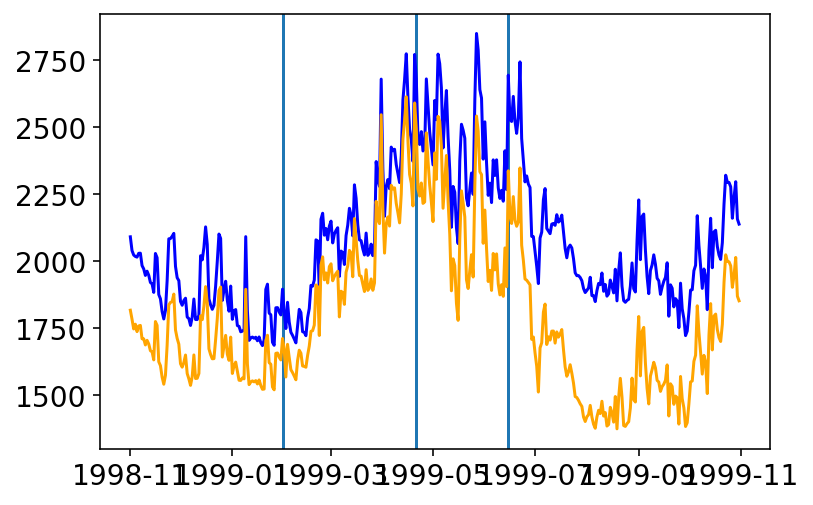

5427085.csv
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
           ...     
8374    2990.787747
8375    2918.538900
8376    2864.523234
8377    2745.074467
8378    2719.846355
Name: Q_impact, Length: 8379, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:514: RuntimeWarning: All-NaN axis encountered
  amin = pd.to_datetime(a[a==np.nanmin(a)].index.values[0])


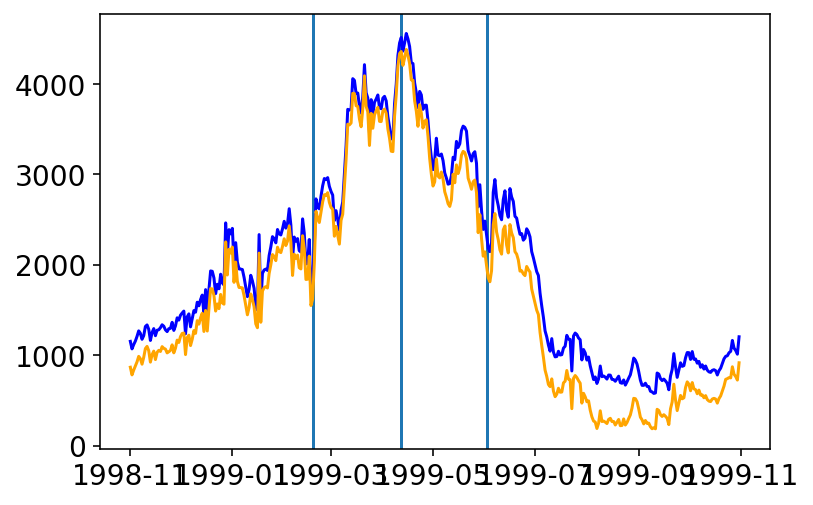

4087070.csv
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
6183    308.789336
6184    274.656961
6185    288.136051
6186    279.062561
6187    274.978199
Name: Q_impact, Length: 6188, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


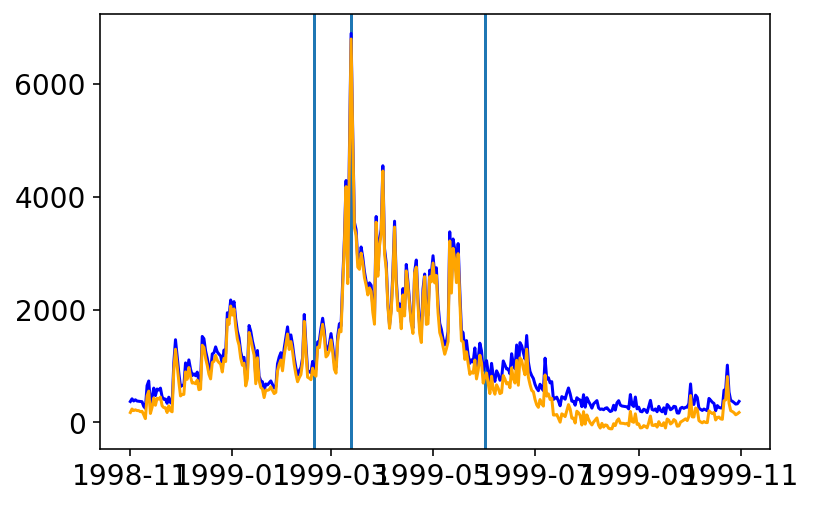

4077630.csv
0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
10200   NaN
10201   NaN
10202   NaN
10203   NaN
10204   NaN
Name: Q_impact, Length: 10205, dtype: float64


/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


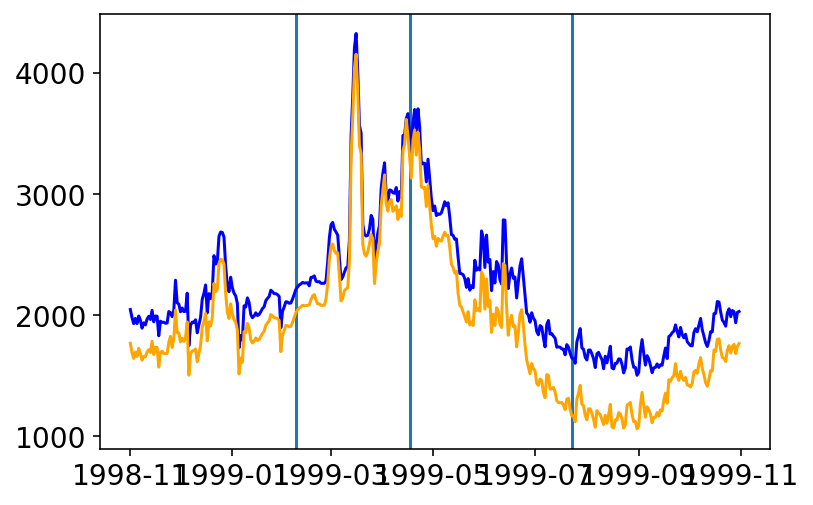

5398000.csv
0         669.866023
1         557.195680
2         590.482952
3         623.670934
4         857.625105
            ...     
11296    1748.683964
11297    1827.188364
11298    1505.994522
11299    1451.096276
11300    1786.280952
Name: Q_impact, Length: 11301, dtype: float64


<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]


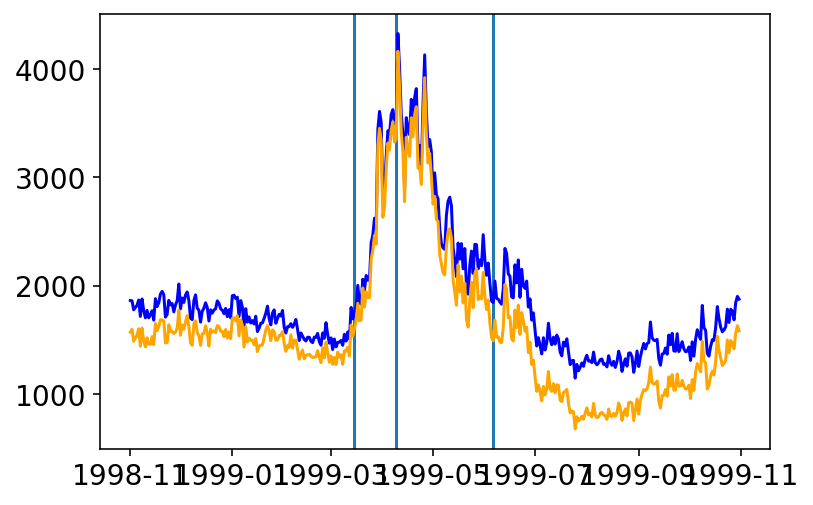

5431022.csv
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
7207    940.134986
7208    197.449810
7209    199.590780
7210    196.102034
7211     19.219131
Name: Q_impact, Length: 7212, dtype: float64


<ipython-input-29-82688014335a>:169: RuntimeWarning: divide by zero encountered in double_scalars
  baseflow_q95_diff = (baseflow_q95_impact-baseflow_q95)/baseflow_q95*100
<ipython-input-29-82688014335a>:428: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend = baseflow_lowsmooth.loc[baseflow_lowstart:][baseflow_lowsmooth.Q_m3d>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:430: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  baseflow_lowend_impact = baseflow_lowsmooth_impact.loc[baseflow_lowstart_impact:][baseflow_lowsmooth_impact.Q_impact>baseflow_q95].reset_index().datetime.values[0]
<ipython-input-29-82688014335a>:594: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(hydro)
<ipython-input-29-82688014335a>:595: RuntimeWarning: Mean of empty slice
  mn_impact = np.nanmean(hydro_impact)


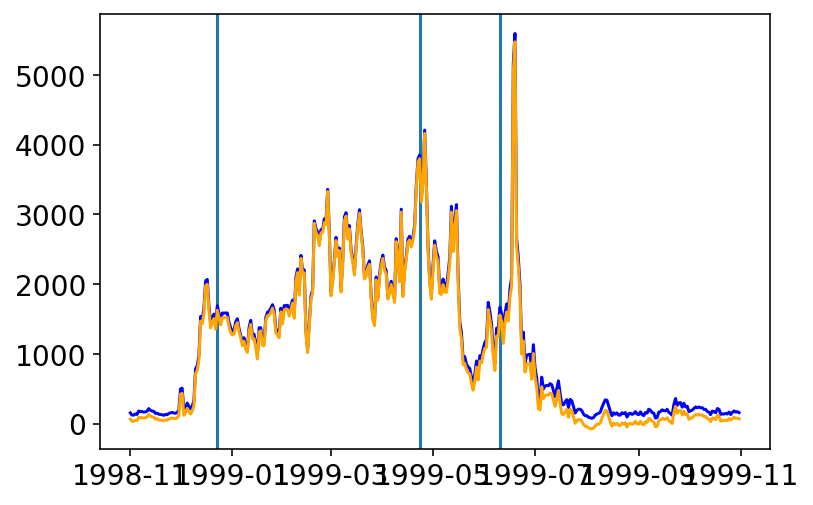

In [30]:
columns=['site_number','Q50_baseflow','Q90_baseflow','CV_baseflow',
        'Q5_baseflow','Q95_baseflow','low_duration','low_timing','freshet_Q5','freshet_Q95',
        'freshet_q50','freshet_rate_change','freshet_CV','recession_rate_change','recession_CV','recession_q50',
        'recession_Q5','recession_Q95','annual_Q5','2yr_frequency','5yr_frequency','10yr_frequency',
        'annual_Q95','2yr','5yr','10yr','freshet_2yr','freshet_5yr','freshet_10yr','recession_2yr',
        'recession_5yr','recession_10yr','frequency_Q95', 'frequency_Q5',
        'frequency_Q5_baseflow','frequency_Q5_freshet','frequency_Q5_recession',
        'frequency_Q95_baseflow','frequency_Q95_freshet','frequency_Q95_recession','date_freshet',
        'date_recession','date_baseflow','pump_rate','length_freshet', 'length_recession', 'length_baseflow',
        'baseflow_daily_roc', 'baseflow_min_date', 'baseflow_max_date', 'freshet_min_date', 
        'freshet_max_date', 'recession_min_date','recession_max_date', 'annual_min_date',
        'annual_max_date', 'perc_year_above_mean', 'perc_year_below_mean']

data = {val:[] for val in columns}
pump_stats = pd.DataFrame.from_dict(data)

USGS_ref = os.listdir(litrev_dir+'streamflow_data')
USGS_ref = [f for f in USGS_ref if f!='temp_data_noaa.csv']

for site in USGS_ref:
    print(site)
    flow_data = pd.read_csv(litrev_dir+'streamflow_data/'+site)
    flow_data = flow_data.reset_index()
    flow_data['datetime'] = pd.to_datetime(flow_data.datetime)
    if flow_data.datetime.iloc[0].month>1 or flow_data.datetime.iloc[0].day>1:
        start_date = pd.to_datetime('1-1-'+str(flow_data.datetime.iloc[0].year))
        length = flow_data.datetime.iloc[0]-start_date
        datetimelist = pd.date_range(start_date, periods=length.days).tolist()
        data = {'datetime': datetimelist, 'Q_m3d': [np.nan]*len(datetimelist)}
        empty_df = pd.DataFrame.from_dict(data)
        flow_data = pd.concat([empty_df,flow_data],sort=False)
    flow_data = flow_data.set_index('datetime')


    pump_stats_diff = calc_pump_stats(flow_data,site)       
    new_stats = pd.DataFrame.from_dict(pump_stats_diff)
    pump_stats = pd.concat([pump_stats,new_stats],sort=False)
    pump_stats.to_csv('pump_stats_update.csv')


In [31]:
# print summary of results across all sites

print('metric','median','25th percentile','75th percentile')
for col in pump_stats.columns:
    if col not in ['site_number','pump_rate']:
        sub = pump_stats[~(pump_stats[col].isna())]
        med = np.nanmedian(sub[col].values)
        p25 = np.nanpercentile(sub[col].values,25)
        p75 = np.nanpercentile(sub[col].values,75)
        print(col,med,p25,p75)

metric median 25th percentile 75th percentile
Q50_baseflow -24.075585933982786 -35.222182797347955 -18.301960932190493
Q90_baseflow -51.835931865345856 -101.23963372346434 -36.26549826224414
CV_baseflow 19.48690877139355 14.758420457062641 24.60452152532396
Q5_baseflow -7.704403345431824 -11.786357202306121 -5.572490606727619
Q95_baseflow -67.6902190484642 -138.30310583425575 -43.499754762536504
low_duration nan nan nan
low_timing 0.0 0.0 0.0
freshet_Q5 -1.965889858832769 -2.755632012627981 -1.1467811563371866
freshet_Q95 -17.45667070969907 -27.434196357249043 -12.428989907588264
freshet_q50 -6.72081642793917 -8.730241086682767 -5.634676847857238
freshet_rate_change 0.007861601166818381 -0.003184265839007382 0.03234941798493737
freshet_CV 5.356742929847265 3.903869274021713 6.476857107342987
recession_rate_change 0.0876185519472414 0.025226383172497212 0.221529716161174
recession_CV 9.017995972077586 7.114663619969049 11.83321860619837
recession_q50 -10.926637060949183 -14.945202963137

/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1111: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/Dana/miniconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


(10592.0, 10956.0)

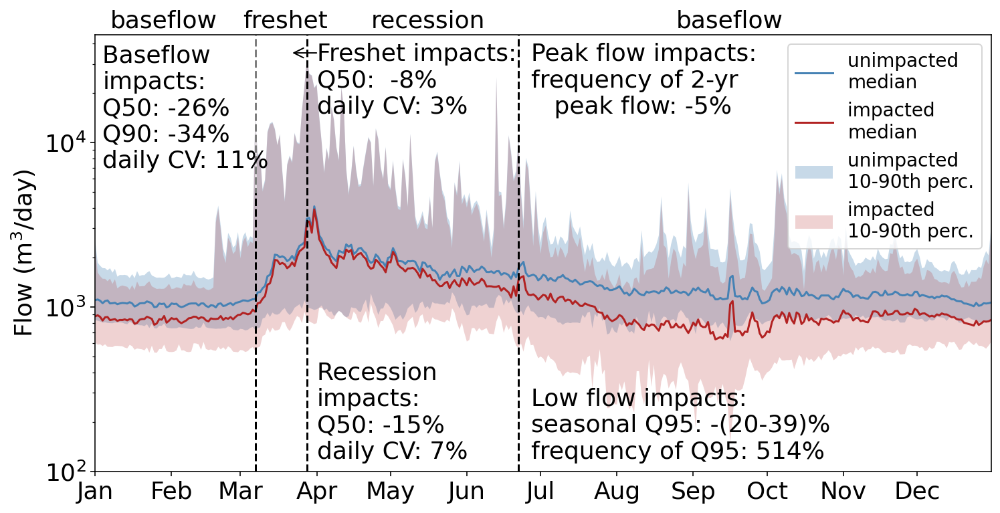

In [138]:
import datetime

fs = 18
%config InlineBackend.figure_format = 'retina'
plt.rcParams.update({'font.size': fs})

site = 5370000
stats = pump_stats[pump_stats.site_number==str(site)+'.csv']
site_num = str(site)

flow_data = pd.read_csv(litrev_dir+'streamflow_data/'+site_num+'.csv')
flow_data = flow_data.reset_index()
flow_data['datetime'] = pd.to_datetime(flow_data.datetime)
flow_data = flow_data.set_index('datetime')
flow_data['discharge_cmd'] = flow_data.Q_m3d

annual_hydro = flow_data.reset_index()
annual_hydro = annual_hydro[~(annual_hydro.datetime.dt.month==2) | ~(annual_hydro.datetime.dt.day==29)]
annual_hydro['datetime'] = np.where(annual_hydro.datetime.dt.month>=11,
                                 annual_hydro['datetime'].apply(lambda x: x.replace(year = 1998)),
                                 annual_hydro['datetime'].apply(lambda x: x.replace(year = 1999)))

annual_hydro = annual_hydro.set_index('datetime').sort_index()

annual_median = annual_hydro.resample('D').apply(resample_median)

# find season boundaries
spring_check = annual_median[~(annual_median.Q_m3d.isna())].loc[pd.to_datetime('11-1-1998'):pd.to_datetime('4-1-1999')]
popt, error = broken_stick_fit(list(range(len(spring_check))),
                spring_check.Q_m3d)
[threshold, b1, b2, a1] = popt
ypredict = func_broken_stick(np.array(list(range(len(spring_check)))),
                             (threshold), b1, b2, a1)
freshet_start_date = (spring_check.index.values[int(round(threshold))])

recess_check = annual_median[~(annual_median.Q_m3d.isna())].loc[pd.to_datetime('3-1-1999'):pd.to_datetime('7-15-1999')]
popt, error = broken_stick_fit(list(range(len(recess_check))),
                recess_check.Q_m3d)
[threshold, b1, b2, a1] = popt
ypredict = func_broken_stick(np.array(list(range(len(recess_check)))),
                             (threshold), b1, b2, a1)
recession_start_date = (recess_check.index.values[int(round(threshold))])

baseflow_check = annual_median[~(annual_median.Q_m3d.isna())].loc[pd.to_datetime('6-1-1999'):pd.to_datetime('10-1-1999')]
popt, error = broken_stick_fit(list(range(len(baseflow_check))),
                baseflow_check.Q_m3d)
[threshold, b1, b2, a1] = popt
ypredict = func_broken_stick(np.array(list(range(len(baseflow_check)))),
                             (threshold), b1, b2, a1)
baseflow_start_date = (baseflow_check.index.values[int(round(threshold))])


# pick pump rate as 1.25 times baseflow median
annual_hydro = annual_hydro.sort_index()
baseflow = pd.concat([annual_hydro.loc[:freshet_start_date],annual_hydro.loc[baseflow_start_date:]])
baseflow_med = pd.concat([annual_median.loc[:freshet_start_date],annual_median.loc[baseflow_start_date:]])

pump_rate = np.nanmedian(baseflow)*1.25
pumprate_diff = abs(pump_range-pump_rate)
pump_rate = pump_rates[list(pumprate_diff).index(min(pumprate_diff))]

flow_data = flow_data.reset_index()
impacts = pd.read_csv(litrev_dir+'pump_impacts/'+str(pump_rate)+'_impacts.csv').drop(columns=['Unnamed: 0','times'])
flow_data = (flow_data.merge(impacts,left_index=True,right_index=True)).set_index('datetime')
flow_data['discharge_impact'] = flow_data.discharge_cmd-flow_data.Qs
flow_data = flow_data.reset_index()[(flow_data.reset_index().datetime.dt.month!=2)|(flow_data.reset_index().datetime.dt.day!=29)].set_index('datetime')
flow_data['date'] = np.where(flow_data.reset_index().datetime.dt.month>=1,
                             flow_data.reset_index()['datetime'].apply(lambda x: x.replace(year = 1999)),
                             flow_data.reset_index()['datetime'].apply(lambda x: x.replace(year = 1999)))
flow_data1 = flow_data.set_index('date').sort_index()
impacted_ave = flow_data1


#plot example impacts
fig,ax = plt.subplots(1,figsize=(12,6))

ax.plot(impacted_ave.resample('D').mean().index,impacted_ave.Q_m3d.resample('D').apply(resample_median),
        c='steelblue',label='unimpacted \nmedian')
ax.fill_between(impacted_ave.resample('D').mean().index,impacted_ave.Q_m3d.resample('D').apply(resample_10perc),
                impacted_ave.Q_m3d.resample('D').apply(resample_90perc),
                facecolor='steelblue',alpha=0.3,label='unimpacted \n10-90th perc.')

ax.plot(impacted_ave.resample('D').mean().index,
        impacted_ave.discharge_impact.resample('D').apply(resample_median),c='firebrick',label='impacted \nmedian')
ax.fill_between(impacted_ave.resample('D').mean().index,impacted_ave.discharge_impact.resample('D').apply(resample_10perc),
                impacted_ave.discharge_impact.resample('D').apply(resample_90perc),
                facecolor='firebrick',alpha=0.2,label='impacted \n10-90th perc.')

freshet_start = pd.to_datetime('3-5-1999')
ax.axvline(freshet_start_date,c='k',linestyle='--')
recession_start = pd.to_datetime('4-1-1999')
ax.axvline(recession_start_date,c='k',linestyle='--')
baseflow_start = pd.to_datetime('6-25-1999')
ax.axvline(baseflow_start_date,c='k',linestyle='--')



ax.set_ylabel('Flow (m$^3$/day)')
ax.set_yscale('log')
ax.set_xlim(pd.to_datetime('11-1-1998'),pd.to_datetime('10-31-1999'))
ax.text(pd.to_datetime('1-7-1999'), 50000, 
        'baseflow', fontsize=fs)
ax.text(pd.to_datetime('8-25-1999'), 50000
        , 'baseflow', fontsize=fs)
ax.text(pd.to_datetime('4-23-1999'), 50000
        , 'recession', fontsize=fs)
ax.text(pd.to_datetime('3-2-1999'), 50000
        , 'freshet', fontsize=fs)


plt.plot([freshet_start_date,freshet_start_date],[50000,5000],c='white',alpha=0.5)

ax.text(pd.to_datetime('1-4-1999'),7000,
        'Baseflow \nimpacts:\n'+
       'Q50: %3.0f' % (stats.Q50_baseflow) +'%\n'+
        'Q90: %3.0f' % (stats.Q90_baseflow)+'%\n'+
        'daily CV: %1.0f' % (stats.CV_baseflow)+'%',
        fontsize = fs)

ax.text(pd.to_datetime('4-1-1999'),120,
        'Recession \nimpacts:\n'+
        'Q50: %3.0f' % (stats.recession_q50) + '%\n'+
        'daily CV: %1.0f' % (stats.recession_CV)+'%',
        fontsize = fs)

ax.text(pd.to_datetime('4-1-1999'),15000,
        'Freshet impacts:\n'+
        'Q50: %3.0f' % (stats.freshet_q50) + '%\n'+
        'daily CV: %1.0f' % (stats.freshet_CV)+'%',
        fontsize = fs)

ax.text(pd.to_datetime('6-27-1999'),15000,
        'Peak flow impacts:\n'+
        'frequency of 2-yr \n   peak flow: %2.0f' % (stats['2yr_frequency']) +'%',
        fontsize = fs)
        
ax.text(pd.to_datetime('6-27-1999'),120,
        'Low flow impacts:\n'+
        'seasonal Q95: -(20-39)%\n'+
        'frequency of Q95: %3.0f' %(stats['frequency_Q95']) +'%',
        fontsize = fs)

ax.annotate("", xy=(pd.to_datetime('3-21-1999'), 35000), 
            xytext=(pd.to_datetime('4-2-1999'), 35000), 
            arrowprops=dict(arrowstyle="->"))


date_form = DateFormatter("%b")
ax.xaxis.set_major_formatter(date_form)
ax.legend(loc='upper right',fontsize = 14)
ax.set_ylim(100,45000)
ax.set_xlim(pd.to_datetime('1-1-1999'),pd.to_datetime('12-31-1999'))


In [139]:
# print stats for example above
stats

,site_number,Q50_baseflow,Q90_baseflow,CV_baseflow,Q5_baseflow,Q95_baseflow,low_duration,low_timing,freshet_Q5,freshet_Q95,...,baseflow_min_date,baseflow_max_date,freshet_min_date,freshet_max_date,recession_min_date,recession_max_date,annual_min_date,annual_max_date,perc_year_above_mean,perc_year_below_mean
0,5370000.csv,-26.084338,-34.183672,10.557453,-15.116844,-38.7499,NaN,-11.0,-0.821205,-21.294949,...,NaN,NaN,0.0,0.0,0.0,0.0,0.0,128.0,0.94173,-0.173461
